### Table of contents
1. [Supp Figure 3A. Dotplot of type II and type I IFN genes in broad cell types](#1)
2. [Supp Figure 3B. Heatmap summarizing sample-level linear models within each cell type predicting IFNG CytoSig Score from CD8, CD8 NK-like, and NK proportions, IFNG expression, and IFN1 CytoSig Score ](#2)
3. [Supp Figure 3C. Scatterplot showing correlation between CD8 proportion and IFNG response within TAM](#3)
4. [Supp Figure 3D. Heatmap summarizing sample-level linear models within each cell type predicting IFN1 CytoSig Score from broad cell type proportions and IFNG CytoSig Score](#4)
5. [Supp Figure 3E. Scatterplot showing correlation between Tumor proportion and IFN1 response within Monocytes](#5)
6. [Supp Figure 3F. Heatmap summarizing sample-level linear models within each cell type predicting IFN1 CytoSig Score from broad cell type proportions and IFNG CytoSig Score, excluding patient UT2](#6)
7. [Supp Figure 4A. UMAP of CD8 T cells and barplots showing proportion of each sample in each cluster](#7)
8. [Supp Figure 4B. Heatmap of CD8 subset markers](#7)
9. [Supp Figure 4C. Dotplot of key phenotypic markers for CD8 subsets used in linear models for IFNg signaling](#9)
10. [Supp Figure 4D. UMAP of TAM and barplots showing proportion of each sample in each cluster](#10)
11. [Supp Figure 4E. Heatmap of TAM subset markers](#11)
12. [Supp Figure 4F-G. Heatmap of M1 and M2 markers](#12)

In [1]:
library(harmony)
library(car)
library(stringr)
library(Seurat)
library(useful)
library(dplyr)
library(ggpubr)
library(ggrepel)
library(glue)
library(RColorBrewer)
library(ggpubr)
library(ggrepel)
library(lmerTest)
library(Scillus)
library(cowplot)
library(hrbrthemes)
library(ggridges)
library(pheatmap)
library(ggplot2)
library(magrittr)
library(broom)
library(viridis)
library(yarrr)
library(reshape2)
library(ggrastr)

set.seed(1234)

options(repr.plot.width=12, repr.plot.height=9)

Loading required package: Rcpp

Loading required package: carData

Attaching SeuratObject

Attaching sp

Loading required package: ggplot2


Attaching package: 'dplyr'


The following object is masked from 'package:car':

    recode


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


Loading required package: lme4

Loading required package: Matrix


Attaching package: 'lmerTest'


The following object is masked from 'package:lme4':

    lmer


The following object is masked from 'package:stats':

    step



Attaching package: 'cowplot'


The following object is masked from 'package:ggpubr':

    get_legend


NOTE: Either Arial Narrow or Roboto Condensed fonts are required to use these themes.

      Please use hrbrthemes::import_roboto_condensed() to install Roboto Condensed and

      if Arial Narrow is not on your system, please see https://bit.ly/arialnarrow

Loa

### Create figure output directory

In [2]:
dir.create("../../Supp_Figures_Final/Figure_S3_S4")

### Read in data and colors

[1] 259

[1] "ADAR"     "B2M"      "BATF2"    "BST2"     "C1S"      "CASP1"   
  [7] "CASP8"    "CCRL2"    "CD47"     "CD74"     "CMPK2"    "CMTR1"   
 [13] "CNP"      "CSF1"     "CXCL10"   "CXCL11"   "DDX60"    "DHX58"   
 [19] "EIF2AK2"  "ELF1"     "EPSTI1"   "GBP2"     "GBP4"     "GMPR"    
 [25] "HELZ2"    "HERC6"    "HLA-C"    "IFI27"    "IFI30"    "IFI35"   
 [31] "IFI44"    "IFI44L"   "IFIH1"    "IFIT2"    "IFIT3"    "IFITM1"  
 [37] "IFITM2"   "IFITM3"   "IL15"     "IL4R"     "IL7"      "IRF1"    
 [43] "IRF2"     "IRF7"     "IRF9"     "ISG15"    "ISG20"    "LAMP3"   
 [49] "LAP3"     "LGALS3BP" "LPAR6"    "LY6E"     "MOV10"    "MVB12A"  
 [55] "MX1"      "NCOA7"    "NMI"      "NUB1"     "OAS1"     "OASL"    
 [61] "OGFR"     "PARP12"   "PARP14"   "PARP9"    "PLSCR1"   "PNPT1"   
 [67] "PROCR"    "PSMA3"    "PSMB8"    "PSMB9"    "PSME1"    "PSME2"   
 [73] "RIPK2"    "RNF31"    "RSAD2"    "RTP4"     "SAMD9"    "SAMD9L"  
 [79] "SELL"     "SLC25A28" "SP110"    "STAT2"    "TAP1"     "TDRD7"   
 [85] "TENT5A"   "TMEM140"  "TRAFD1"   "TRIM14"   "TRIM21"   "TRIM25"  
 [91] "TRIM26"   "TRIM5"    "TXNIP"    "UBA7"     "UBE2L6"   "USP18"   
 [97] "WARS1"    "APOL6"    "ARID5B"   "ARL4A"    "AUTS2"    "BANK1"   
[103] "BPGM"     "BTG1"     "C1R"      "CASP3"    "CASP4"    "CASP7"   
[109] "CCL2"     "CCL5"     "CCL7"     "CD274"    "CD38"     "CD40"    
[115] "CD69"     "CD86"     "CDKN1A"   "CFB"      "CFH"      "CIITA"   
[121] "CMKLR1"   "CSF2RB"   "CXCL9"    "EIF4E3"   "FAS"      "FCGR1A"  
[127] "FGL2"     "FPR1"     "GBP6"     "GCH1"     "GPR18"    "GZMA"    
[133] "HIF1A"    "HLA-A"    "HLA-B"    "HLA-DMA"  "HLA-DQA1" "HLA-DRB1"
[139] "HLA-G"    "ICAM1"    "IDO1"     "IFIT1"    "IFNAR2"   "IL10RA"  
[145] "IL15RA"   "IL18BP"   "IL2RB"    "IL6"      "IRF4"     "IRF5"    
[151] "IRF8"     "ISOC1"    "ITGB7"    "JAK2"     "KLRK1"    "LATS2"   
[157] "LCP2"     "LYSMD2"   "MARCHF1"  "METTL7B"  "MT2A"     "MTHFD2"  
[163] "MVP"      "MX2"      "MYD88"    "NAMPT"    "NCOA3"    "NFKB1"   
[169] "NFKBIA"   "NLRC5"    "NOD1"     "NUP93"    "OAS2"     "OAS3"    
[175] "P2RY14"   "PDE4B"    "PELI1"    "PFKP"     "PIM1"     "PLA2G4A" 
[181] "PML"      "PNP"      "PSMA2"    "PSMB10"   "PSMB2"    "PTGS2"   
[187] "PTPN1"    "PTPN2"    "PTPN6"    "RAPGEF6"  "RBCK1"    "RIGI"    
[193] "RIPK1"    "RNF213"   "SAMHD1"   "SECTM1"   "SELP"     "SERPING1"
[199] "SLAMF7"   "SOCS1"    "SOCS3"    "SOD2"     "SPPL2A"   "SRI"     
[205] "SSPN"     "ST3GAL5"  "ST8SIA4"  "STAT1"    "STAT3"    "STAT4"   
[211] "TAPBP"    "TNFAIP2"  "TNFAIP3"  "TNFAIP6"  "TNFSF10"  "TOR1B"   
[217] "UPP1"     "VAMP5"    "VAMP8"    "VCAM1"    "XAF1"     "XCL1"    
[223] "ZBP1"     "ZNFX1"    "HSD17B1"  "CA2"      "CCNA1"    "CXCL1"   
[229] "GALC"     "IFI6"     "MCL1"     "ROBO1"    "SLC6A15"  "THBS1"   
[235] "TIMP3"    "DDX58"    "WARS"     "MARCH1"   "PRIC285"  "FTSJD2"  
[241] "NOS2"     "PDCD1LG2" "LGALS9"   "HMGB1"    "CEACAM1"  "FGL1"    
[247] "HLA-DRA"  "NECTIN2"  "PVR"      "SIGLEC10" "TNFRSF14" "VSIG4"   
[253] "VSIR"     "HLA-E"    "LGALS3"   "CD80"     "LILRB1"   "IL10"    
[259] "CCL22"

Tumor               TAM               CD8       Plasma cell 
        "#A0BAAC"         "#7FC97F"         "#C2AFCE"         "#E4B9A3" 
               DC       Endothelial          T-Helper                NK 
        "#FDC988"         "#FEEB93"         "#D1DD9E"         "#658DAA" 
         Monocyte             T-reg            B cell       CD8 NK-like 
        "#704BA0"         "#D31286"         "#DD2456"         "#C2541E" 
       Fibroblast Perivascular cell            Contam           Omitted 
        "#95603B"         "#666666"          "grey95"          "grey95"


IO Exposed   IO Naive 
    104514     184254 


            Tumor        Fibroblast Perivascular cell       Endothelial 
            18994               277              1691              1781 
              TAM          Monocyte                DC               CD8 
            27684             15072              4522             88457 
      CD8 NK-like                NK          T-Helper             T-reg 
            13563             20422             22656              8618 
           B cell       Plasma cell 
             3330              1304 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



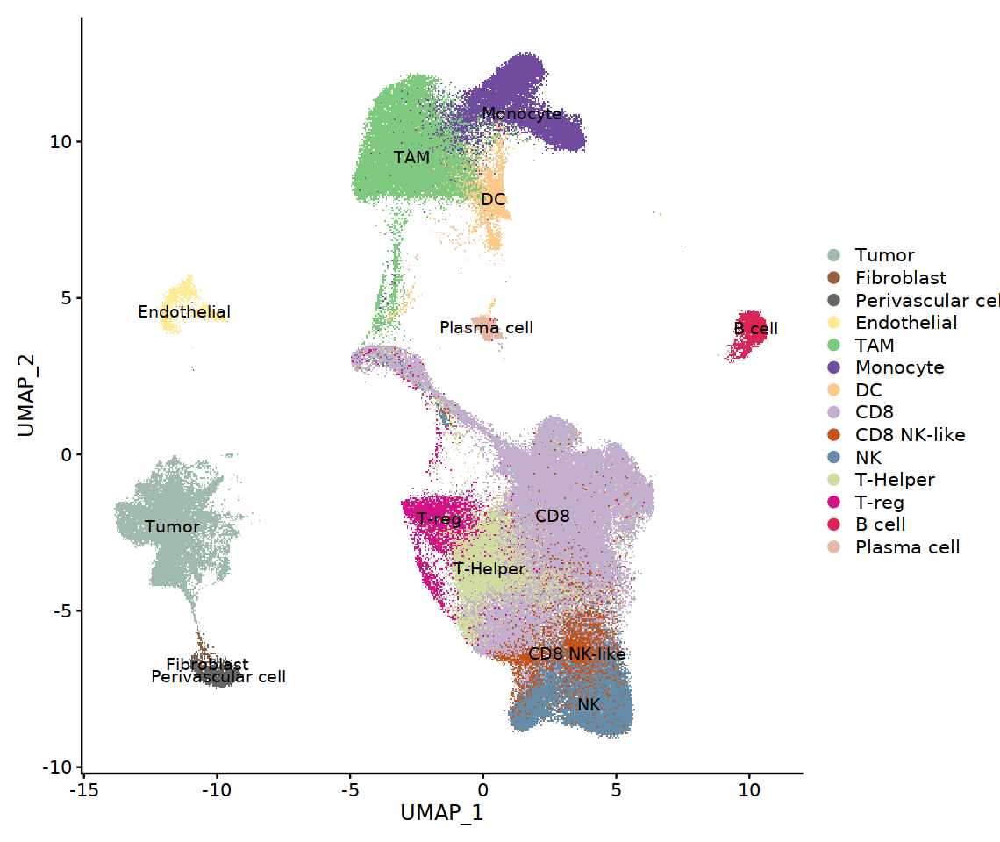

In [3]:
options(repr.plot.width=9.5, repr.plot.height=8)

goi = readRDS("../../Signatures/manuscript_goi_hallmark_benciminn_curated.RDS")
length(goi)

goi

##

celltype_cols = readRDS(file = "../../Data_Objects/celltype_cols.RDS")
celltype_cols

##

seur_full = readRDS("../../Data_Objects/seur_full_BBK_Manuscript.RDS")
table(seur_full$IO_Treated)

Idents(seur_full) = "BBK_Broad_Celltype"

seur_full = subset(seur_full, idents = c("Contam","Omitted"), invert = T)

seur_full$BBK_Broad_Celltype = factor(seur_full$BBK_Broad_Celltype, levels = c("Tumor","Fibroblast","Perivascular cell","Endothelial","TAM","Monocyte","DC","CD8","CD8 NK-like","NK","T-Helper","T-reg","B cell","Plasma cell"))
Idents(seur_full) = "BBK_Broad_Celltype"
table(Idents(seur_full))

DimPlot(seur_full, label = T, cols = celltype_cols[levels(Idents(seur_full))], shuffle = F)

### Supp Figure 3A. Dotplot of type II and type I IFN genes in broad cell types <a name="1"></a>

In [4]:
receptors = c("IFNLR1","IFNGR1","IFNGR2","IFNAR1","IFNAR2")

In [5]:
ifng = "IFNG"
ifna = grep("IFNA",row.names(seur_full),ignore.case = T, value = T)
ifnb = grep("IFNB",row.names(seur_full),ignore.case = T, value = T)

In [6]:
ifns = setdiff(c(ifng, ifna, ifnb),receptors)
ifns

[1] "IFNG"  "IFNA5" "IFNA2" "IFNB1"

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



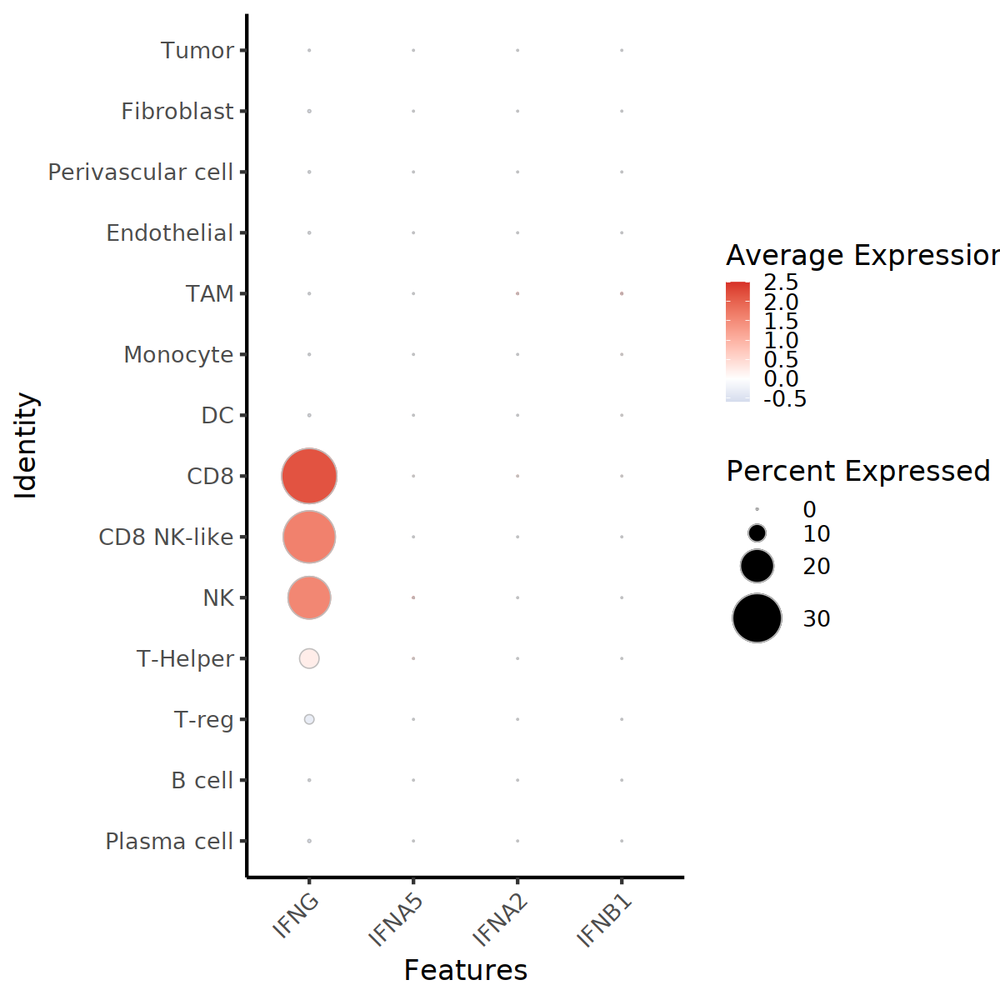

In [7]:
options(repr.plot.width=10, repr.plot.height=10)

seur_full$BBK_Broad_Celltype = factor(seur_full$BBK_Broad_Celltype, levels = rev(c("Tumor","Fibroblast","Perivascular cell","Endothelial","TAM","Monocyte","DC","CD8","CD8 NK-like","NK","T-Helper","T-reg","B cell","Plasma cell")))

DotPlot(seur_full, features = ifns,group.by = "BBK_Broad_Celltype",assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) 

seur_full$BBK_Broad_Celltype = factor(seur_full$BBK_Broad_Celltype, levels = c("Tumor","Fibroblast","Perivascular cell","Endothelial","TAM","Monocyte","DC","CD8","CD8 NK-like","NK","T-Helper","T-reg","B cell","Plasma cell"))

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS3A_IFNs_Dotplot.pdf", width = 10, height = 10)

### Supp Figure 3B. Heatmap summarizing sample-level linear models within each cell type predicting IFNG CytoSig Score from CD8, CD8 NK-like, and NK proportions, IFNG expression, and IFN1 CytoSig Score <a name="2"></a>

In [8]:
Idents(seur_full) = "BBK_Broad_Celltype_DE"
table(Idents(seur_full))


                      Tumor Perivascular_and_Fibroblast 
                      18994                        1968 
                Endothelial                         TAM 
                       1781                       27684 
                   Monocyte                          DC 
                      15072                        4522 
                        CD8                 CD8 NK-like 
                      88457                       13563 
                         NK                    T-Helper 
                      20422                       22656 
                      T-reg                      B cell 
                       8618                        3330 
                Plasma cell 
                       1304 

In [9]:
cytosig_binded_df = readRDS("../../Data_Objects/cytosig_binded_df_seur_full.RDS")
cytosig_df_list = readRDS("../../Data_Objects/cytosig_df_list_seur_full.RDS")

cytosig_binded_df = cytosig_binded_df[row.names(seur_full@meta.data),]
corner(cytosig_binded_df)

seur_full$IFNG = as.numeric(seur_full@assays$RNA@data["IFNG",])

setequal(row.names(cytosig_binded_df),row.names(seur_full@meta.data))
seur_full@meta.data = cbind(seur_full@meta.data, cytosig_binded_df)

head(seur_full@meta.data)

,Activin.A_CytoSig_Pval,BDNF_CytoSig_Pval,BMP2_CytoSig_Pval,BMP4_CytoSig_Pval,BMP6_CytoSig_Pval
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GTTCTCGAGAGGTAGA-1.5pool1_2,0.560,0.602,0.085,0.601,0.640
CTAGAGTCATCAGTCA-1.5pool1_2,0.106,0.521,0.004,0.014,0.591
CGGCTAGAGGTAGCCA-1.5pool1_2,0.196,0.482,0.137,0.000,0.212
CTGCTGTAGTGTTTGC-1.5pool1_2,0.056,0.437,0.082,0.000,0.658
CCATGTCCATCGATGT-1.5pool1_2,0.000,0.908,0.311,0.023,0.128


[1] TRUE

,orig.ident,nCount_RNA,nFeature_RNA,Sample,cell_id,Cohort,Chemistry,Treated,IO,TKI,...,MCSF_CytoSig_Zscore,NO_CytoSig_Zscore,OSM_CytoSig_Zscore,TGFB1_CytoSig_Zscore,TGFB3_CytoSig_Zscore,TNFA_CytoSig_Zscore,TRAIL_CytoSig_Zscore,TWEAK_CytoSig_Zscore,VEGFA_CytoSig_Zscore,WNT3A_CytoSig_Zscore
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GTTCTCGAGAGGTAGA-1.5pool1_2,SeuratProject,17633,4215,5pool1_2,GTTCTCGAGAGGTAGA-1.5pool1_2,Braun,5prime,No,No,No,...,1.001942,-2.1785066,7.098635,-6.051863,-3.642090287,-0.41856076,-1.6527684,1.6560727,0.8559922,-0.9644418
CTAGAGTCATCAGTCA-1.5pool1_2,SeuratProject,14519,4068,5pool1_2,CTAGAGTCATCAGTCA-1.5pool1_2,Braun,5prime,No,No,No,...,2.451215,2.2863716,4.748127,-1.362296,-2.708247286,-0.48596727,-1.7304320,-0.5288041,0.1061257,-0.4622783
CGGCTAGAGGTAGCCA-1.5pool1_2,SeuratProject,14443,3521,5pool1_2,CGGCTAGAGGTAGCCA-1.5pool1_2,Braun,5prime,No,No,No,...,1.972279,2.7810020,3.985758,-5.922315,-1.623494911,-0.94871751,-0.6126047,-0.5609818,1.7644153,-0.7546578
CTGCTGTAGTGTTTGC-1.5pool1_2,SeuratProject,12982,3884,5pool1_2,CTGCTGTAGTGTTTGC-1.5pool1_2,Braun,5prime,No,No,No,...,1.884094,0.2776511,7.290774,-1.029047,0.002435523,-0.02404577,0.2841661,-1.7388418,0.9394385,-1.4131691
CCATGTCCATCGATGT-1.5pool1_2,SeuratProject,12169,3542,5pool1_2,CCATGTCCATCGATGT-1.5pool1_2,Braun,5prime,No,No,No,...,1.908597,1.3299547,6.065471,-1.378182,-2.741233835,-0.44667532,0.1575640,-1.7970921,1.3198839,-0.6360882
TCTGAGAAGCGTAATA-1.5pool1_2,SeuratProject,11615,3479,5pool1_2,TCTGAGAAGCGTAATA-1.5pool1_2,Braun,5prime,No,No,No,...,1.927733,-0.6962092,2.503674,-2.224803,-0.886568092,-0.02225492,0.7431055,-0.4337432,2.3108286,-1.3662210


In [10]:
meta = seur_full@meta.data
meta = meta[,c("Cohort","Sample","Patient","SampleName","Biopsy","Stage_Corrected","Stage_Corrected_EarlyLate","IO_Treated","IO","BBK_Broad_Celltype_DE","BBK_Broad_Celltype","BBK_Final_Celltype","IFNG","IFNG_CytoSig_Zscore","IFN1_CytoSig_Zscore","IFNG_CytoSig_Pval","IFN1_CytoSig_Pval")]

resp_collapsed = meta %>%
group_by(BBK_Broad_Celltype_DE, Sample, Patient, Biopsy, Stage_Corrected, IO_Treated, IO)%>% 
summarise(IFNG_CytoSig_Zscore_Median=median(IFNG_CytoSig_Zscore),IFN1_CytoSig_Zscore_Median=median(IFN1_CytoSig_Zscore))
          
head(resp_collapsed)

`summarise()` has grouped output by 'BBK_Broad_Celltype_DE', 'Sample',
'Patient', 'Biopsy', 'Stage_Corrected', 'IO_Treated'. You can override using
the `.groups` argument.


BBK_Broad_Celltype_DE,Sample,Patient,Biopsy,Stage_Corrected,IO_Treated,IO,IFNG_CytoSig_Zscore_Median,IFN1_CytoSig_Zscore_Median
<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
Tumor,5pool1_2,S1,Kidney,I,IO Naive,No,-0.604802613,0.18369901
Tumor,Bi_0600855_T3,P55,Abdomen,IV,IO Exposed,PR,1.894924249,0.30303075
Tumor,Bi_0600906_T1,P906,Lymph_node,IV,IO Exposed,PD,-0.221275979,-2.01265965
Tumor,Bi_0600913_T1,P913,Lung,IV,IO Exposed,SD,0.002540806,0.08796527
Tumor,Bi_0600915_T1_TrueTumor,P915,Kidney,III,IO Exposed,PR,2.909868476,0.12830237
Tumor,Bi_0600916_T1,P916,Lymph_node,IV,IO Naive,No,-0.752818314,-1.89117550


### For cells of each broad cell type within a given sample, calculate its proportion out of the total sample and the % expressing IFNG

In [11]:
ifn_exp_list = list()

cyt = unique(as.character(seur_full$BBK_Broad_Celltype_DE))
cyt

for (i in 1:length(cyt)){
    sub = subset(seur_full, subset = BBK_Broad_Celltype_DE == cyt[i])
    
    a = DotPlot(sub, features = c("rna_IFNG"),group.by = "Sample")$data

totalsample = data.frame(table(seur_full$Sample))
colnames(totalsample) = c("id","totalcells")
head(totalsample)
nrow(totalsample)

coisample = data.frame(table(sub$Sample))
colnames(coisample) = c("id","coi")
head(coisample)
nrow(coisample)

a = left_join(a, coisample, by = "id")
a = left_join(a, totalsample, by = "id")

a$proportion = a$coi/a$totalcells
a$Sample = a$id

a_sub = a[,c("avg.exp","pct.exp","proportion","coi","totalcells")]
colnames(a_sub) = paste(cyt[i],colnames(a_sub),sep = "_")
a_sub$Sample = a$Sample
    
ifn_exp_list[[i]] = a_sub    

}

names(ifn_exp_list) = cyt
str(ifn_exp_list)


[1] "Tumor"                       "Monocyte"                   
 [3] "TAM"                         "CD8"                        
 [5] "Plasma cell"                 "CD8 NK-like"                
 [7] "DC"                          "Endothelial"                
 [9] "T-reg"                       "NK"                         
[11] "T-Helper"                    "B cell"                     
[13] "Perivascular_and_Fibroblast"

List of 13
 $ Tumor                      :'data.frame':	33 obs. of  6 variables:
  ..$ Tumor_avg.exp   : num [1:33] 0.01852 0.00297 0 0 0.00609 ...
  ..$ Tumor_pct.exp   : num [1:33] 0.248 1.124 0 0 2.158 ...
  ..$ Tumor_proportion: num [1:33] 0.0336 0.0227 0.3913 0.0694 0.0971 ...
  ..$ Tumor_coi       : int [1:33] 403 89 628 189 556 40 1493 2944 162 81 ...
  ..$ Tumor_totalcells: int [1:33] 12007 3924 1605 2722 5726 226 5705 6455 7512 7961 ...
  ..$ Sample          : Factor w/ 42 levels "5pool1_2","Bi_0600855_T3",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Monocyte                   :'data.frame':	42 obs. of  6 variables:
  ..$ Monocyte_avg.exp   : num [1:42] 0.00772 0 0 0 0.02452 ...
  ..$ Monocyte_pct.exp   : num [1:42] 0.234 0 0 0 1.351 ...
  ..$ Monocyte_proportion: num [1:42] 0.0711 0.0209 0.0523 0.0141 0.0272 ...
  ..$ Monocyte_coi       : int [1:42] 854 82 84 3 74 253 5 280 566 52 ...
  ..$ Monocyte_totalcells: int [1:42] 12007 3924 1605 213 2722 5726 226 5705 6455 748 ...
  ..$ Sample   

### Combine these outputs into a data frame

In [12]:
ifn_exp_list_df = ifn_exp_list[[1]]

for (i in 2:length(ifn_exp_list)){
    
    ifn_exp_list_df = full_join(ifn_exp_list_df, ifn_exp_list[[i]], by = "Sample")
    
}

head(ifn_exp_list_df)
colnames(ifn_exp_list_df)

,Tumor_avg.exp,Tumor_pct.exp,Tumor_proportion,Tumor_coi,Tumor_totalcells,Sample,Monocyte_avg.exp,Monocyte_pct.exp,Monocyte_proportion,Monocyte_coi,...,B cell_avg.exp,B cell_pct.exp,B cell_proportion,B cell_coi,B cell_totalcells,Perivascular_and_Fibroblast_avg.exp,Perivascular_and_Fibroblast_pct.exp,Perivascular_and_Fibroblast_proportion,Perivascular_and_Fibroblast_coi,Perivascular_and_Fibroblast_totalcells
,<dbl>,<dbl>,<dbl>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<int>,...,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,0.018517833,0.248139,0.03356375,403,12007,5pool1_2,0.007716418,0.2341920,0.07112518,854,...,0.01853980,0.3355705,0.024818856,298,12007,NA,NA,NA,NA,NA
2,0.002974206,1.123596,0.02268094,89,3924,Bi_0600855_T3,0.000000000,0.0000000,0.02089704,82,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
3,0.000000000,0.000000,0.39127726,628,1605,Bi_0600906_T1,0.000000000,0.0000000,0.05233645,84,...,0.00000000,0.0000000,0.014953271,24,1605,0,0,0.0161993769,26,1605
4,0.000000000,0.000000,0.06943424,189,2722,Bi_0600913_T1,0.024520983,1.3513514,0.02718589,74,...,0.02211994,0.2680965,0.274063189,746,2722,0,0,0.0143277002,39,2722
5,0.006091870,2.158273,0.09710094,556,5726,Bi_0600915_T1_TrueTumor,0.004880920,0.3952569,0.04418442,253,...,0.00000000,0.0000000,0.008033531,46,5726,0,0,0.0006985679,4,5726
6,0.000000000,0.000000,0.17699115,40,226,Bi_0600916_T1,0.000000000,0.0000000,0.02212389,5,...,0.00000000,0.0000000,0.154867257,35,226,NA,NA,NA,NA,NA


[1] "Tumor_avg.exp"                         
 [2] "Tumor_pct.exp"                         
 [3] "Tumor_proportion"                      
 [4] "Tumor_coi"                             
 [5] "Tumor_totalcells"                      
 [6] "Sample"                                
 [7] "Monocyte_avg.exp"                      
 [8] "Monocyte_pct.exp"                      
 [9] "Monocyte_proportion"                   
[10] "Monocyte_coi"                          
[11] "Monocyte_totalcells"                   
[12] "TAM_avg.exp"                           
[13] "TAM_pct.exp"                           
[14] "TAM_proportion"                        
[15] "TAM_coi"                               
[16] "TAM_totalcells"                        
[17] "CD8_avg.exp"                           
[18] "CD8_pct.exp"                           
[19] "CD8_proportion"                        
[20] "CD8_coi"                               
[21] "CD8_totalcells"                        
[22] "Plasma cell_avg.exp"                   
[23] "Plasma cell_pct.exp"                   
[24] "Plasma cell_proportion"                
[25] "Plasma cell_coi"                       
[26] "Plasma cell_totalcells"                
[27] "CD8 NK-like_avg.exp"                   
[28] "CD8 NK-like_pct.exp"                   
[29] "CD8 NK-like_proportion"                
[30] "CD8 NK-like_coi"                       
[31] "CD8 NK-like_totalcells"                
[32] "DC_avg.exp"                            
[33] "DC_pct.exp"                            
[34] "DC_proportion"                         
[35] "DC_coi"                                
[36] "DC_totalcells"                         
[37] "Endothelial_avg.exp"                   
[38] "Endothelial_pct.exp"                   
[39] "Endothelial_proportion"                
[40] "Endothelial_coi"                       
[41] "Endothelial_totalcells"                
[42] "T-reg_avg.exp"                         
[43] "T-reg_pct.exp"                         
[44] "T-reg_proportion"                      
[45] "T-reg_coi"                             
[46] "T-reg_totalcells"                      
[47] "NK_avg.exp"                            
[48] "NK_pct.exp"                            
[49] "NK_proportion"                         
[50] "NK_coi"                                
[51] "NK_totalcells"                         
[52] "T-Helper_avg.exp"                      
[53] "T-Helper_pct.exp"                      
[54] "T-Helper_proportion"                   
[55] "T-Helper_coi"                          
[56] "T-Helper_totalcells"                   
[57] "B cell_avg.exp"                        
[58] "B cell_pct.exp"                        
[59] "B cell_proportion"                     
[60] "B cell_coi"                            
[61] "B cell_totalcells"                     
[62] "Perivascular_and_Fibroblast_avg.exp"   
[63] "Perivascular_and_Fibroblast_pct.exp"   
[64] "Perivascular_and_Fibroblast_proportion"
[65] "Perivascular_and_Fibroblast_coi"       
[66] "Perivascular_and_Fibroblast_totalcells"

In [13]:
dim(ifn_exp_list_df)

[1] 42 66

### For each broad cell type, create a data frame containing these sample-level statistics for linear models

In [14]:
celltypes = unique(as.character(resp_collapsed$BBK_Broad_Celltype_DE))
celltypes

plot_df_list = list()

for (i in 1:length(celltypes)){
   
resp_collapsed_coi = subset(resp_collapsed, BBK_Broad_Celltype_DE == celltypes[i])
resp_collapsed_coi$Sample = factor(resp_collapsed_coi$Sample)
resp_collapsed_coi = left_join(resp_collapsed_coi, ifn_exp_list_df, by = "Sample")
    
plot_df_list[[i]] = resp_collapsed_coi
    
}

names(plot_df_list) = celltypes
str(plot_df_list)

[1] "Tumor"                       "Perivascular_and_Fibroblast"
 [3] "Endothelial"                 "TAM"                        
 [5] "Monocyte"                    "DC"                         
 [7] "CD8"                         "CD8 NK-like"                
 [9] "NK"                          "T-Helper"                   
[11] "T-reg"                       "B cell"                     
[13] "Plasma cell"

List of 13
 $ Tumor                      : gropd_df [33 x 74] (S3: grouped_df/tbl_df/tbl/data.frame)
  ..$ BBK_Broad_Celltype_DE                 : Factor w/ 15 levels "Tumor","Perivascular_and_Fibroblast",..: 1 1 1 1 1 1 1 1 1 1 ...
  ..$ Sample                                : Factor w/ 42 levels "5pool1_2","Bi_0600855_T3",..: 1 2 3 4 5 6 7 8 9 10 ...
  ..$ Patient                               : chr [1:33] "S1" "P55" "P906" "P913" ...
  ..$ Biopsy                                : chr [1:33] "Kidney" "Abdomen" "Lymph_node" "Lung" ...
  ..$ Stage_Corrected                       : chr [1:33] "I" "IV" "IV" "IV" ...
  ..$ IO_Treated                            : chr [1:33] "IO Naive" "IO Exposed" "IO Exposed" "IO Exposed" ...
  ..$ IO                                    : chr [1:33] "No" "PR" "PD" "SD" ...
  ..$ IFNG_CytoSig_Zscore_Median            : num [1:33] -0.6048 1.89492 -0.22128 0.00254 2.90987 ...
  ..$ IFN1_CytoSig_Zscore_Median            : num [1:33] 0.184 0.303 -2.013 0.088 0.1

In [15]:
saveRDS(plot_df_list, file = "../../Supp_Figures_Final/Figure_S3_S4/Broad_Celltype_DE_IFNG_vs_CytoSig_plot_df_list.RDS")

### Run and collect models for plotting

In [16]:
celltypes = names(plot_df_list)
celltypes

lm_list = list()

for (i in 1:length(celltypes)) {
    
    plot_df_list_sub = plot_df_list[[i]]
    lmres = lm(scale(IFNG_CytoSig_Zscore_Median) ~ scale(CD8_pct.exp) + scale(CD8_proportion) + scale(`CD8 NK-like_pct.exp`) + scale(`CD8 NK-like_proportion`) + scale(NK_pct.exp) + scale(NK_proportion) + scale(IFN1_CytoSig_Zscore_Median), data = plot_df_list_sub) 
    lmres_df = data.frame(summary(lmres)$coefficients, check.names = F,check.rows = F)
    lmres_df$variable = row.names(lmres_df)
    
    vif_lmres = data.frame(vif(lmres),check.names = F, check.rows = F)
    vif_lmres$variable = row.names(vif_lmres)
    
    lmres_df_final = left_join(lmres_df, vif_lmres, by = "variable")
    row.names(lmres_df_final) = row.names(lmres_df)
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable, "\\(", "")
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable_name, "\\)", "")
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable_name, "scale", "")
    row.names(lmres_df_final) = lmres_df_final$variable_name
    lm_list[[i]] = lmres_df_final
}

names(lm_list) = celltypes
str(lm_list)

[1] "Tumor"                       "Perivascular_and_Fibroblast"
 [3] "Endothelial"                 "TAM"                        
 [5] "Monocyte"                    "DC"                         
 [7] "CD8"                         "CD8 NK-like"                
 [9] "NK"                          "T-Helper"                   
[11] "T-reg"                       "B cell"                     
[13] "Plasma cell"

List of 13
 $ Tumor                      :'data.frame':	8 obs. of  7 variables:
  ..$ Estimate     : num [1:8] 0.0125 -0.0207 0.2595 0.1106 0.1197 ...
  ..$ Std. Error   : num [1:8] 0.119 0.221 0.132 0.171 0.154 ...
  ..$ t value      : num [1:8] 0.105 -0.0938 1.9592 0.6485 0.7757 ...
  ..$ Pr(>|t|)     : num [1:8] 0.9172 0.926 0.0618 0.5228 0.4455 ...
  ..$ variable     : chr [1:8] "(Intercept)" "scale(CD8_pct.exp)" "scale(CD8_proportion)" "scale(`CD8 NK-like_pct.exp`)" ...
  ..$ vif(lmres)   : num [1:8] NA 2.87 1.24 2.03 1.66 ...
  ..$ variable_name: chr [1:8] "Intercept" "CD8_pct.exp" "CD8_proportion" "`CD8 NK-like_pct.exp`" ...
 $ Perivascular_and_Fibroblast:'data.frame':	8 obs. of  7 variables:
  ..$ Estimate     : num [1:8] 2.43e-17 2.15e-01 2.32e-01 -1.51e-01 -1.07e-02 ...
  ..$ Std. Error   : num [1:8] 0.0981 0.1461 0.1143 0.1345 0.1252 ...
  ..$ t value      : num [1:8] 2.47e-16 1.47 2.03 -1.12 -8.52e-02 ...
  ..$ Pr(>|t|)     : num [1:8] 1 0.1561 0.0557 0.2757 0.9329 ...
  ..

In [17]:
beta_list = list()

for (i in 1:length(names(lm_list))){
    
    lm_list_sub = lm_list[[i]]
    lm_list_sub = lm_list_sub[2:(nrow(lm_list_sub)),]
    beta = lm_list_sub$Estimate
    names(beta) = lm_list_sub$variable_name
    
    beta_list[[i]] = beta
}

names(beta_list) = names(lm_list)
beta_list_df = data.frame(t(as.data.frame(beta_list)))
beta_list_df

pval_list = list()

for (i in 1:length(names(lm_list))){
    
    lm_list_sub = lm_list[[i]]
    lm_list_sub = lm_list_sub[2:(nrow(lm_list_sub)),]
    pval = lm_list_sub$`Pr(>|t|)`
    names(pval) = lm_list_sub$variable_name
    
    pval_list[[i]] = pval
}

names(pval_list) = names(lm_list)
pval_list_df = data.frame(t(as.data.frame(pval_list)))
pval_list_df

,CD8_pct.exp,CD8_proportion,X.CD8.NK.like_pct.exp.,X.CD8.NK.like_proportion.,NK_pct.exp,NK_proportion,IFN1_CytoSig_Zscore_Median
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tumor,-0.020718938,0.2594555,0.1105994554,0.119693343,-0.03143235,-0.192840683,0.6640085
Perivascular_and_Fibroblast,0.215381754,0.2322220,-0.1507172216,-0.010669276,-0.04125101,-0.004358668,0.6742933
Endothelial,0.093237623,0.3693364,-0.2901034584,0.272287484,0.17966787,-0.073454379,0.4232623
TAM,0.176238246,0.6077532,0.0147263228,0.002695033,0.07883297,-0.051492505,0.4255569
Monocyte,0.071357726,0.4389803,0.3564710564,-0.025593519,0.01006039,0.319970853,0.4845711
DC,0.227305232,0.3390557,-0.1511329014,-0.049210256,0.23168684,-0.115432563,0.4547763
CD8,0.133674823,0.3914098,-0.0008436849,-0.109251870,0.02640027,0.199543634,0.7503637
CD8.NK.like,-0.040970692,0.4159232,0.0439663800,-0.160129349,0.23460101,0.259025154,0.6721641
NK,-0.005889839,0.2905279,0.0773509411,-0.170731004,0.09624077,0.327084595,0.6621082


,CD8_pct.exp,CD8_proportion,X.CD8.NK.like_pct.exp.,X.CD8.NK.like_proportion.,NK_pct.exp,NK_proportion,IFN1_CytoSig_Zscore_Median
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tumor,0.92603340,6.180265e-02,0.522793670,0.44549567,0.85613217,0.235031183,2.954119e-05
Perivascular_and_Fibroblast,0.15612111,5.572476e-02,0.275654291,0.93291056,0.77514283,0.975441994,5.764089e-05
Endothelial,0.60864291,2.249679e-02,0.109500685,0.07452778,0.33770882,0.658237975,7.973306e-03
TAM,0.15411391,9.081082e-10,0.884122527,0.97630149,0.45223606,0.556833012,5.479896e-06
Monocyte,0.58127362,4.245648e-06,0.002707301,0.78202880,0.92810364,0.002617696,3.640720e-07
DC,0.30635539,9.133590e-03,0.394948772,0.74685870,0.18864545,0.443117434,2.012387e-03
CD8,0.31021626,4.045042e-05,0.994072622,0.25860673,0.82409169,0.061189223,1.143150e-10
CD8.NK.like,0.76246410,8.534830e-05,0.732411645,0.14186070,0.07429909,0.029608795,8.931357e-09
NK,0.96625314,5.550411e-03,0.552600950,0.12230383,0.48431258,0.007942535,7.869325e-08


In [18]:
beta_plot = beta_list_df[,1:ncol(beta_list_df)]
pval_plot = pval_list_df[,1:ncol(pval_list_df)]

In [19]:
min(beta_plot)
max(beta_plot)

[1] -0.4740605

[1] 0.7973733

In [20]:
makeStars <- function(x){
  stars <- c("***", "**", "*", "")
  vec <- c(0, 0.001, 0.01, 0.05, 1)
  i <- findInterval(x, vec)
  stars[i]
}

pval_plot_label = apply(pval_plot,2, makeStars)
row.names(pval_plot_label) = row.names(pval_plot)
pval_plot_label

,CD8_pct.exp,CD8_proportion,X.CD8.NK.like_pct.exp.,X.CD8.NK.like_proportion.,NK_pct.exp,NK_proportion,IFN1_CytoSig_Zscore_Median
Tumor,,,,,,,***
Perivascular_and_Fibroblast,,,,,,,***
Endothelial,,*,,,,,**
TAM,,***,,,,,***
Monocyte,,***,**,,,**,***
DC,,**,,,,,**
CD8,,***,,,,,***
CD8.NK.like,,***,,,,*,***
NK,,**,,,,**,***
T.Helper,,**,,,,*,***


In [21]:
save_pheatmap_pdf <- function(x, filename, width=7, height=7) {
    stopifnot(!missing(x))
    stopifnot(!missing(filename))
    pdf(filename, width=width, height=height)
    grid::grid.newpage()
    grid::grid.draw(x$gtable)
    dev.off()
}

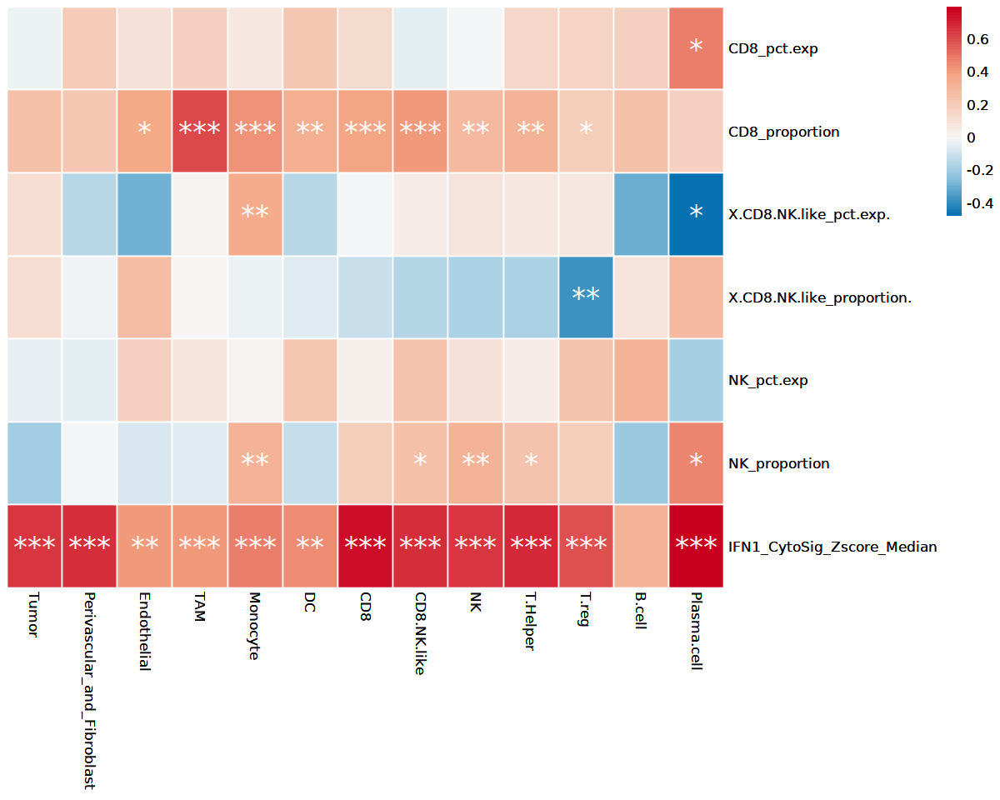

In [22]:
options(repr.plot.width=10, repr.plot.height=8)

test = t(beta_plot[,1:(ncol(beta_plot))])

paletteLength <- 100
myColor <- colorRampPalette(rev(brewer.pal(5, "RdBu")))(paletteLength)
# length(breaks) == length(paletteLength) + 1
# use floor and ceiling to deal with even/odd length pallettelengths
myBreaks <- c(seq(min(test), 0, length.out=ceiling(paletteLength/2) + 1), 
              seq(max(test)/paletteLength, max(test), length.out=floor(paletteLength/2)))

pheat_out = pheatmap(t(beta_plot[,1:(ncol(beta_plot))]),display_numbers = t(pval_plot_label[,1:(ncol(pval_plot_label))]), fontsize_number=20,number_color = "white", border_color = "white",cluster_rows = F,cluster_cols = F,color = myColor, breaks = myBreaks,legend_breaks = c(-1.2,-1,-0.8,-0.6,-0.4, -0.2,0,0.2,0.4,0.6,0.8))
pheat_out

In [24]:
save_pheatmap_pdf(pheat_out, filename = "../../Supp_Figures_Final/Figure_S3_S4/Figure_S3B_IFNG_Beta_Heatmap_WithIFN1.pdf", width =10, height = 8)


pdf 
  2

### Supp Figure 3C. Scatterplot showing correlation between CD8 proportion and IFNG response within TAM <a name="3">

In [25]:
plot_df_list_sub = plot_df_list[["TAM"]]
dim(plot_df_list_sub)

    lmres = lm(scale(IFNG_CytoSig_Zscore_Median) ~ scale(CD8_pct.exp) + scale(CD8_proportion) + scale(`CD8 NK-like_pct.exp`) + scale(`CD8 NK-like_proportion`) + scale(NK_pct.exp) + scale(NK_proportion) + scale(`T-Helper_pct.exp`) + scale(`T-Helper_proportion`) + scale(`T-reg_pct.exp`) + scale(`T-reg_proportion`) + scale(IFN1_CytoSig_Zscore_Median), data = plot_df_list_sub) 
summary(lmres)
vif(lmres)

[1] 41 74


Call:
lm(formula = scale(IFNG_CytoSig_Zscore_Median) ~ scale(CD8_pct.exp) + 
    scale(CD8_proportion) + scale(`CD8 NK-like_pct.exp`) + scale(`CD8 NK-like_proportion`) + 
    scale(NK_pct.exp) + scale(NK_proportion) + scale(`T-Helper_pct.exp`) + 
    scale(`T-Helper_proportion`) + scale(`T-reg_pct.exp`) + scale(`T-reg_proportion`) + 
    scale(IFN1_CytoSig_Zscore_Median), data = plot_df_list_sub)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.8286 -0.2513  0.0029  0.2280  0.6530 

Coefficients:
                                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)                        0.001947   0.060293   0.032   0.9745    
scale(CD8_pct.exp)                 0.109116   0.118477   0.921   0.3649    
scale(CD8_proportion)              0.523528   0.071498   7.322 5.67e-08 ***
scale(`CD8 NK-like_pct.exp`)      -0.016372   0.104318  -0.157   0.8764    
scale(`CD8 NK-like_proportion`)   -0.085470   0.088810  -0.962   0.3441    
scale(NK_pct.exp)                 

scale(CD8_pct.exp)             scale(CD8_proportion) 
                         3.316872                          1.423531 
     scale(`CD8 NK-like_pct.exp`)   scale(`CD8 NK-like_proportion`) 
                         3.012753                          2.183564 
                scale(NK_pct.exp)              scale(NK_proportion) 
                         3.422530                          2.516177 
        scale(`T-Helper_pct.exp`)      scale(`T-Helper_proportion`) 
                         3.849651                          1.166081 
           scale(`T-reg_pct.exp`)         scale(`T-reg_proportion`) 
                         3.006219                          1.333833 
scale(IFN1_CytoSig_Zscore_Median) 
                         1.505084

`geom_smooth()` using formula 'y ~ x'

Warning message:
"ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


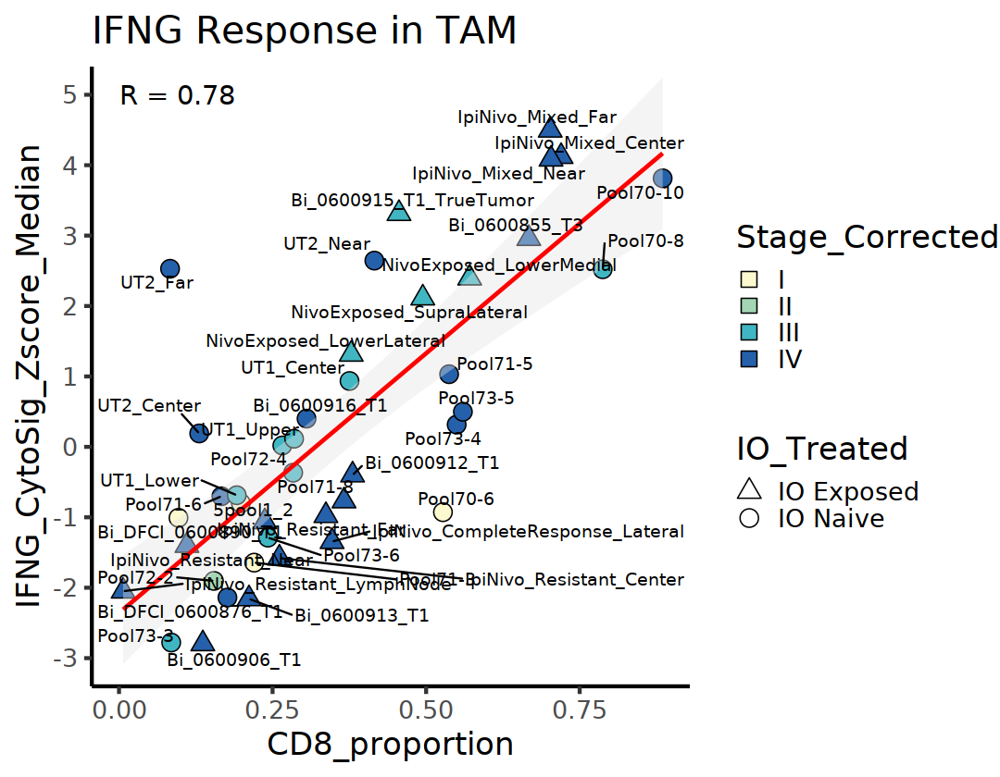

In [26]:
options(repr.plot.width=9, repr.plot.height=7)
ggplot(plot_df_list_sub, aes(x=`CD8_proportion`, y=IFNG_CytoSig_Zscore_Median, label = Sample)) + 
  geom_point(size = 5, aes(fill = Stage_Corrected, shape = IO_Treated))+
 theme_classic(base_size = 20) +
scale_shape_manual(values = c(24,21)) +
scale_fill_manual(values = c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA")) +
  geom_smooth(method=lm,se = T, color = "red",fill = "grey90") + coord_cartesian(ylim = c(-3, 5))  +
scale_y_continuous(breaks=seq(-3,5,by = 1)) +
stat_cor(method = "pearson", aes(label = ..r.label..),label.x = 0, label.y =5,size = 6) + labs(title="IFNG Response in TAM") +
 guides(fill=guide_legend(override.aes=list(shape=22))) + geom_text_repel()

`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



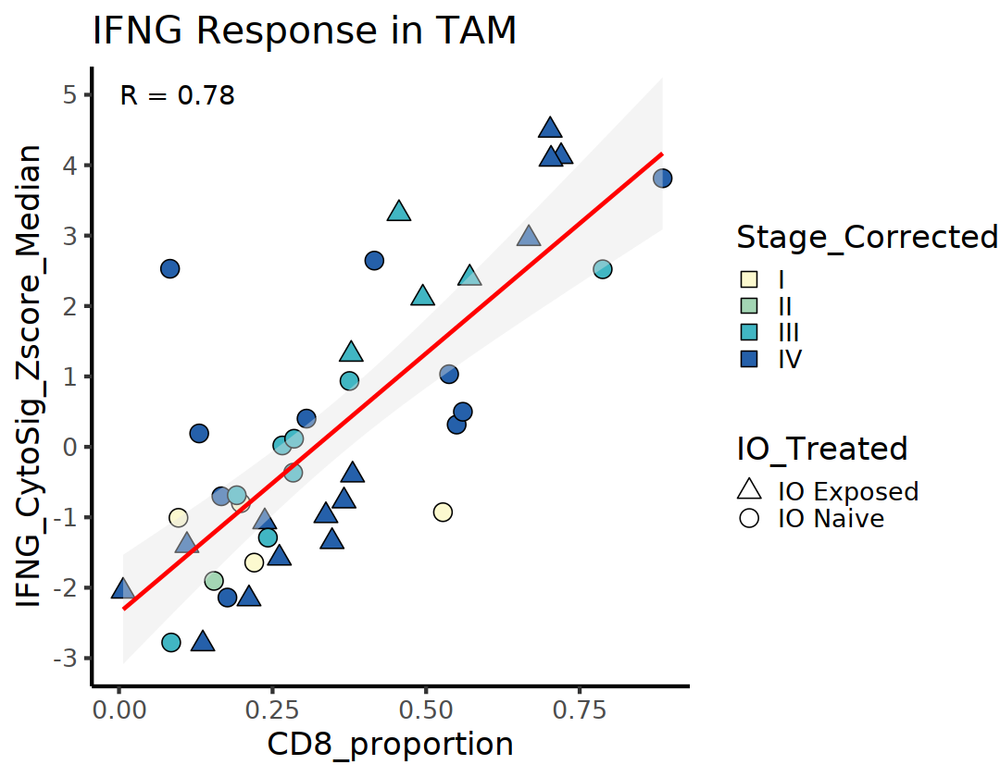

In [27]:
options(repr.plot.width=9, repr.plot.height=7)
ggplot(plot_df_list_sub, aes(x=`CD8_proportion`, y=IFNG_CytoSig_Zscore_Median, label = Sample)) + 
  geom_point(size = 5, aes(fill = Stage_Corrected, shape = IO_Treated))+
 theme_classic(base_size = 20) +
scale_shape_manual(values = c(24,21)) +
scale_fill_manual(values = c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA")) +
  geom_smooth(method=lm,se = T, color = "red",fill = "grey90") + coord_cartesian(ylim = c(-3, 5))  +
scale_y_continuous(breaks=seq(-3,5,by = 1)) +
stat_cor(method = "pearson", aes(label = ..r.label..),label.x = 0, label.y =5,size = 6) + labs(title="IFNG Response in TAM") +
 guides(fill=guide_legend(override.aes=list(shape=22))) 

ggsave("../../Supp_Figures_Final/Figure_S3_S4/Figure_S3C_TAM_IFNG_vs_CD8_Scatter.pdf",width = 9,height = 7)

### Supp Figure 3D. Heatmap summarizing sample-level linear models within each cell type predicting IFN1 CytoSig Score from broad cell type proportions and IFNG CytoSig Score <a name="4"></a>

### Dotplot of IFNAR1, IFNAR2, and IFI6 expression for annotation of heatmap

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



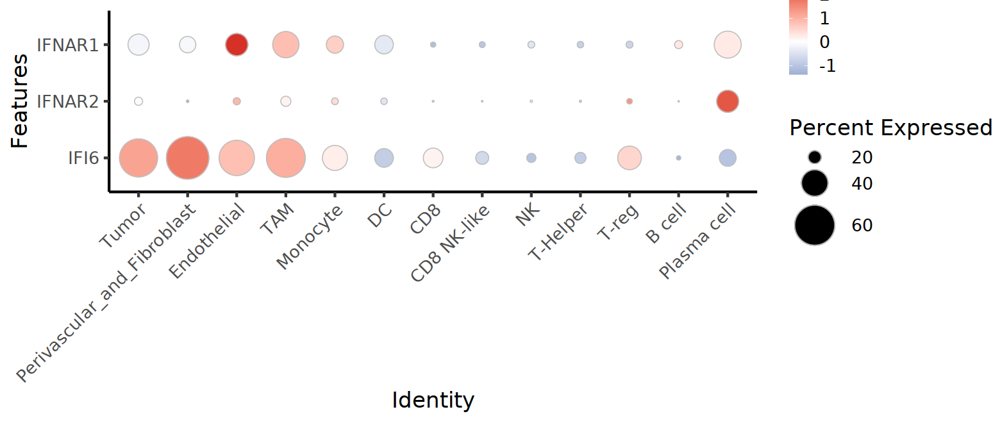

In [28]:
options(repr.plot.width=13, repr.plot.height=5.5)

DotPlot(seur_full, features = rev(c("IFNAR1","IFNAR2","IFI6")),group.by = "BBK_Broad_Celltype_DE",assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) + coord_flip()

ggsave("../../Supp_Figures_Final/Figure_S3_S4/Figure_S3D_IFNAR_Dotplot_Annotation.pdf", width = 13, height = 5.5)

In [29]:
celltypes = names(plot_df_list)
celltypes

lm_list = list()

for (i in 1:length(celltypes)) {
    
    plot_df_list_sub = plot_df_list[[i]]
 #   plot_df_list_sub = subset(plot_df_list_sub, !(Patient == "UT2"))    
    lmres = lm(scale(IFN1_CytoSig_Zscore_Median) ~ scale(TAM_proportion) + scale(Monocyte_proportion) + scale(DC_proportion) + scale(Tumor_proportion) + scale(Endothelial_proportion) + scale(Perivascular_and_Fibroblast_proportion) + scale(IFNG_CytoSig_Zscore_Median), data = plot_df_list_sub) 
    lmres_df = data.frame(summary(lmres)$coefficients, check.names = F,check.rows = F)
    lmres_df$variable = row.names(lmres_df)
    
    vif_lmres = data.frame(vif(lmres),check.names = F, check.rows = F)
    vif_lmres$variable = row.names(vif_lmres)
    
    lmres_df_final = left_join(lmres_df, vif_lmres, by = "variable")
    row.names(lmres_df_final) = row.names(lmres_df)
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable, "\\(", "")
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable_name, "\\)", "")
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable_name, "scale", "")
    row.names(lmres_df_final) = lmres_df_final$variable_name
    lm_list[[i]] = lmres_df_final
}

names(lm_list) = celltypes
str(lm_list)

[1] "Tumor"                       "Perivascular_and_Fibroblast"
 [3] "Endothelial"                 "TAM"                        
 [5] "Monocyte"                    "DC"                         
 [7] "CD8"                         "CD8 NK-like"                
 [9] "NK"                          "T-Helper"                   
[11] "T-reg"                       "B cell"                     
[13] "Plasma cell"

List of 13
 $ Tumor                      :'data.frame':	8 obs. of  7 variables:
  ..$ Estimate     : num [1:8] 0.53047 -0.00748 0.54256 -0.67129 0.51054 ...
  ..$ Std. Error   : num [1:8] 0.234 0.245 0.244 0.285 0.26 ...
  ..$ t value      : num [1:8] 2.2688 -0.0305 2.2248 -2.3557 1.9635 ...
  ..$ Pr(>|t|)     : num [1:8] 0.0425 0.9761 0.046 0.0363 0.0732 ...
  ..$ variable     : chr [1:8] "(Intercept)" "scale(TAM_proportion)" "scale(Monocyte_proportion)" "scale(DC_proportion)" ...
  ..$ vif(lmres)   : num [1:8] NA 3.11 1.28 3.32 1.41 ...
  ..$ variable_name: chr [1:8] "Intercept" "TAM_proportion" "Monocyte_proportion" "DC_proportion" ...
 $ Perivascular_and_Fibroblast:'data.frame':	8 obs. of  7 variables:
  ..$ Estimate     : num [1:8] 0.128 0.193 0.163 -0.416 0.433 ...
  ..$ Std. Error   : num [1:8] 0.132 0.189 0.174 0.242 0.185 ...
  ..$ t value      : num [1:8] 0.973 1.023 0.935 -1.717 2.342 ...
  ..$ Pr(>|t|)     : num [1:8] 0.3498 0.3267 0.368 0.1116 0.0373 ...
  ..$ variable    

In [30]:
lm_list[["Tumor"]]

,Estimate,Std. Error,t value,Pr(>|t|),variable,vif(lmres),variable_name
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<chr>
Intercept,0.530471293,0.2338124,2.26879030,0.04253079,(Intercept),NA,Intercept
TAM_proportion,-0.007477845,0.2449394,-0.03052937,0.97614676,scale(TAM_proportion),3.113135,TAM_proportion
Monocyte_proportion,0.542561521,0.2438728,2.22477226,0.04604171,scale(Monocyte_proportion),1.277618,Monocyte_proportion
DC_proportion,-0.671289219,0.2849638,-2.35570013,0.03633428,scale(DC_proportion),3.323589,DC_proportion
Tumor_proportion,0.510541187,0.2600158,1.96350041,0.07318390,scale(Tumor_proportion),1.414752,Tumor_proportion
Endothelial_proportion,-0.207511377,0.2652153,-0.78242613,0.44912891,scale(Endothelial_proportion),3.428818,Endothelial_proportion
Perivascular_and_Fibroblast_proportion,0.532776707,0.3696320,1.44137046,0.17506304,scale(Perivascular_and_Fibroblast_proportion),3.443637,Perivascular_and_Fibroblast_proportion
IFNG_CytoSig_Zscore_Median,0.500073960,0.1888343,2.64821573,0.02124895,scale(IFNG_CytoSig_Zscore_Median),1.392964,IFNG_CytoSig_Zscore_Median


In [31]:
beta_list = list()

for (i in 1:length(names(lm_list))){
    
    lm_list_sub = lm_list[[i]]
    lm_list_sub = lm_list_sub[2:(nrow(lm_list_sub)),]
    beta = lm_list_sub$Estimate
    names(beta) = lm_list_sub$variable_name
    
    beta_list[[i]] = beta
}

names(beta_list) = names(lm_list)
beta_list_df = data.frame(t(as.data.frame(beta_list)))
beta_list_df

pval_list = list()

for (i in 1:length(names(lm_list))){
    
    lm_list_sub = lm_list[[i]]
    lm_list_sub = lm_list_sub[2:(nrow(lm_list_sub)),]
    pval = lm_list_sub$`Pr(>|t|)`
    names(pval) = lm_list_sub$variable_name
    
    pval_list[[i]] = pval
}

names(pval_list) = names(lm_list)
pval_list_df = data.frame(t(as.data.frame(pval_list)))
pval_list_df

,TAM_proportion,Monocyte_proportion,DC_proportion,Tumor_proportion,Endothelial_proportion,Perivascular_and_Fibroblast_proportion,IFNG_CytoSig_Zscore_Median
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tumor,-0.007477845,0.54256152,-0.67128922,0.5105412,-0.207511377,0.53277671,0.5000740
Perivascular_and_Fibroblast,0.192878236,0.16281889,-0.41594243,0.4330901,0.063524085,-0.17903186,0.8081837
Endothelial,0.096156152,0.05112943,-0.10689619,-0.3042378,-0.224480051,0.30538929,0.2886328
TAM,0.224669380,0.58077154,-0.45902902,0.7365209,-0.195044091,0.31119746,0.6935687
Monocyte,0.255150232,0.49702952,-0.45363023,0.8578694,-0.090962719,0.20382429,0.6634801
DC,0.091342721,0.33031149,-0.04384832,0.7836472,0.045708405,-0.11464648,0.7985585
CD8,0.089208355,0.48266068,-0.26455369,0.7793815,-0.090126688,0.18220637,0.8754418
CD8.NK.like,0.095342539,0.24228460,-0.01112831,0.7392026,0.173840203,-0.09267018,0.9247734
NK,-0.300016393,0.39597617,0.13049469,0.4246190,-0.030645239,-0.07332890,0.7834466


,TAM_proportion,Monocyte_proportion,DC_proportion,Tumor_proportion,Endothelial_proportion,Perivascular_and_Fibroblast_proportion,IFNG_CytoSig_Zscore_Median
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tumor,0.97614676,0.04604171,0.036334277,0.073183904,0.44912891,0.17506304,2.124895e-02
Perivascular_and_Fibroblast,0.32671103,0.36797999,0.111570380,0.037270744,0.76005438,0.50258061,8.188677e-05
Endothelial,0.41778410,0.75067951,0.466055588,0.005787649,0.08577463,0.09912028,6.299220e-03
TAM,0.27593535,0.02690136,0.152304840,0.006201102,0.40576419,0.34121314,1.198112e-03
Monocyte,0.17311398,0.08813438,0.086317368,0.001933859,0.66782314,0.46850396,3.070152e-03
DC,0.67094477,0.20958897,0.900127160,0.009479542,0.86197637,0.69306387,8.906456e-03
CD8,0.60907006,0.07774282,0.315661029,0.001672393,0.64497207,0.49589848,1.259351e-04
CD8.NK.like,0.62984136,0.41552864,0.965109598,0.002234923,0.43542635,0.74677615,9.713416e-05
NK,0.06911901,0.18199028,0.577861822,0.021923053,0.85891017,0.75338175,1.363068e-03


In [32]:
beta_plot = beta_list_df[,1:ncol(beta_list_df)]
pval_plot = pval_list_df[,1:ncol(pval_list_df)]

In [33]:
min(beta_plot)
max(beta_plot)

[1] -0.7304162

[1] 0.949857

In [34]:
makeStars <- function(x){
  stars <- c("***", "**", "*", "")
  vec <- c(0, 0.001, 0.01, 0.05, 1)
  i <- findInterval(x, vec)
  stars[i]
}

pval_plot_label = apply(pval_plot,2, makeStars)
row.names(pval_plot_label) = row.names(pval_plot)
pval_plot_label

,TAM_proportion,Monocyte_proportion,DC_proportion,Tumor_proportion,Endothelial_proportion,Perivascular_and_Fibroblast_proportion,IFNG_CytoSig_Zscore_Median
Tumor,,*,*,,,,*
Perivascular_and_Fibroblast,,,,*,,,***
Endothelial,,,,**,,,**
TAM,,*,,**,,,**
Monocyte,,,,**,,,**
DC,,,,**,,,**
CD8,,,,**,,,***
CD8.NK.like,,,,**,,,***
NK,,,,*,,,**
T.Helper,,,,,,,***


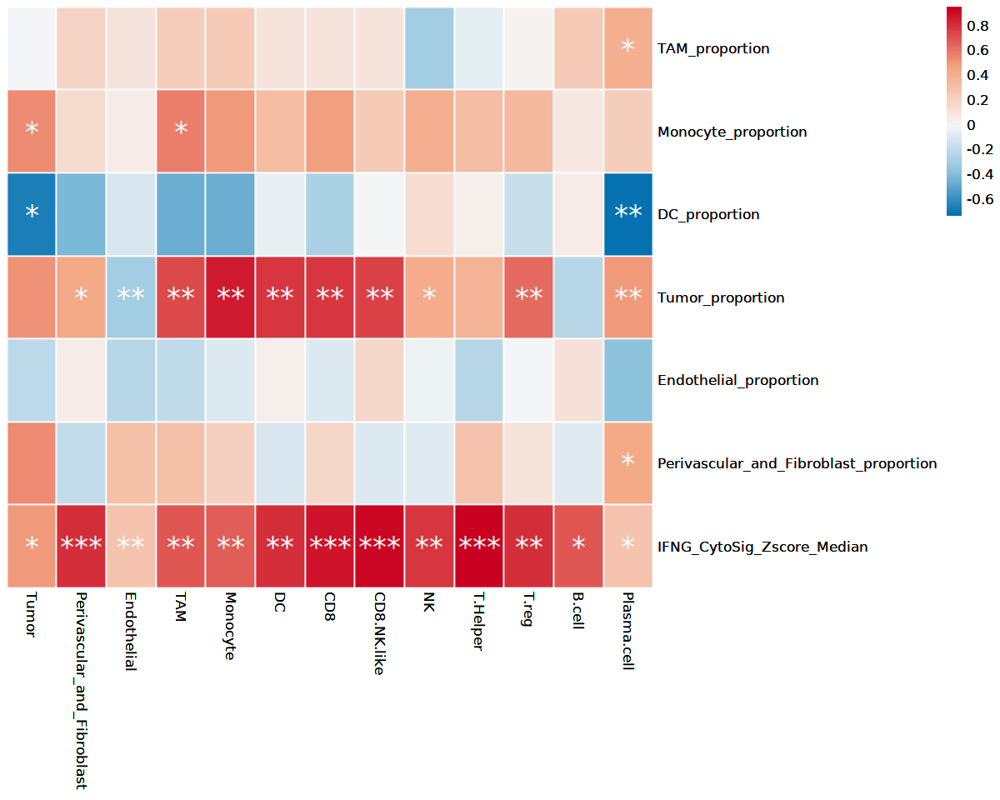

In [35]:
options(repr.plot.width=10, repr.plot.height=8)

test = t(beta_plot[,1:(ncol(beta_plot))])

paletteLength <- 100
myColor <- colorRampPalette(rev(brewer.pal(5, "RdBu")))(paletteLength)
# length(breaks) == length(paletteLength) + 1
# use floor and ceiling to deal with even/odd length pallettelengths
myBreaks <- c(seq(min(test), 0, length.out=ceiling(paletteLength/2) + 1), 
              seq(max(test)/paletteLength, max(test), length.out=floor(paletteLength/2)))

pheat_out = pheatmap(t(beta_plot[,1:(ncol(beta_plot))]),display_numbers = t(pval_plot_label[,1:(ncol(pval_plot_label))]), fontsize_number=20,number_color = "white", border_color = "white",cluster_rows = F,cluster_cols = F,color = myColor, breaks = myBreaks,legend_breaks = c(-1.2,-1,-0.8,-0.6,-0.4, -0.2,0,0.2,0.4,0.6,0.8))
pheat_out

In [36]:
save_pheatmap_pdf(pheat_out, filename = "../../Supp_Figures_Final/Figure_S3_S4/Figure_S4D_IFN1_Beta_Heatmap_WithIFN1_WithUT2.pdf", width =10, height = 8)


pdf 
  2

### Tumor cell proportion appears to predict IFN1 response in other cell types

### Supp Figure 3E. Scatterplot showing correlation between Tumor proportion and IFN1 response within Monocytes <a name="5"></a>

In [37]:
plot_df_list_sub = plot_df_list[["Monocyte"]]

    lmres = lm(scale(IFN1_CytoSig_Zscore_Median) ~ scale(TAM_proportion) + scale(Monocyte_proportion) + scale(DC_proportion) + scale(Tumor_proportion) + scale(Endothelial_proportion) + scale(Perivascular_and_Fibroblast_proportion) + scale(IFNG_CytoSig_Zscore_Median), data = plot_df_list_sub)
summary(lmres)
vif(lmres)


Call:
lm(formula = scale(IFN1_CytoSig_Zscore_Median) ~ scale(TAM_proportion) + 
    scale(Monocyte_proportion) + scale(DC_proportion) + scale(Tumor_proportion) + 
    scale(Endothelial_proportion) + scale(Perivascular_and_Fibroblast_proportion) + 
    scale(IFNG_CytoSig_Zscore_Median), data = plot_df_list_sub)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.81684 -0.24148  0.05777  0.33541  0.72424 

Coefficients:
                                              Estimate Std. Error t value
(Intercept)                                    0.38604    0.17813   2.167
scale(TAM_proportion)                          0.25515    0.17615   1.448
scale(Monocyte_proportion)                     0.49703    0.26777   1.856
scale(DC_proportion)                          -0.45363    0.24280  -1.868
scale(Tumor_proportion)                        0.85787    0.21728   3.948
scale(Endothelial_proportion)                 -0.09096    0.20678  -0.440
scale(Perivascular_and_Fibroblast_proportion)  0.2

scale(TAM_proportion) 
                                     3.045736 
                   scale(Monocyte_proportion) 
                                     1.481234 
                         scale(DC_proportion) 
                                     3.517684 
                      scale(Tumor_proportion) 
                                     1.654131 
                scale(Endothelial_proportion) 
                                     3.766863 
scale(Perivascular_and_Fibroblast_proportion) 
                                     3.493882 
            scale(IFNG_CytoSig_Zscore_Median) 
                                     1.909981

In [38]:
plot_df_list_sub

BBK_Broad_Celltype_DE,Sample,Patient,Biopsy,Stage_Corrected,IO_Treated,IO,IFNG_CytoSig_Zscore_Median,IFN1_CytoSig_Zscore_Median,Tumor_avg.exp,...,B cell_avg.exp,B cell_pct.exp,B cell_proportion,B cell_coi,B cell_totalcells,Perivascular_and_Fibroblast_avg.exp,Perivascular_and_Fibroblast_pct.exp,Perivascular_and_Fibroblast_proportion,Perivascular_and_Fibroblast_coi,Perivascular_and_Fibroblast_totalcells
<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<int>
Monocyte,5pool1_2,S1,Kidney,I,IO Naive,No,1.24637157,0.89186655,0.0185178327,...,0.01853980,0.3355705,0.0248188557,298,12007,NA,NA,NA,NA,NA
Monocyte,Bi_0600855_T3,P55,Abdomen,IV,IO Exposed,PR,1.12350312,1.06277361,0.0029742059,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Monocyte,Bi_0600906_T1,P906,Lymph_node,IV,IO Exposed,PD,-2.32450422,-2.02453772,0.0000000000,...,0.00000000,0.0000000,0.0149532710,24,1605,0.000000000,0.000000,0.0161993769,26,1605
Monocyte,Bi_0600912_T1,P912,Lymph_node,IV,IO Exposed,NE,-1.75345204,-2.12093811,NA,...,0.00000000,0.0000000,0.2394366197,51,213,0.000000000,0.000000,0.0046948357,1,213
Monocyte,Bi_0600913_T1,P913,Lung,IV,IO Exposed,SD,-2.13138333,-1.77634405,0.0000000000,...,0.02211994,0.2680965,0.2740631888,746,2722,0.000000000,0.000000,0.0143277002,39,2722
Monocyte,Bi_0600915_T1_TrueTumor,P915,Kidney,III,IO Exposed,PR,1.39942886,-0.01113316,0.0060918699,...,0.00000000,0.0000000,0.0080335313,46,5726,0.000000000,0.000000,0.0006985679,4,5726
Monocyte,Bi_0600916_T1,P916,Lymph_node,IV,IO Naive,No,1.07554368,-1.14376114,0.0000000000,...,0.00000000,0.0000000,0.1548672566,35,226,NA,NA,NA,NA,NA
Monocyte,Bi_DFCI_0600876_T1,P76,Kidney,IV,IO Naive,No,-0.78336550,-0.45889615,0.0000000000,...,0.00000000,0.0000000,0.0040315513,23,5705,NA,NA,NA,NA,NA
Monocyte,Bi_DFCI_0600890_T1,P90,Kidney,I,IO Naive,No,-0.30230890,1.34991644,0.0000000000,...,0.00000000,0.0000000,0.0145623548,94,6455,NA,NA,NA,NA,NA


`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9 rows containing non-finite values (stat_smooth)."
Warning message:
"Removed 9 rows containing non-finite values (stat_cor)."
Warning message:
"Removed 9 rows containing missing values (geom_point)."
Warning message:
"Removed 9 rows containing missing values (geom_text_repel)."
Warning message:
"ggrepel: 10 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


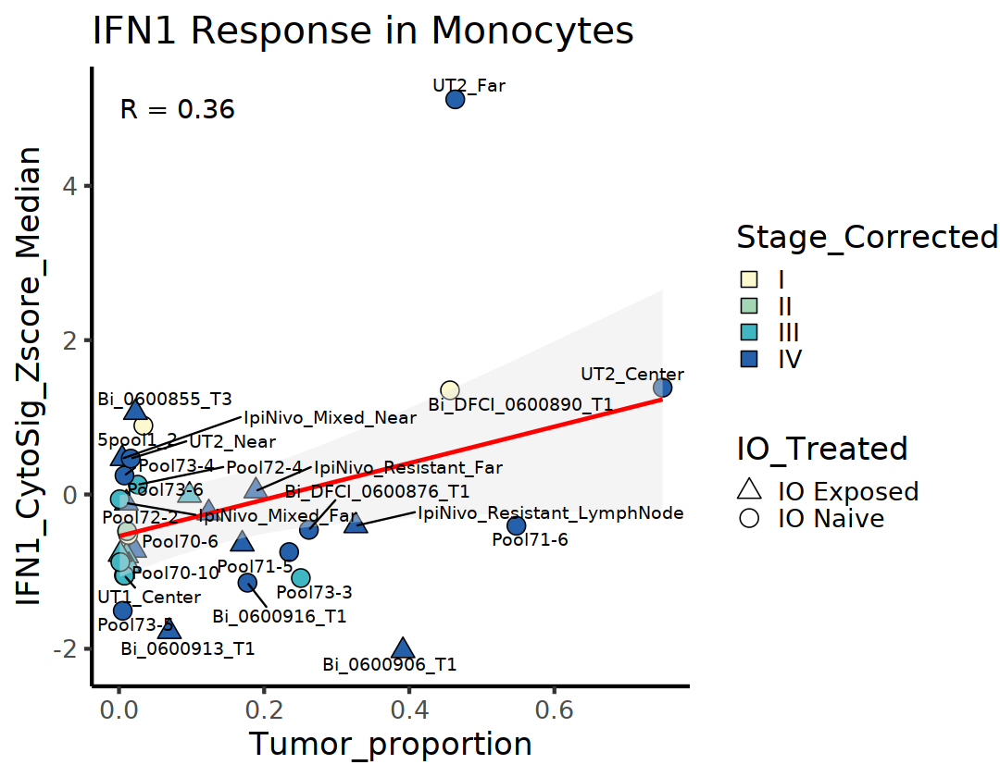

In [39]:
options(repr.plot.width=9, repr.plot.height=7)
ggplot(plot_df_list_sub, aes(x=Tumor_proportion, y=IFN1_CytoSig_Zscore_Median, label = Sample)) + 
  geom_point(size = 5, aes(fill = Stage_Corrected, shape = IO_Treated))+
 theme_classic(base_size = 20) +
scale_shape_manual(values = c(24,21)) +
scale_fill_manual(values = c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA")) +
  geom_smooth(method=lm,se = T, color = "red",fill = "grey90") + 
#coord_cartesian(ylim = c(-3, 5))  +
#scale_y_continuous(breaks=seq(-3,5,by = 1)) +
stat_cor(method = "pearson", aes(label = ..r.label..),label.x = 0, label.y =5,size = 6) + labs(title="IFN1 Response in Monocytes") +
 guides(fill=guide_legend(override.aes=list(shape=22))) + geom_text_repel()

`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9 rows containing non-finite values (stat_smooth)."
Warning message:
"Removed 9 rows containing non-finite values (stat_cor)."
Warning message:
"Removed 9 rows containing missing values (geom_point)."
`geom_smooth()` using formula 'y ~ x'

Warning message:
"Removed 9 rows containing non-finite values (stat_smooth)."
Warning message:
"Removed 9 rows containing non-finite values (stat_cor)."
Warning message:
"Removed 9 rows containing missing values (geom_point)."


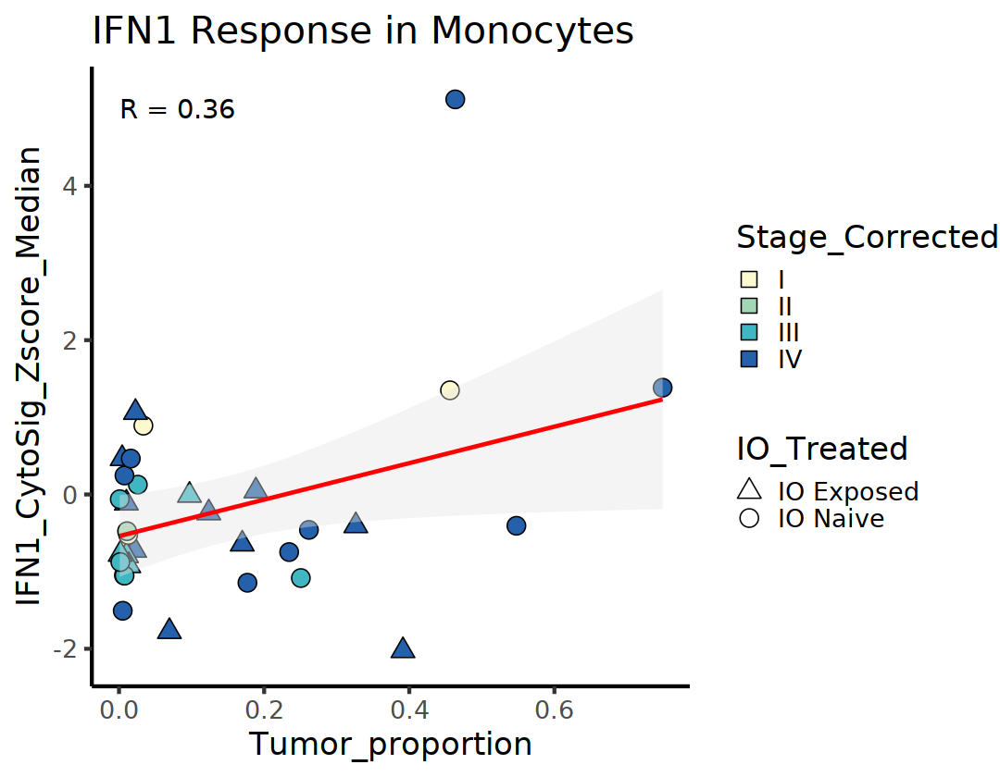

In [50]:
options(repr.plot.width=9, repr.plot.height=7)
ggplot(plot_df_list_sub, aes(x=Tumor_proportion, y=IFN1_CytoSig_Zscore_Median, label = Sample)) + 
  geom_point(size = 5, aes(fill = Stage_Corrected, shape = IO_Treated))+
 theme_classic(base_size = 20) +
scale_shape_manual(values = c(24,21)) +
scale_fill_manual(values = c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA")) +
  geom_smooth(method=lm,se = T, color = "red",fill = "grey90") + 
#coord_cartesian(ylim = c(-3, 5))  +
#scale_y_continuous(breaks=seq(-3,5,by = 1)) +
stat_cor(method = "pearson", aes(label = ..r.label..),label.x = 0, label.y =5,size = 6) + labs(title="IFN1 Response in Monocytes") +
 guides(fill=guide_legend(override.aes=list(shape=22))) 

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS3E_Monocyte_IFN1_vs_Tumor_Scatter.pdf",width = 9,height = 7)

### Result may be driven by UT2, an outlier patient with high IFN1 response. Now we repeat the analysis excluding UT2 samples

### Supp Figure 3F. Heatmap summarizing sample-level linear models within each cell type predicting IFN1 CytoSig Score from broad cell type proportions and IFNG CytoSig Score, excluding patient UT2 <a name="6"></a>

In [51]:
celltypes = names(plot_df_list)
celltypes

lm_list = list()

for (i in 1:length(celltypes)) {
    
    plot_df_list_sub = plot_df_list[[i]]
    plot_df_list_sub = subset(plot_df_list_sub, !(Patient == "UT2"))    
    lmres = lm(scale(IFN1_CytoSig_Zscore_Median) ~ scale(TAM_proportion) + scale(Monocyte_proportion) + scale(DC_proportion) + scale(Tumor_proportion) + scale(Endothelial_proportion) + scale(Perivascular_and_Fibroblast_proportion) + scale(IFNG_CytoSig_Zscore_Median), data = plot_df_list_sub) 
    lmres_df = data.frame(summary(lmres)$coefficients, check.names = F,check.rows = F)
    lmres_df$variable = row.names(lmres_df)
    
    vif_lmres = data.frame(vif(lmres),check.names = F, check.rows = F)
    vif_lmres$variable = row.names(vif_lmres)
    
    lmres_df_final = left_join(lmres_df, vif_lmres, by = "variable")
    row.names(lmres_df_final) = row.names(lmres_df)
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable, "\\(", "")
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable_name, "\\)", "")
    lmres_df_final$variable_name = str_replace_all(lmres_df_final$variable_name, "scale", "")
    row.names(lmres_df_final) = lmres_df_final$variable_name
    lm_list[[i]] = lmres_df_final
}

names(lm_list) = celltypes
str(lm_list)

[1] "Tumor"                       "Perivascular_and_Fibroblast"
 [3] "Endothelial"                 "TAM"                        
 [5] "Monocyte"                    "DC"                         
 [7] "CD8"                         "CD8 NK-like"                
 [9] "NK"                          "T-Helper"                   
[11] "T-reg"                       "B cell"                     
[13] "Plasma cell"

List of 13
 $ Tumor                      :'data.frame':	8 obs. of  7 variables:
  ..$ Estimate     : num [1:8] 0.0236 -0.2265 -0.1691 -0.1646 -0.3108 ...
  ..$ Std. Error   : num [1:8] 0.22 0.216 0.295 0.296 0.262 ...
  ..$ t value      : num [1:8] 0.107 -1.05 -0.573 -0.555 -1.188 ...
  ..$ Pr(>|t|)     : num [1:8] 0.917 0.316 0.578 0.59 0.26 ...
  ..$ variable     : chr [1:8] "(Intercept)" "scale(TAM_proportion)" "scale(Monocyte_proportion)" "scale(DC_proportion)" ...
  ..$ vif(lmres)   : num [1:8] NA 3.23 2.09 4.8 1.97 ...
  ..$ variable_name: chr [1:8] "Intercept" "TAM_proportion" "Monocyte_proportion" "DC_proportion" ...
 $ Perivascular_and_Fibroblast:'data.frame':	8 obs. of  7 variables:
  ..$ Estimate     : num [1:8] -0.0204 0.1284 -0.2454 -0.0359 -0.0294 ...
  ..$ Std. Error   : num [1:8] 0.117 0.165 0.209 0.249 0.14 ...
  ..$ t value      : num [1:8] -0.175 0.779 -1.176 -0.144 -0.209 ...
  ..$ Pr(>|t|)     : num [1:8] 0.864 0.453 0.264 0.888 0.838 ...
  ..$ variable     : chr [

In [52]:
beta_list = list()

for (i in 1:length(names(lm_list))){
    
    lm_list_sub = lm_list[[i]]
    lm_list_sub = lm_list_sub[2:(nrow(lm_list_sub)),]
    beta = lm_list_sub$Estimate
    names(beta) = lm_list_sub$variable_name
    
    beta_list[[i]] = beta
}

names(beta_list) = names(lm_list)
beta_list_df = data.frame(t(as.data.frame(beta_list)))
beta_list_df

pval_list = list()

for (i in 1:length(names(lm_list))){
    
    lm_list_sub = lm_list[[i]]
    lm_list_sub = lm_list_sub[2:(nrow(lm_list_sub)),]
    pval = lm_list_sub$`Pr(>|t|)`
    names(pval) = lm_list_sub$variable_name
    
    pval_list[[i]] = pval
}

names(pval_list) = names(lm_list)
pval_list_df = data.frame(t(as.data.frame(pval_list)))
pval_list_df

,TAM_proportion,Monocyte_proportion,DC_proportion,Tumor_proportion,Endothelial_proportion,Perivascular_and_Fibroblast_proportion,IFNG_CytoSig_Zscore_Median
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tumor,-0.22648051,-0.16909985,-0.16457855,-0.310839061,-0.03032155,0.37532363,0.3683321
Perivascular_and_Fibroblast,0.12842352,-0.24535609,-0.03587189,-0.029379483,0.15719957,-0.24627653,0.8800433
Endothelial,0.09580144,0.04949616,-0.10578760,-0.262877599,-0.22899074,0.25189771,0.2867066
TAM,0.20245632,-0.23725477,-0.04926393,-0.196993463,-0.18312236,0.30123944,0.6200921
Monocyte,0.19839199,-0.18728552,0.02487373,-0.070432794,-0.09343421,0.08512079,0.4604659
DC,0.01372334,-0.47835098,0.35869052,-0.189270106,0.05492678,-0.12661124,0.4769557
CD8,-0.05832739,-0.23491271,0.12205926,0.190709539,-0.06008368,0.05612214,0.9314183
CD8.NK.like,-0.17002531,-0.43125507,0.60154683,-0.003529335,0.20226689,-0.32738804,0.7502851
NK,-0.37359549,0.24965009,0.30014038,0.056426938,-0.01167002,-0.12590024,0.6640399


,TAM_proportion,Monocyte_proportion,DC_proportion,Tumor_proportion,Endothelial_proportion,Perivascular_and_Fibroblast_proportion,IFNG_CytoSig_Zscore_Median
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tumor,0.316248567,0.57786241,0.58967456,0.26002696,0.90228360,0.18592862,5.833941e-02
Perivascular_and_Fibroblast,0.452526338,0.26425405,0.88824084,0.83799844,0.40227542,0.21674974,2.197063e-05
Endothelial,0.444219600,0.83675716,0.59440938,0.04129971,0.10632313,0.12398587,1.034309e-02
TAM,0.156206112,0.31915889,0.82827701,0.33813465,0.26465511,0.11721846,3.830256e-04
Monocyte,0.082598282,0.37305893,0.88452897,0.68842663,0.46292142,0.53969602,3.024720e-03
DC,0.923241351,0.07009136,0.16312219,0.41226069,0.75354363,0.52447044,2.946018e-02
CD8,0.747909184,0.50425107,0.67330209,0.43649346,0.76696430,0.80712498,2.996960e-04
CD8.NK.like,0.426168359,0.25105375,0.06681477,0.98876367,0.36778114,0.19616257,3.056677e-03
NK,0.037443857,0.45051651,0.26546186,0.79726256,0.94909102,0.54493150,1.593882e-02


In [53]:
beta_plot = beta_list_df[,1:ncol(beta_list_df)]
pval_plot = pval_list_df[,1:ncol(pval_list_df)]

In [54]:
makeStars <- function(x){
  stars <- c("***", "**", "*", "")
  vec <- c(0, 0.001, 0.01, 0.05, 1)
  i <- findInterval(x, vec)
  stars[i]
}

pval_plot_label = apply(pval_plot,2, makeStars)
row.names(pval_plot_label) = row.names(pval_plot)
pval_plot_label

,TAM_proportion,Monocyte_proportion,DC_proportion,Tumor_proportion,Endothelial_proportion,Perivascular_and_Fibroblast_proportion,IFNG_CytoSig_Zscore_Median
Tumor,,,,,,,
Perivascular_and_Fibroblast,,,,,,,***
Endothelial,,,,*,,,*
TAM,,,,,,,***
Monocyte,,,,,,,**
DC,,,,,,,*
CD8,,,,,,,***
CD8.NK.like,,,,,,,**
NK,*,,,,,,*
T.Helper,,,,,,,**


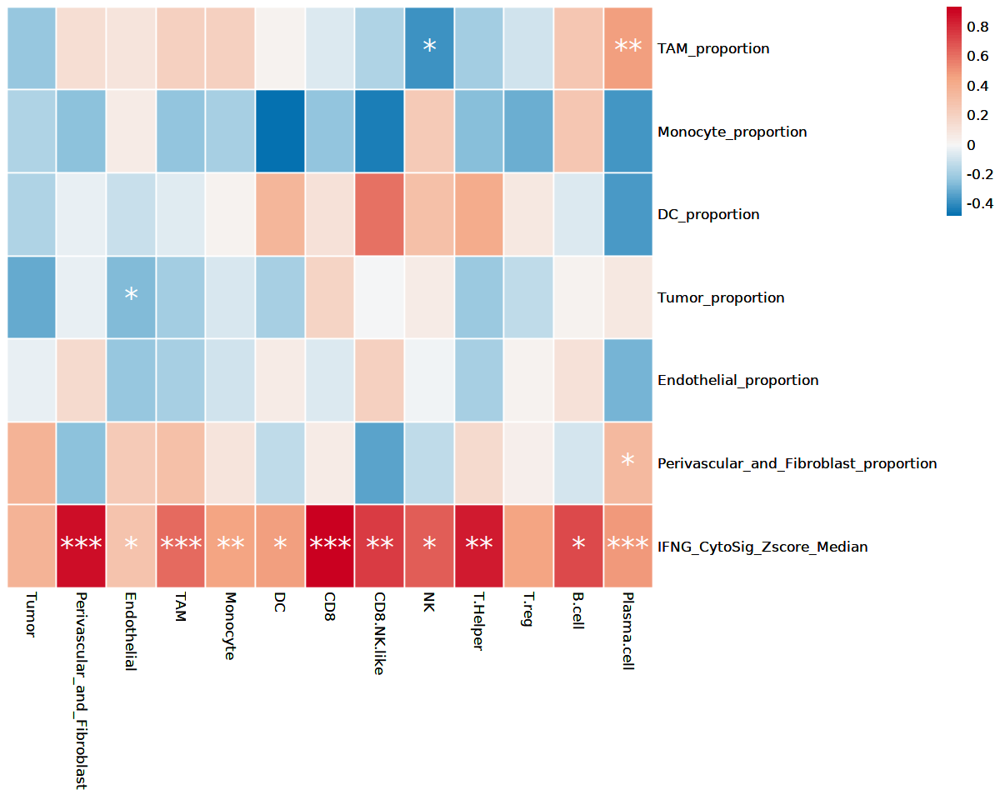

In [55]:
options(repr.plot.width=10, repr.plot.height=8)

test = t(beta_plot[,1:(ncol(beta_plot))])

paletteLength <- 100
myColor <- colorRampPalette(rev(brewer.pal(5, "RdBu")))(paletteLength)
# length(breaks) == length(paletteLength) + 1
# use floor and ceiling to deal with even/odd length pallettelengths
myBreaks <- c(seq(min(test), 0, length.out=ceiling(paletteLength/2) + 1), 
              seq(max(test)/paletteLength, max(test), length.out=floor(paletteLength/2)))

pheat_out = pheatmap(t(beta_plot[,1:(ncol(beta_plot))]),display_numbers = t(pval_plot_label[,1:(ncol(pval_plot_label))]), fontsize_number=20,number_color = "white", border_color = "white",cluster_rows = F,cluster_cols = F,color = myColor, breaks = myBreaks,legend_breaks = c(-1.2,-1,-0.8,-0.6,-0.4, -0.2,0,0.2,0.4,0.6,0.8))
pheat_out

In [56]:
save_pheatmap_pdf(pheat_out, filename = "../../Supp_Figures_Final/Figure_S3_S4/FigureS3F_IFN1_Beta_Heatmap_WithIFNG_UT2excluded.pdf", width =10, height = 8)


pdf 
  2

### Thus, no broad cell type proportions robustly predict IFN1 response

### Supp Figure 4A. UMAP of CD8 T cells and barplots showing proportion of each sample in each cluster <a name = "7"></a>

In [57]:
seur_cd8 = subset(seur_full, idents = c("CD8"))

seur_cd8 <- NormalizeData(seur_cd8)
seur_cd8 <- FindVariableFeatures(seur_cd8, selection.method = "vst")
seur_cd8 <- ScaleData(seur_cd8)
seur_cd8 <- RunPCA(seur_cd8, npcs = 30,verbose = T)

seur_cd8 <- RunHarmony(seur_cd8, group.by.vars = c("Cohort","SampleName"))
seur_cd8 <- RunUMAP(seur_cd8, reduction = "harmony", dims = 1:30)

Centering and scaling data matrix

PC_ 1 
Positive:  TXNIP, GZMM, IL7R, TSC22D3, CD69, JUNB, ZFP36, ANXA1, CD52, KLRB1 
	   IFITM1, ALOX5AP, RPL13A, ZFP36L2, HOPX, KLRD1, ZNF683, IFITM2, RPL13P12, RPS29 
	   RPL26, SLC2A3, FOS, DUSP1, RORA, IER2, TMIGD2, CAPG, ISG20, LINC00861 
Negative:  UBE2C, RRM2, MKI67, TYMS, TOP2A, STMN1, BIRC5, AURKB, KIFC1, ZWINT 
	   CDK1, CDCA3, CCNA2, ASF1B, ASPM, NUSAP1, CDCA8, GTSE1, CDCA5, CCNB2 
	   DLGAP5, HJURP, PKMYT1, TPX2, CENPF, SPC25, KIF15, KIF23, CENPW, CDC20 
PC_ 2 
Positive:  CD74, NKG7, TNFRSF9, HLA-DPA1, HLA-DRB1, HLA-DRA, VCAM1, HLA-DPB1, HLA-DRB5, LAG3 
	   HLA-DQA1, HLA-DMA, CD82, HLA-DQB1, PARK7, SYNGR2, MIR155HG, MAP1LC3A, ITM2A, PKM 
	   BHLHE40-AS1, PON2, UCP2, CXCL13, SEMA4A, SUB1, TTN, HLA-DQA2, PON3, HMOX1 
Negative:  IL7R, ANXA1, S100A10, GZMM, FOS, KLRB1, TSC22D3, KLF6, SLC2A3, CAPG 
	   CD69, RORA, ZNF683, CD52, ZFP36L2, TMEM123, GLUL, JUNB, FOSB, JUN 
	   TXNIP, ZFP36, IER2, MCUB, PTGER2, TMIGD2, GPR183, KLF2, TIMP1, C1orf162 


In [58]:
seur_cd8

An object of class Seurat 
39619 features across 88457 samples within 1 assay 
Active assay: RNA (39619 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [59]:
Idents(seur_cd8) = "BBK_Final_Celltype"

table(Idents(seur_cd8))


 CD8_Cycling_4  CD8_Cycling_2  CD8_Cycling_1       CD8_LAG3        CD8_RPS 
           129           2528           2700          22043          21269 
      CD8_IL7R   CD8_HSP_IFNG CD8_TNFRSF9_Hi     CD8_ISG_Hi    CD8_TRBV7-7 
         14492          12178           4995           2429           1934 
   CD8_TRBV5-6      CD8_KLRB1      CD8_FOXP3    CD8_TRBV3-1 
          1725           1103            589            343 

In [60]:
Idents(seur_cd8) = factor(Idents(seur_cd8), levels = c("CD8_RPS","CD8_IL7R","CD8_KLRB1","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_LAG3","CD8_TNFRSF9_Hi","CD8_FOXP3","CD8_TRBV7-7","CD8_TRBV5-6","CD8_TRBV3-1","CD8_Cycling_1","CD8_Cycling_2","CD8_Cycling_4"))

In [61]:
cd8_cols = colorRampPalette(brewer.pal(12, "Set3"))(14)
names(cd8_cols) = levels(Idents(seur_cd8))
cd8_cols

CD8_RPS       CD8_IL7R      CD8_KLRB1   CD8_HSP_IFNG     CD8_ISG_Hi 
     "#8DD3C7"      "#EDF8B6"      "#D2CFCE"      "#DE9AA2"      "#CB9297" 
      CD8_LAG3 CD8_TNFRSF9_Hi      CD8_FOXP3    CD8_TRBV7-7    CD8_TRBV5-6 
     "#9CB1B8"      "#F7B762"      "#B8DA68"      "#EBD0C8"      "#E6D4DD" 
   CD8_TRBV3-1  CD8_Cycling_1  CD8_Cycling_2  CD8_Cycling_4 
     "#CBAFCC"      "#C0A0BF"      "#D3EBB7"      "#FFED6F"

In [62]:
cd8_cols["CD8_HSP_IFNG"] = "#D3EBB7"
cd8_cols["CD8_Cycling_2"] = "#D2CFCE"

cd8_cols["CD8_TRBV5-6"] = "#FFED6F"
cd8_cols["CD8_Cycling_4"] = "#E6D4DD"

cd8_cols["CD8_IL7R"] = "#C0A0BF"
cd8_cols["CD8_Cycling_1"] = "#EDF8B6"

cd8_cols

CD8_RPS       CD8_IL7R      CD8_KLRB1   CD8_HSP_IFNG     CD8_ISG_Hi 
     "#8DD3C7"      "#C0A0BF"      "#D2CFCE"      "#D3EBB7"      "#CB9297" 
      CD8_LAG3 CD8_TNFRSF9_Hi      CD8_FOXP3    CD8_TRBV7-7    CD8_TRBV5-6 
     "#9CB1B8"      "#F7B762"      "#B8DA68"      "#EBD0C8"      "#FFED6F" 
   CD8_TRBV3-1  CD8_Cycling_1  CD8_Cycling_2  CD8_Cycling_4 
     "#CBAFCC"      "#EDF8B6"      "#D2CFCE"      "#E6D4DD"

In [ ]:
saveRDS(seur_cd8, file = "../../Data_Objects/Supp_seur_cd8.RDS")

In [66]:
seur_cd8 = readRDS("../../Data_Objects/Supp_seur_cd8.RDS")

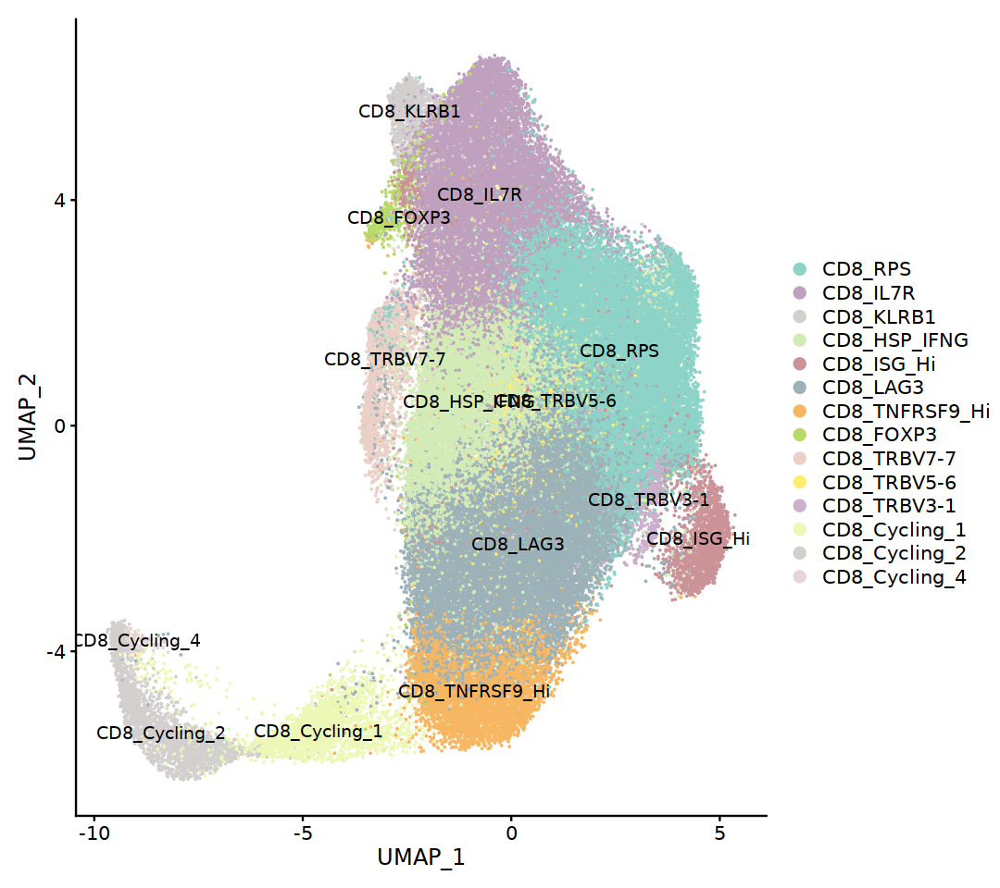

In [67]:
options(repr.plot.width=9, repr.plot.height=8)

DimPlot(seur_cd8, cols = cd8_cols[levels(Idents(seur_cd8))], label = T)

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4A_CD8_UMAP.pdf", width = 9, height = 8)

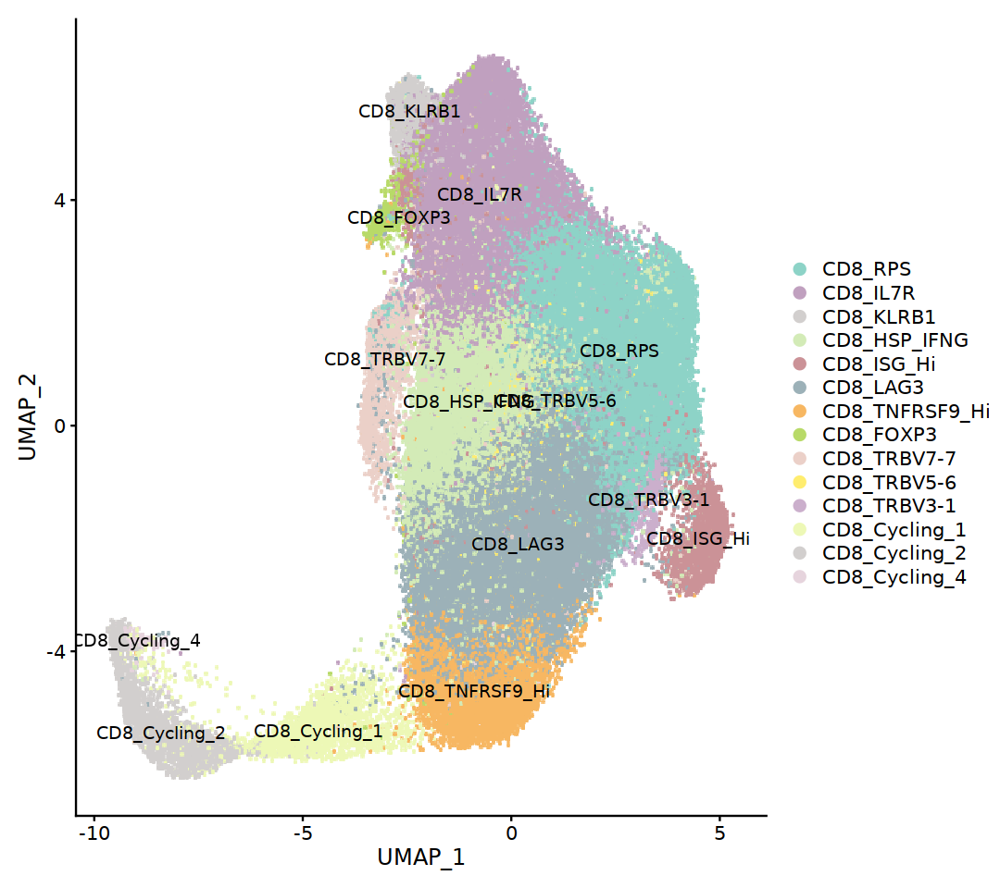

In [68]:
options(repr.plot.width=9, repr.plot.height=8)

DimPlot(seur_cd8, cols = cd8_cols[levels(Idents(seur_cd8))], label = T, raster = T)

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4A_CD8_UMAP_raster.pdf", width = 9, height = 8)

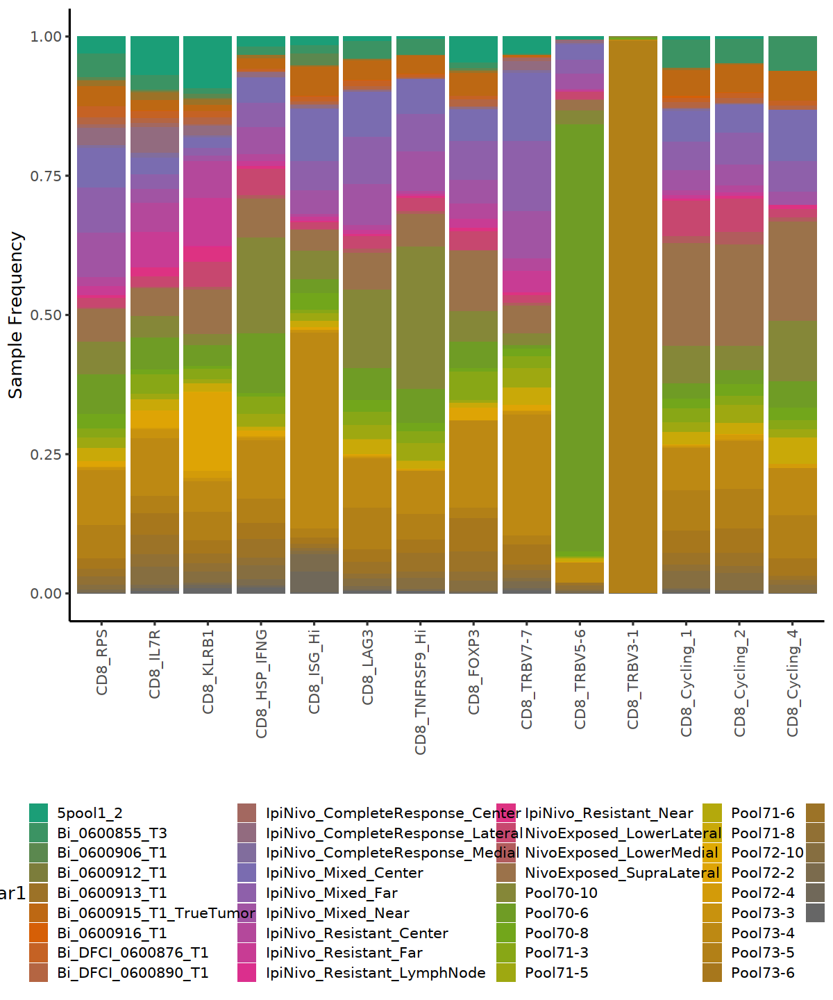

In [69]:
options(repr.plot.width=10, repr.plot.height=12)
props <- prop.table(table(seur_cd8$Sample,Idents(seur_cd8)), margin = 2)
props <- data.frame(props)
ggplot() + geom_bar(aes(y = Freq, x = Var2, fill = Var1), data = props, stat="identity") + 
theme_classic(base_size = 15) + scale_fill_manual(values = colorRampPalette(brewer.pal(8, "Dark2"))(42)) +
xlab(label = "") + ylab(label = "Sample Frequency") + theme(legend.position = "bottom") + theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4A_CD8_SampleProps_Barplot.pdf", width = 8, height = 12)

### Inspect some QC metrics

In [70]:
seur_cd8_meta_df = seur_cd8@meta.data
seur_cd8_meta_df$BBK_Final_Celltype = factor(seur_cd8_meta_df$BBK_Final_Celltype, levels = c("CD8_RPS","CD8_IL7R","CD8_KLRB1","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_LAG3","CD8_TNFRSF9_Hi","CD8_FOXP3","CD8_TRBV7-7","CD8_TRBV5-6","CD8_TRBV3-1","CD8_Cycling_1","CD8_Cycling_2","CD8_Cycling_4"))

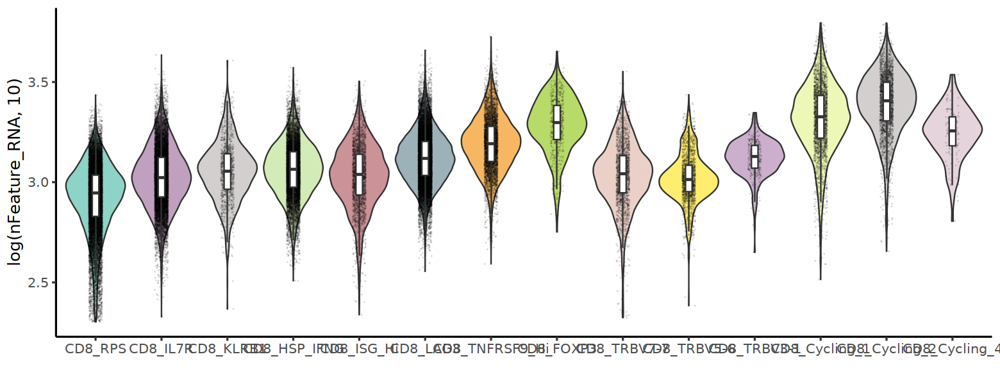

In [71]:
options(repr.plot.width=13, repr.plot.height=5)

nfeat = ggplot(seur_cd8_meta_df, aes(x=BBK_Final_Celltype, y=log(nFeature_RNA,10), fill = BBK_Final_Celltype)) + 
  geom_violin(scale = "width") + geom_jitter_rast(color = "black",alpha = 0.1,width = 0.1,size = 0.01) + 
geom_boxplot(width = 0.1,fill = "white",outlier.shape = NA) + theme_classic(base_size = 15) + 
scale_fill_manual(values = cd8_cols[levels(seur_cd8_meta_df$BBK_Final_Celltype)]) + theme(legend.position = "none") + xlab(label = "")
nfeat

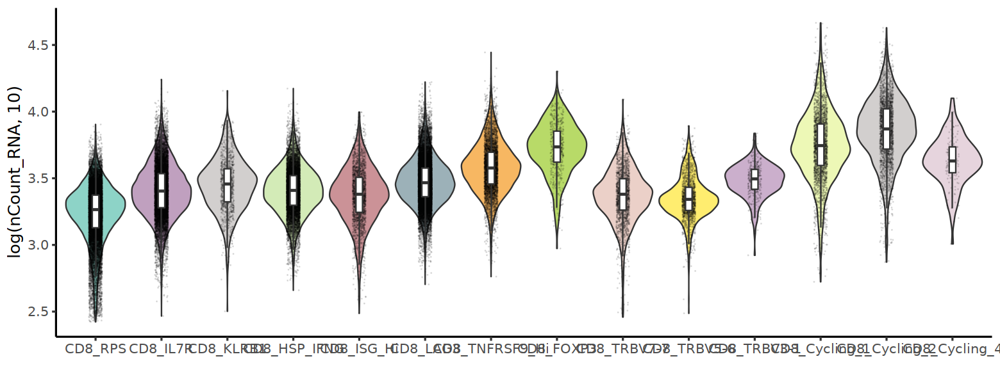

In [72]:
options(repr.plot.width=13, repr.plot.height=5)

ncount = ggplot(seur_cd8_meta_df, aes(x=BBK_Final_Celltype, y=log(nCount_RNA,10), fill = BBK_Final_Celltype)) + 
  geom_violin(scale = "width") + geom_jitter_rast(color = "black",alpha = 0.1,width = 0.1,size = 0.01) + 
geom_boxplot(width = 0.1,fill = "white",outlier.shape = NA) + theme_classic(base_size = 15) + 
scale_fill_manual(values = cd8_cols[levels(seur_cd8_meta_df$BBK_Final_Celltype)]) + theme(legend.position = "none") + xlab(label = "")
ncount

### Supp Figure 4B. Heatmap of CD8 subset markers <a name="8"></a>

In [73]:
seur_cd8.small <- subset(seur_cd8, cells = colnames(subset(seur_cd8, downsample = 1000)))
table(Idents(seur_cd8.small))

markers <- FindAllMarkers(seur_cd8.small, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA", test.use = "LR",latent.vars = c("Patient","Stage_Corrected_EarlyLate"))


       CD8_RPS       CD8_IL7R      CD8_KLRB1   CD8_HSP_IFNG     CD8_ISG_Hi 
          1000           1000           1000           1000           1000 
      CD8_LAG3 CD8_TNFRSF9_Hi      CD8_FOXP3    CD8_TRBV7-7    CD8_TRBV5-6 
          1000           1000            589           1000           1000 
   CD8_TRBV3-1  CD8_Cycling_1  CD8_Cycling_2  CD8_Cycling_4 
           343           1000           1000            129 

Calculating cluster CD8_RPS

Calculating cluster CD8_IL7R

Calculating cluster CD8_KLRB1

Calculating cluster CD8_HSP_IFNG

Calculating cluster CD8_ISG_Hi

Calculating cluster CD8_LAG3

Calculating cluster CD8_TNFRSF9_Hi

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning 

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning me

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabili

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabili

Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning me

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did no

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"

Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: algorithm did not converge"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabili

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"

In [74]:
saveRDS(markers, file = "../../Supp_Figures_Final/Figure_S3_S4/CD8_DE.RDS")

In [75]:
markers$cluster = factor(markers$cluster, levels = c("CD8_RPS","CD8_IL7R","CD8_KLRB1","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_LAG3","CD8_TNFRSF9_Hi","CD8_FOXP3","CD8_TRBV7-7","CD8_TRBV5-6","CD8_TRBV3-1","CD8_Cycling_1","CD8_Cycling_2","CD8_Cycling_4"))

In [76]:
unique(markers$cluster)

[1] CD8_RPS        CD8_IL7R       CD8_KLRB1      CD8_HSP_IFNG   CD8_ISG_Hi    
 [6] CD8_LAG3       CD8_TNFRSF9_Hi CD8_FOXP3      CD8_TRBV7-7    CD8_TRBV5-6   
[11] CD8_TRBV3-1    CD8_Cycling_1  CD8_Cycling_2  CD8_Cycling_4 
14 Levels: CD8_RPS CD8_IL7R CD8_KLRB1 CD8_HSP_IFNG CD8_ISG_Hi ... CD8_Cycling_4

In [77]:
subset(markers, cluster == "CD8_TRBV3-1" & p_val_adj < 0.001)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
LAMP11,0.000000e+00,0.5365617,0.531,0.330,0.000000e+00,CD8_TRBV3-1,LAMP1
NELFCD,0.000000e+00,0.4069825,0.420,0.276,0.000000e+00,CD8_TRBV3-1,NELFCD
THUMPD3-AS1,0.000000e+00,0.3809466,0.268,0.158,0.000000e+00,CD8_TRBV3-1,THUMPD3-AS1
ARAP2,0.000000e+00,0.3779934,0.426,0.282,0.000000e+00,CD8_TRBV3-1,ARAP2
TC2N2,0.000000e+00,0.3539154,0.423,0.271,0.000000e+00,CD8_TRBV3-1,TC2N
GPATCH8,0.000000e+00,0.3134501,0.257,0.191,0.000000e+00,CD8_TRBV3-1,GPATCH8
CASP4,0.000000e+00,0.3114293,0.461,0.359,0.000000e+00,CD8_TRBV3-1,CASP4
IL16,0.000000e+00,0.3089176,0.464,0.391,0.000000e+00,CD8_TRBV3-1,IL16
RICTOR,0.000000e+00,0.3084474,0.251,0.165,0.000000e+00,CD8_TRBV3-1,RICTOR


In [78]:
markers_signif = subset(markers, p_val_adj < 0.01)
markers_signif = arrange(markers_signif,cluster,desc(avg_log2FC))
head(markers_signif)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
GZMH,4.530926e-12,0.6735350,0.444,0.366,1.795107e-07,CD8_RPS,GZMH
GZMM,2.206933e-07,0.4995926,0.271,0.241,8.743646e-03,CD8_RPS,GZMM
RPS27,3.714119e-29,0.4552496,0.977,0.992,1.471497e-24,CD8_RPS,RPS27
CCL5,2.090318e-37,0.4335790,0.966,0.961,8.281630e-33,CD8_RPS,CCL5
RARRES3,1.769498e-07,0.4036374,0.751,0.810,7.010574e-03,CD8_RPS,RARRES3
ITM2C,4.961760e-10,0.4031076,0.404,0.398,1.965800e-05,CD8_RPS,ITM2C


In [79]:
markers_signif %>%
    group_by(cluster) %>%
    top_n(n = 6, wt = avg_log2FC) -> top6

top6

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
4.530926e-12,0.6735350,0.444,0.366,1.795107e-07,CD8_RPS,GZMH
2.206933e-07,0.4995926,0.271,0.241,8.743646e-03,CD8_RPS,GZMM
3.714119e-29,0.4552496,0.977,0.992,1.471497e-24,CD8_RPS,RPS27
2.090318e-37,0.4335790,0.966,0.961,8.281630e-33,CD8_RPS,CCL5
1.769498e-07,0.4036374,0.751,0.810,7.010574e-03,CD8_RPS,RARRES3
4.961760e-10,0.4031076,0.404,0.398,1.965800e-05,CD8_RPS,ITM2C
8.967811e-153,1.7588098,0.343,0.043,3.552957e-148,CD8_IL7R,ZNF683
1.587541e-117,1.6492690,0.636,0.212,6.289680e-113,CD8_IL7R,ANXA1
3.309519e-61,1.2397210,0.553,0.188,1.311198e-56,CD8_IL7R,IL7R


### Make cluster averages object

In [80]:
options(repr.plot.width=15, repr.plot.height=9)

seur_cd8$BBK_Final_Celltype_forclustavg = str_replace_all(seur_cd8$BBK_Final_Celltype, "_",".")

cluster.averages <- AverageExpression(seur_cd8, return.seurat = TRUE, group.by = c("BBK_Final_Celltype_forclustavg","Sample"))
Idents(cluster.averages) = factor(Idents(cluster.averages), levels = c("CD8.RPS","CD8.IL7R","CD8.KLRB1","CD8.HSP.IFNG","CD8.ISG.Hi","CD8.LAG3","CD8.TNFRSF9.Hi","CD8.FOXP3","CD8.TRBV7-7","CD8.TRBV5-6","CD8.TRBV3-1","CD8.Cycling.1","CD8.Cycling.2","CD8.Cycling.4"))

Centering and scaling data matrix



In [81]:
head(cluster.averages@meta.data)

celltypes = unique(as.character(cluster.averages@meta.data$orig.ident))

resvec = c()

for (i in 1:length(celltypes)){
    
    sub = row.names(subset(cluster.averages@meta.data, orig.ident == celltypes[i]))
    sub = str_replace_all(sub, paste(celltypes[i],"_",sep = ""),"")
    resvec = c(resvec, sub)

}

resvec

cluster.averages@meta.data$Sample = resvec
head(cluster.averages@meta.data)

metasub = seur_cd8@meta.data[,c("Cohort","Sample","Stage_Corrected","Stage_Corrected_EarlyLate","Biopsy","IO","TKI","Treated","IO_Treated")]
row.names(metasub) = c(1:nrow(metasub))
corner(metasub)

metasub = metasub %>% group_by_at(vars(Cohort:IO_Treated)) %>%
  summarize_all(paste, collapse=",")
corner(metasub)

cluster_meta_df = cluster.averages@meta.data
cluster_meta_df$rownames = row.names(cluster_meta_df)

test = left_join(cluster_meta_df, metasub, by = "Sample")
row.names(test) = test$rownames

dim(test)
head(test)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
CD8.Cycling.1_5pool1_2,CD8.Cycling.1,10000,8190
CD8.Cycling.1_Bi_0600855_T3,CD8.Cycling.1,10000,11854
CD8.Cycling.1_Bi_0600906_T1,CD8.Cycling.1,10000,1001
CD8.Cycling.1_Bi_0600912_T1,CD8.Cycling.1,10000,605
CD8.Cycling.1_Bi_0600913_T1,CD8.Cycling.1,10000,6611
CD8.Cycling.1_Bi_0600915_T1_TrueTumor,CD8.Cycling.1,10000,12438


[1] "5pool1_2"                         "Bi_0600855_T3"                   
  [3] "Bi_0600906_T1"                    "Bi_0600912_T1"                   
  [5] "Bi_0600913_T1"                    "Bi_0600915_T1_TrueTumor"         
  [7] "Bi_0600916_T1"                    "Bi_DFCI_0600876_T1"              
  [9] "Bi_DFCI_0600890_T1"               "IpiNivo_CompleteResponse_Center" 
 [11] "IpiNivo_CompleteResponse_Lateral" "IpiNivo_CompleteResponse_Medial" 
 [13] "IpiNivo_Mixed_Center"             "IpiNivo_Mixed_Far"               
 [15] "IpiNivo_Mixed_Near"               "IpiNivo_Resistant_Center"        
 [17] "IpiNivo_Resistant_Far"            "IpiNivo_Resistant_Near"          
 [19] "NivoExposed_LowerLateral"         "NivoExposed_LowerMedial"         
 [21] "NivoExposed_SupraLateral"         "Pool70-10"                       
 [23] "Pool70-6"                         "Pool70-8"                        
 [25] "Pool71-3"                         "Pool71-5"                        
 [27] "Pool71-6"                         "Pool71-8"                        
 [29] "Pool72-2"                         "Pool72-4"                        
 [31] "Pool73-3"                         "Pool73-4"                        
 [33] "Pool73-5"                         "Pool73-6"                        
 [35] "UT1_Center"                       "UT1_Lower"                       
 [37] "UT1_Upper"                        "UT2_Center"                      
 [39] "UT2_Far"                          "UT2_Near"                        
 [41] "5pool1_2"                         "Bi_0600855_T3"                   
 [43] "Bi_0600906_T1"                    "Bi_0600913_T1"                   
 [45] "Bi_0600915_T1_TrueTumor"          "Bi_0600916_T1"                   
 [47] "Bi_DFCI_0600876_T1"               "Bi_DFCI_0600890_T1"              
 [49] "IpiNivo_CompleteResponse_Center"  "IpiNivo_CompleteResponse_Lateral"
 [51] "IpiNivo_CompleteResponse_Medial"  "IpiNivo_Mixed_Center"            
 [53] "IpiNivo_Mixed_Far"                "IpiNivo_Mixed_Near"              
 [55] "IpiNivo_Resistant_Center"         "IpiNivo_Resistant_Far"           
 [57] "IpiNivo_Resistant_LymphNode"      "IpiNivo_Resistant_Near"          
 [59] "NivoExposed_LowerLateral"         "NivoExposed_LowerMedial"         
 [61] "NivoExposed_SupraLateral"         "Pool70-10"                       
 [63] "Pool70-6"                         "Pool70-8"                        
 [65] "Pool71-3"                         "Pool71-5"                        
 [67] "Pool71-8"                         "Pool72-2"                        
 [69] "Pool72-4"                         "Pool73-3"                        
 [71] "Pool73-4"                         "Pool73-5"                        
 [73] "Pool73-6"                         "UT1_Center"                      
 [75] "UT1_Lower"                        "UT1_Upper"                       
 [77] "UT2_Center"                       "UT2_Far"                         
 [79] "Bi_0600855_T3"                    "Bi_0600915_T1_TrueTumor"         
 [81] "Bi_DFCI_0600876_T1"               "Bi_DFCI_0600890_T1"              
 [83] "IpiNivo_Mixed_Center"             "IpiNivo_Mixed_Far"               
 [85] "IpiNivo_Mixed_Near"               "IpiNivo_Resistant_Near"          
 [87] "NivoExposed_LowerLateral"         "NivoExposed_LowerMedial"         
 [89] "NivoExposed_SupraLateral"         "Pool70-10"                       
 [91] "Pool70-6"                         "Pool70-8"                        
 [93] "Pool71-3"                         "Pool71-5"                        
 [95] "Pool71-8"                         "Pool72-4"                        
 [97] "Pool73-4"                         "Pool73-5"                        
 [99] "Pool73-6"                         "UT1_Center"                      
[101] "UT1_Lower"                        "UT1_Upper"                       
[103] "5pool1_2"                         "Bi_0600855_T3"                   
[105] "Bi_0600906_T1"                    "Bi_06009

,orig.ident,nCount_RNA,nFeature_RNA,Sample
,<fct>,<dbl>,<int>,<chr>
CD8.Cycling.1_5pool1_2,CD8.Cycling.1,10000,8190,5pool1_2
CD8.Cycling.1_Bi_0600855_T3,CD8.Cycling.1,10000,11854,Bi_0600855_T3
CD8.Cycling.1_Bi_0600906_T1,CD8.Cycling.1,10000,1001,Bi_0600906_T1
CD8.Cycling.1_Bi_0600912_T1,CD8.Cycling.1,10000,605,Bi_0600912_T1
CD8.Cycling.1_Bi_0600913_T1,CD8.Cycling.1,10000,6611,Bi_0600913_T1
CD8.Cycling.1_Bi_0600915_T1_TrueTumor,CD8.Cycling.1,10000,12438,Bi_0600915_T1_TrueTumor


,Cohort,Sample,Stage_Corrected,Stage_Corrected_EarlyLate,Biopsy
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Braun,5pool1_2,I,Early,Kidney
2,Braun,5pool1_2,I,Early,Kidney
3,Braun,5pool1_2,I,Early,Kidney
4,Braun,5pool1_2,I,Early,Kidney
5,Braun,5pool1_2,I,Early,Kidney


Cohort,Sample,Stage_Corrected,Stage_Corrected_EarlyLate,Biopsy
<chr>,<chr>,<chr>,<chr>,<chr>
Bi,Bi_0600855_T3,IV,Late,Abdomen
Bi,Bi_0600906_T1,IV,Late,Lymph_node
Bi,Bi_0600912_T1,IV,Late,Lymph_node
Bi,Bi_0600913_T1,IV,Late,Lung
Bi,Bi_0600915_T1_TrueTumor,III,Late,Kidney


[1] 488  13

,orig.ident,nCount_RNA,nFeature_RNA,Sample,rownames,Cohort,Stage_Corrected,Stage_Corrected_EarlyLate,Biopsy,IO,TKI,Treated,IO_Treated
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
CD8.Cycling.1_5pool1_2,CD8.Cycling.1,10000,8190,5pool1_2,CD8.Cycling.1_5pool1_2,Braun,I,Early,Kidney,No,No,No,IO Naive
CD8.Cycling.1_Bi_0600855_T3,CD8.Cycling.1,10000,11854,Bi_0600855_T3,CD8.Cycling.1_Bi_0600855_T3,Bi,IV,Late,Abdomen,PR,Yes,Yes,IO Exposed
CD8.Cycling.1_Bi_0600906_T1,CD8.Cycling.1,10000,1001,Bi_0600906_T1,CD8.Cycling.1_Bi_0600906_T1,Bi,IV,Late,Lymph_node,PD,Yes,Yes,IO Exposed
CD8.Cycling.1_Bi_0600912_T1,CD8.Cycling.1,10000,605,Bi_0600912_T1,CD8.Cycling.1_Bi_0600912_T1,Bi,IV,Late,Lymph_node,NE,Yes,Yes,IO Exposed
CD8.Cycling.1_Bi_0600913_T1,CD8.Cycling.1,10000,6611,Bi_0600913_T1,CD8.Cycling.1_Bi_0600913_T1,Bi,IV,Late,Lung,SD,Yes,Yes,IO Exposed
CD8.Cycling.1_Bi_0600915_T1_TrueTumor,CD8.Cycling.1,10000,12438,Bi_0600915_T1_TrueTumor,CD8.Cycling.1_Bi_0600915_T1_TrueTumor,Bi,III,Late,Kidney,PR,No,Yes,IO Exposed


In [82]:
cluster.averages@meta.data = test
length(unique(cluster.averages$orig.ident))
length(unique(cluster.averages$Cohort))
length(unique(cluster.averages$Biopsy))
length(unique(cluster.averages$Stage_Corrected))
length(unique(cluster.averages$Stage_Corrected_EarlyLate))
length(unique(cluster.averages$Sample))
length(unique(cluster.averages$IO_Treated))

[1] 14

[1] 3

[1] 6

[1] 4

[1] 2

[1] 42

[1] 2

### Heatmap of top 6 DEG for each CD8 cluster

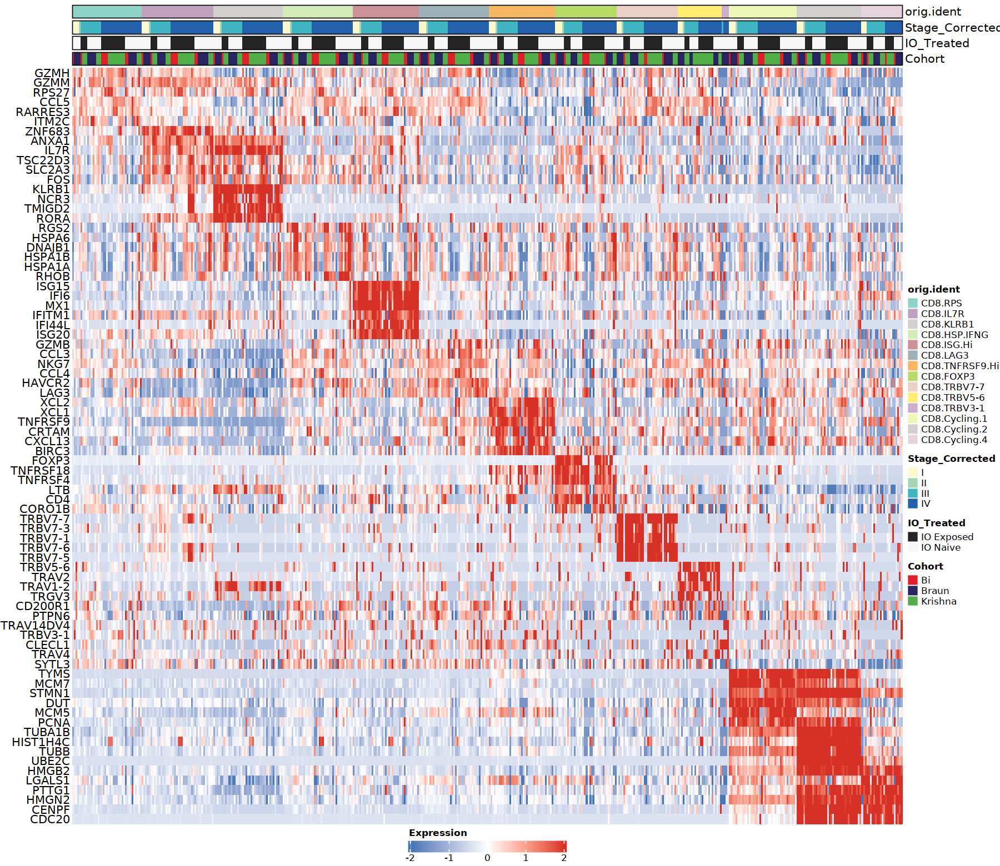

In [83]:
cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("CD8.RPS","CD8.IL7R","CD8.KLRB1","CD8.HSP.IFNG","CD8.ISG.Hi","CD8.LAG3","CD8.TNFRSF9.Hi","CD8.FOXP3","CD8.TRBV7-7","CD8.TRBV5-6","CD8.TRBV3-1","CD8.Cycling.1","CD8.Cycling.2","CD8.Cycling.4"))
cd8_cols_cluster.averages = cd8_cols
names(cd8_cols_cluster.averages) = str_replace_all(names(cd8_cols_cluster.averages), "_",".")

options(repr.plot.width=15, repr.plot.height=13)
colors <- list(cd8_cols_cluster.averages[levels(cluster.averages$orig.ident)],c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = unique(top6$gene),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

### Export

In [84]:
pdf("../../Supp_Figures_Final/Figure_S3_S4/FigureS4B_CD8_DE_Heatmap.pdf", width = 12, height = 12, useDingbats = F)

cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("CD8.RPS","CD8.IL7R","CD8.KLRB1","CD8.HSP.IFNG","CD8.ISG.Hi","CD8.LAG3","CD8.TNFRSF9.Hi","CD8.FOXP3","CD8.TRBV7-7","CD8.TRBV5-6","CD8.TRBV3-1","CD8.Cycling.1","CD8.Cycling.2","CD8.Cycling.4"))
cd8_cols_cluster.averages = cd8_cols
names(cd8_cols_cluster.averages) = str_replace_all(names(cd8_cols_cluster.averages), "_",".")

options(repr.plot.width=15, repr.plot.height=13)
colors <- list(cd8_cols_cluster.averages[levels(cluster.averages$orig.ident)],c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = unique(top6$gene),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

dev.off()

pdf 
  2

### Supp Figure 4C. Dotplot of key phenotypic markers for CD8 subsets used in linear models for IFNg signaling <a name="9"></a>

In [85]:
seur_cd8_model = subset(seur_cd8, subset = BBK_Final_Celltype %in% c("CD8_TNFRSF9_Hi","CD8_LAG3","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_IL7R"))
Idents(seur_cd8_model) = "BBK_Final_Celltype"
table(Idents(seur_cd8_model))


      CD8_LAG3       CD8_IL7R   CD8_HSP_IFNG CD8_TNFRSF9_Hi     CD8_ISG_Hi 
         22043          14492          12178           4995           2429 

In [86]:
Idents(seur_cd8_model) = factor(Idents(seur_cd8_model), levels = c("CD8_TNFRSF9_Hi","CD8_LAG3","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_IL7R"))

In [87]:
table(Idents(seur_cd8_model))


CD8_TNFRSF9_Hi       CD8_LAG3   CD8_HSP_IFNG     CD8_ISG_Hi       CD8_IL7R 
          4995          22043          12178           2429          14492 

In [88]:
seur_cd8_model.small <- subset(seur_cd8_model, cells = colnames(subset(seur_cd8_model, downsample = 2000)))
table(Idents(seur_cd8_model.small))

markers <- FindAllMarkers(seur_cd8_model.small, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA", test.use = "LR",latent.vars = c("Patient","Stage_Corrected_EarlyLate"))


CD8_TNFRSF9_Hi       CD8_LAG3   CD8_HSP_IFNG     CD8_ISG_Hi       CD8_IL7R 
          2000           2000           2000           2000           2000 

Calculating cluster CD8_TNFRSF9_Hi

Calculating cluster CD8_LAG3

Calculating cluster CD8_HSP_IFNG

Calculating cluster CD8_ISG_Hi

Calculating cluster CD8_IL7R



In [89]:
markers %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.8231310,0.910,0.374,0.000000e+00,CD8_TNFRSF9_Hi,TNFRSF9
4.866873e-313,2.2678385,0.539,0.141,1.928206e-308,CD8_TNFRSF9_Hi,XCL1
1.307448e-290,1.7242369,0.887,0.519,5.179979e-286,CD8_TNFRSF9_Hi,HLA-DRA
2.558997e-225,1.9437114,0.522,0.219,1.013849e-220,CD8_TNFRSF9_Hi,CXCL13
6.559372e-213,2.3924201,0.407,0.131,2.598758e-208,CD8_TNFRSF9_Hi,XCL2
8.352578e-240,0.8598822,0.994,0.875,3.309208e-235,CD8_LAG3,NKG7
5.241200e-109,0.8285898,0.643,0.345,2.076511e-104,CD8_LAG3,HAVCR2
1.460578e-61,0.8684115,0.546,0.320,5.786664e-57,CD8_LAG3,CCL3
2.700578e-37,0.7801659,0.808,0.660,1.069942e-32,CD8_LAG3,CCL4


Warning message:
"The following variables were found in both object metadata and the default assay: IFNG
Returning metadata; if you want the feature, please use the assay's key (eg. rna_IFNG)"
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



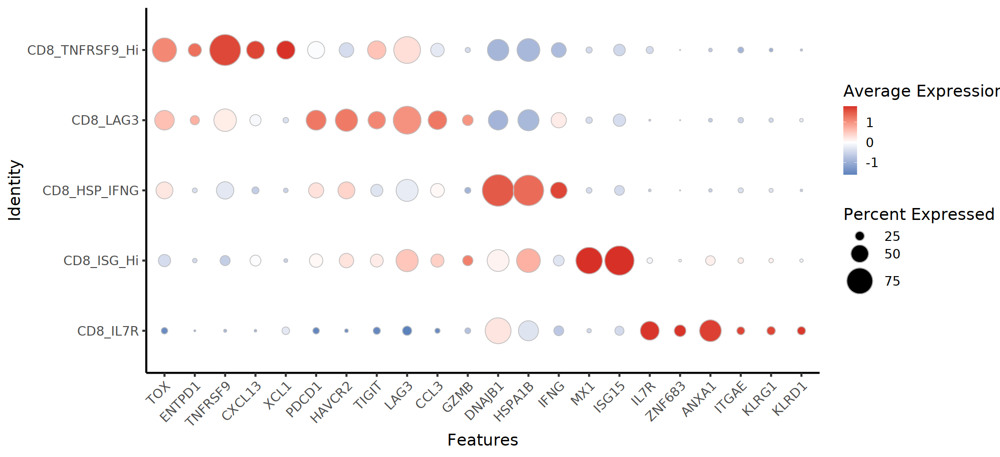

In [90]:
Idents(seur_cd8_model) = factor(Idents(seur_cd8_model), levels = rev(c("CD8_TNFRSF9_Hi","CD8_LAG3","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_IL7R")))

options(repr.plot.width=17.5, repr.plot.height=8)
DotPlot(seur_cd8_model, features = c("TOX","ENTPD1","TNFRSF9","CXCL13","XCL1","PDCD1","HAVCR2","TIGIT","LAG3","CCL3","GZMB","DNAJB1","HSPA1B","IFNG","MX1","ISG15","IL7R","ZNF683","ANXA1","ITGAE","KLRG1","KLRD1"), assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

Idents(seur_cd8_model) = factor(Idents(seur_cd8_model), levels = (c("CD8_TNFRSF9_Hi","CD8_LAG3","CD8_HSP_IFNG","CD8_ISG_Hi","CD8_IL7R")))

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4C_CD8_ModelClusters_Phenotypic_Dotplot.pdf",width = 17.5, height = 8)

### Supp Figure 4D. UMAP of TAM and barplots showing proportion of each sample in each cluster <a name="10"></a>

### Re-read data and colors

[1] 259

[1] "ADAR"     "B2M"      "BATF2"    "BST2"     "C1S"      "CASP1"   
  [7] "CASP8"    "CCRL2"    "CD47"     "CD74"     "CMPK2"    "CMTR1"   
 [13] "CNP"      "CSF1"     "CXCL10"   "CXCL11"   "DDX60"    "DHX58"   
 [19] "EIF2AK2"  "ELF1"     "EPSTI1"   "GBP2"     "GBP4"     "GMPR"    
 [25] "HELZ2"    "HERC6"    "HLA-C"    "IFI27"    "IFI30"    "IFI35"   
 [31] "IFI44"    "IFI44L"   "IFIH1"    "IFIT2"    "IFIT3"    "IFITM1"  
 [37] "IFITM2"   "IFITM3"   "IL15"     "IL4R"     "IL7"      "IRF1"    
 [43] "IRF2"     "IRF7"     "IRF9"     "ISG15"    "ISG20"    "LAMP3"   
 [49] "LAP3"     "LGALS3BP" "LPAR6"    "LY6E"     "MOV10"    "MVB12A"  
 [55] "MX1"      "NCOA7"    "NMI"      "NUB1"     "OAS1"     "OASL"    
 [61] "OGFR"     "PARP12"   "PARP14"   "PARP9"    "PLSCR1"   "PNPT1"   
 [67] "PROCR"    "PSMA3"    "PSMB8"    "PSMB9"    "PSME1"    "PSME2"   
 [73] "RIPK2"    "RNF31"    "RSAD2"    "RTP4"     "SAMD9"    "SAMD9L"  
 [79] "SELL"     "SLC25A28" "SP110"    "STAT2"    "TAP1"     "TDRD7"   
 [85] "TENT5A"   "TMEM140"  "TRAFD1"   "TRIM14"   "TRIM21"   "TRIM25"  
 [91] "TRIM26"   "TRIM5"    "TXNIP"    "UBA7"     "UBE2L6"   "USP18"   
 [97] "WARS1"    "APOL6"    "ARID5B"   "ARL4A"    "AUTS2"    "BANK1"   
[103] "BPGM"     "BTG1"     "C1R"      "CASP3"    "CASP4"    "CASP7"   
[109] "CCL2"     "CCL5"     "CCL7"     "CD274"    "CD38"     "CD40"    
[115] "CD69"     "CD86"     "CDKN1A"   "CFB"      "CFH"      "CIITA"   
[121] "CMKLR1"   "CSF2RB"   "CXCL9"    "EIF4E3"   "FAS"      "FCGR1A"  
[127] "FGL2"     "FPR1"     "GBP6"     "GCH1"     "GPR18"    "GZMA"    
[133] "HIF1A"    "HLA-A"    "HLA-B"    "HLA-DMA"  "HLA-DQA1" "HLA-DRB1"
[139] "HLA-G"    "ICAM1"    "IDO1"     "IFIT1"    "IFNAR2"   "IL10RA"  
[145] "IL15RA"   "IL18BP"   "IL2RB"    "IL6"      "IRF4"     "IRF5"    
[151] "IRF8"     "ISOC1"    "ITGB7"    "JAK2"     "KLRK1"    "LATS2"   
[157] "LCP2"     "LYSMD2"   "MARCHF1"  "METTL7B"  "MT2A"     "MTHFD2"  
[163] "MVP"      "MX2"      "MYD88"    "NAMPT"    "NCOA3"    "NFKB1"   
[169] "NFKBIA"   "NLRC5"    "NOD1"     "NUP93"    "OAS2"     "OAS3"    
[175] "P2RY14"   "PDE4B"    "PELI1"    "PFKP"     "PIM1"     "PLA2G4A" 
[181] "PML"      "PNP"      "PSMA2"    "PSMB10"   "PSMB2"    "PTGS2"   
[187] "PTPN1"    "PTPN2"    "PTPN6"    "RAPGEF6"  "RBCK1"    "RIGI"    
[193] "RIPK1"    "RNF213"   "SAMHD1"   "SECTM1"   "SELP"     "SERPING1"
[199] "SLAMF7"   "SOCS1"    "SOCS3"    "SOD2"     "SPPL2A"   "SRI"     
[205] "SSPN"     "ST3GAL5"  "ST8SIA4"  "STAT1"    "STAT3"    "STAT4"   
[211] "TAPBP"    "TNFAIP2"  "TNFAIP3"  "TNFAIP6"  "TNFSF10"  "TOR1B"   
[217] "UPP1"     "VAMP5"    "VAMP8"    "VCAM1"    "XAF1"     "XCL1"    
[223] "ZBP1"     "ZNFX1"    "HSD17B1"  "CA2"      "CCNA1"    "CXCL1"   
[229] "GALC"     "IFI6"     "MCL1"     "ROBO1"    "SLC6A15"  "THBS1"   
[235] "TIMP3"    "DDX58"    "WARS"     "MARCH1"   "PRIC285"  "FTSJD2"  
[241] "NOS2"     "PDCD1LG2" "LGALS9"   "HMGB1"    "CEACAM1"  "FGL1"    
[247] "HLA-DRA"  "NECTIN2"  "PVR"      "SIGLEC10" "TNFRSF14" "VSIG4"   
[253] "VSIR"     "HLA-E"    "LGALS3"   "CD80"     "LILRB1"   "IL10"    
[259] "CCL22"

Tumor               TAM               CD8       Plasma cell 
        "#A0BAAC"         "#7FC97F"         "#C2AFCE"         "#E4B9A3" 
               DC       Endothelial          T-Helper                NK 
        "#FDC988"         "#FEEB93"         "#D1DD9E"         "#658DAA" 
         Monocyte             T-reg            B cell       CD8 NK-like 
        "#704BA0"         "#D31286"         "#DD2456"         "#C2541E" 
       Fibroblast Perivascular cell            Contam           Omitted 
        "#95603B"         "#666666"          "grey95"          "grey95"


IO Exposed   IO Naive 
    104514     184254 


            Tumor        Fibroblast Perivascular cell       Endothelial 
            18994               277              1691              1781 
              TAM          Monocyte                DC               CD8 
            27684             15072              4522             88457 
      CD8 NK-like                NK          T-Helper             T-reg 
            13563             20422             22656              8618 
           B cell       Plasma cell 
             3330              1304 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



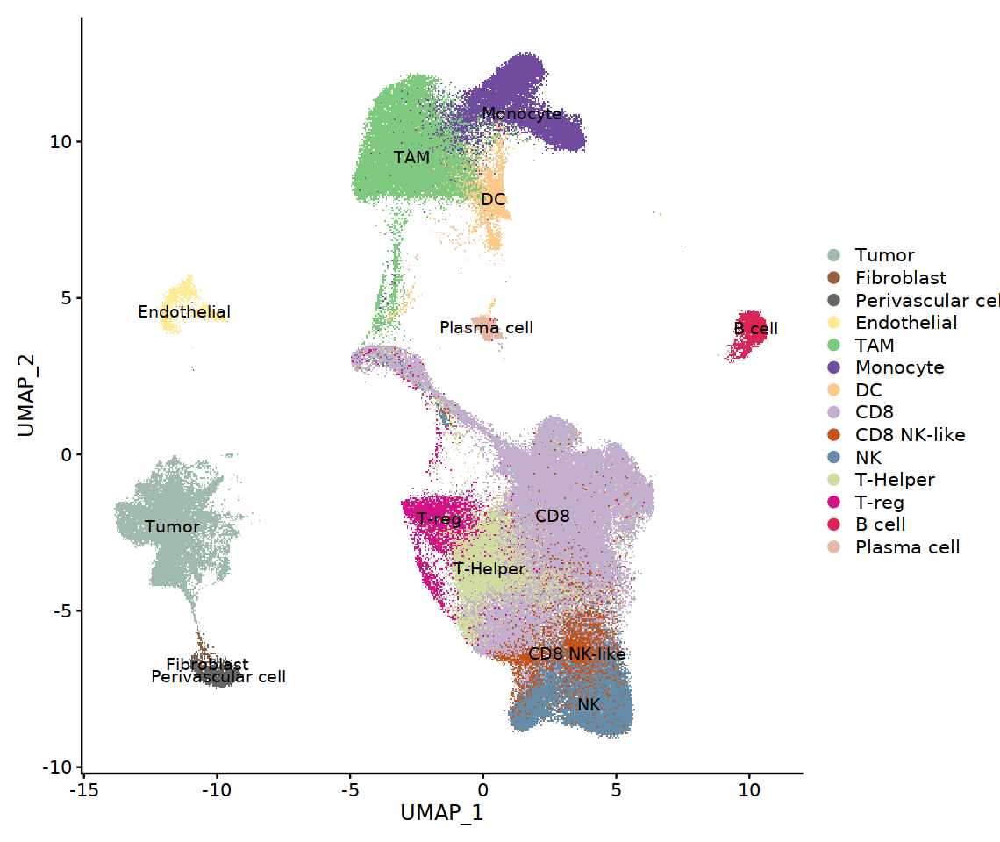

In [95]:
options(repr.plot.width=9.5, repr.plot.height=8)

goi = readRDS("../../Signatures/manuscript_goi_hallmark_benciminn_curated.RDS")
length(goi)

goi

##

celltype_cols = readRDS(file = "../../Data_Objects/celltype_cols.RDS")
celltype_cols

##

seur_full = readRDS("../../Data_Objects/seur_full_BBK_Manuscript.RDS")
table(seur_full$IO_Treated)

Idents(seur_full) = "BBK_Broad_Celltype"

seur_full = subset(seur_full, idents = c("Contam","Omitted"), invert = T)

seur_full$BBK_Broad_Celltype = factor(seur_full$BBK_Broad_Celltype, levels = c("Tumor","Fibroblast","Perivascular cell","Endothelial","TAM","Monocyte","DC","CD8","CD8 NK-like","NK","T-Helper","T-reg","B cell","Plasma cell"))
Idents(seur_full) = "BBK_Broad_Celltype"
table(Idents(seur_full))

DimPlot(seur_full, label = T, cols = celltype_cols[levels(Idents(seur_full))], shuffle = F)

In [96]:
table(seur_full$IO_Treated)

IO_Exposed = unique(subset(seur_full@meta.data, IO_Treated == "IO Exposed")$Sample)
IO_Naive = unique(subset(seur_full@meta.data, IO_Treated == "IO Naive")$Sample)

IO_Exposed
IO_Naive

Stage_Corrected = seur_full@meta.data[,c("Sample","Stage_Corrected","Stage_Corrected_EarlyLate")]
Stage_Corrected = distinct(Stage_Corrected)
head(Stage_Corrected)
dim(Stage_Corrected)


IO Exposed   IO Naive 
     84990     143381 

[1] "Bi_0600855_T3"                    "Bi_0600906_T1"                   
 [3] "Bi_0600913_T1"                    "Bi_0600915_T1_TrueTumor"         
 [5] "IpiNivo_Mixed_Center"             "IpiNivo_Mixed_Far"               
 [7] "IpiNivo_Mixed_Near"               "IpiNivo_Resistant_Center"        
 [9] "IpiNivo_Resistant_Far"            "IpiNivo_Resistant_LymphNode"     
[11] "IpiNivo_Resistant_Near"           "NivoExposed_LowerLateral"        
[13] "NivoExposed_LowerMedial"          "NivoExposed_SupraLateral"        
[15] "Bi_0600912_T1"                    "IpiNivo_CompleteResponse_Center" 
[17] "IpiNivo_CompleteResponse_Lateral" "IpiNivo_CompleteResponse_Medial"

[1] "5pool1_2"           "Bi_0600916_T1"      "Bi_DFCI_0600876_T1"
 [4] "Bi_DFCI_0600890_T1" "UT1_Center"         "UT1_Upper"         
 [7] "UT2_Center"         "UT2_Far"            "UT2_Near"          
[10] "Pool70-10"          "Pool70-6"           "Pool71-5"          
[13] "Pool71-6"           "Pool72-2"           "Pool72-4"          
[16] "Pool73-3"           "Pool73-4"           "Pool73-5"          
[19] "Pool73-6"           "UT1_Lower"          "Pool70-8"          
[22] "Pool71-3"           "Pool71-8"           "Pool72-10"

,Sample,Stage_Corrected,Stage_Corrected_EarlyLate
,<chr>,<chr>,<chr>
GTTCTCGAGAGGTAGA-1.5pool1_2,5pool1_2,I,Early
AAAGCAAAGTGGTCCC-1.Bi_0600855_T3,Bi_0600855_T3,IV,Late
CCGGTAGAGATGTCGG-1.Bi_0600906_T1,Bi_0600906_T1,IV,Late
GACGGCTAGTCCGTAT-1.Bi_0600913_T1,Bi_0600913_T1,IV,Late
AGCTCCTCAAAGGCGT-1.Bi_0600915_T1_TrueTumor,Bi_0600915_T1_TrueTumor,III,Late
TATTACCTCAACTCTT-1.Bi_0600916_T1,Bi_0600916_T1,IV,Late


[1] 42  3

In [97]:
sub = subset(seur_full, subset = BBK_Final_Celltype == "CD8_LAG3")

totalsample = data.frame(table(seur_full$Sample))
colnames(totalsample) = c("Sample","totalcells")
head(totalsample)
nrow(totalsample)

coisample = data.frame(table(sub$Sample))
colnames(coisample) = c("Sample","coi")
head(coisample)
nrow(coisample)

CD8_LAG3 = left_join(coisample, totalsample,by = "Sample")

CD8_LAG3$proportion = CD8_LAG3$coi/CD8_LAG3$totalcells
CD8_LAG3$BBK_Broad_Celltype = rep("CD8_LAG3",nrow(CD8_LAG3))

CD8_LAG3 = mutate(CD8_LAG3, IO_Treated = ifelse(Sample %in% IO_Exposed,"IO Exposed",ifelse(Sample %in% IO_Naive,"IO Naive","NAN")))
CD8_LAG3 = left_join(CD8_LAG3, Stage_Corrected, by = "Sample")

head(CD8_LAG3)

,Sample,totalcells
,<fct>,<int>
1,5pool1_2,12007
2,Bi_0600855_T3,3924
3,Bi_0600906_T1,1605
4,Bi_0600912_T1,213
5,Bi_0600913_T1,2722
6,Bi_0600915_T1_TrueTumor,5726


[1] 42

,Sample,coi
,<fct>,<int>
1,5pool1_2,193
2,Bi_0600855_T3,698
3,Bi_0600906_T1,3
4,Bi_0600912_T1,4
5,Bi_0600913_T1,57
6,Bi_0600915_T1_TrueTumor,770


[1] 41

,Sample,coi,totalcells,proportion,BBK_Broad_Celltype,IO_Treated,Stage_Corrected,Stage_Corrected_EarlyLate
,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>
1,5pool1_2,193,12007,0.016073957,CD8_LAG3,IO Naive,I,Early
2,Bi_0600855_T3,698,3924,0.177879715,CD8_LAG3,IO Exposed,IV,Late
3,Bi_0600906_T1,3,1605,0.001869159,CD8_LAG3,IO Exposed,IV,Late
4,Bi_0600912_T1,4,213,0.018779343,CD8_LAG3,IO Exposed,IV,Late
5,Bi_0600913_T1,57,2722,0.020940485,CD8_LAG3,IO Exposed,IV,Late
6,Bi_0600915_T1_TrueTumor,770,5726,0.134474328,CD8_LAG3,IO Exposed,III,Late


In [98]:
CD8_LAG3_IO_LateStage_Corrected = subset(CD8_LAG3,Stage_Corrected %in% c("III","IV"))
CD8_LAG3_IO_LateStage_Corrected$CD8_LAG3_HiLow_ntile = ntile(CD8_LAG3_IO_LateStage_Corrected$proportion,n = 2)
CD8_LAG3_IO_LateStage_Corrected = mutate(CD8_LAG3_IO_LateStage_Corrected, CD8_LAG3_HiLow_Group = ifelse(CD8_LAG3_HiLow_ntile == 1,"Low","High"))
head(CD8_LAG3_IO_LateStage_Corrected)

,Sample,coi,totalcells,proportion,BBK_Broad_Celltype,IO_Treated,Stage_Corrected,Stage_Corrected_EarlyLate,CD8_LAG3_HiLow_ntile,CD8_LAG3_HiLow_Group
,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
2,Bi_0600855_T3,698,3924,0.177879715,CD8_LAG3,IO Exposed,IV,Late,2,High
3,Bi_0600906_T1,3,1605,0.001869159,CD8_LAG3,IO Exposed,IV,Late,1,Low
4,Bi_0600912_T1,4,213,0.018779343,CD8_LAG3,IO Exposed,IV,Late,1,Low
5,Bi_0600913_T1,57,2722,0.020940485,CD8_LAG3,IO Exposed,IV,Late,1,Low
6,Bi_0600915_T1_TrueTumor,770,5726,0.134474328,CD8_LAG3,IO Exposed,III,Late,2,High
7,Bi_0600916_T1,23,226,0.101769912,CD8_LAG3,IO Naive,IV,Late,2,High


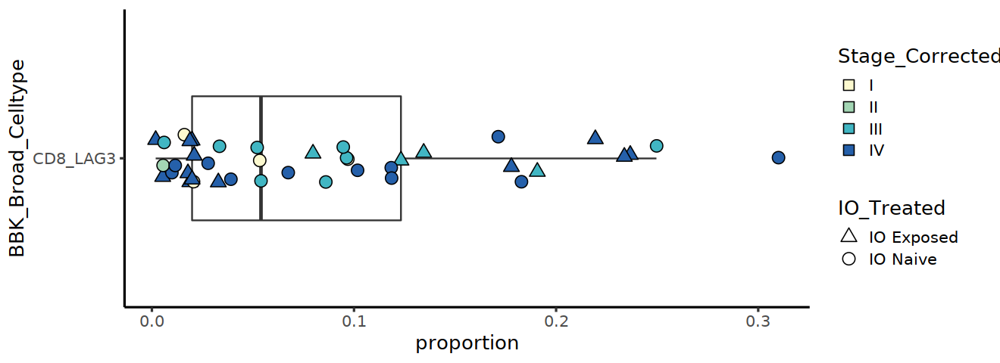

In [99]:
options(repr.plot.width=11, repr.plot.height=4)

ggplot(CD8_LAG3, aes(y = BBK_Broad_Celltype, x = proportion)) +
# stat_density_ridges(quantile_lines = TRUE, alpha = 1,
#                      quantiles = 4,color = "black") +
  geom_boxplot(outlier.shape = NA,width = 0.5) + 
scale_shape_manual(values = c(24,21)) +
scale_fill_manual(values = c("#FCF9CF","#A3D6B4","#41B6C3","#2560AA")) +
geom_jitter(aes(fill = Stage_Corrected, shape = IO_Treated),height = 0.1,size = 4) + 
theme_classic(base_size = 15) +
 guides(fill=guide_legend(override.aes=list(shape=22)))

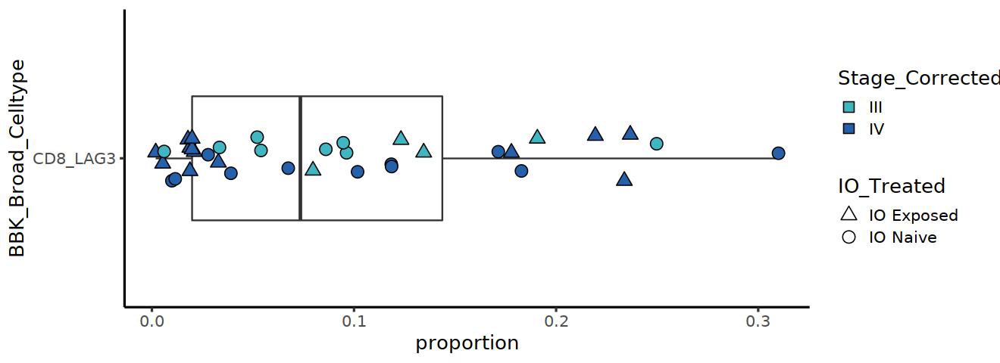

In [100]:
options(repr.plot.width=11, repr.plot.height=4)

ggplot(CD8_LAG3_IO_LateStage_Corrected, aes(y = BBK_Broad_Celltype, x = proportion)) +
# stat_density_ridges(quantile_lines = TRUE, alpha = 1,
#                      quantiles = 4,color = "black") +
  geom_boxplot(outlier.shape = NA,width = 0.5) + 
scale_shape_manual(values = c(24,21)) +
scale_fill_manual(values = c("#41B6C3","#2560AA")) +
geom_jitter(aes(fill = Stage_Corrected, shape = IO_Treated),height = 0.1,size = 4) + 
theme_classic(base_size = 15) +
 guides(fill=guide_legend(override.aes=list(shape=22)))

### Create object containing non-cycling TAM clusters

In [101]:
table(droplevels(subset(seur_full@meta.data, BBK_Broad_Celltype == "TAM")$BBK_Final_Celltype))


TAM_Cycling_3 TAM_Cycling_2 TAM_Cycling_1      TAM_SPP1        TAM_C3 
          256           397           593          6673          6623 
  TAM_SELENOP      TAM_CCL4    TAM_CXCL10       TAM_HSP 
         5198          4497          2956           491 

In [102]:
TAM_Plot = c("TAM_CXCL10","TAM_C3","TAM_CCL4","TAM_SELENOP","TAM_SPP1","TAM_HSP")


IO Exposed   IO Naive 
     15574      15458 

Centering and scaling data matrix

PC_ 1 
Positive:  RPS10, RPS17, NDUFB8, ATP5PO, RPL23A, CD63, RPS20, NDUFC2, CTSD, BRI3 
	   PSMA2, BLOC1S1, RPL27A, JTB, RPL22, RPL13A, APOC1, NDUFA13, RPL26, LDHB 
	   TMBIM4, CTSZ, C1QB, CSNK2B, APOE, ARPC1B, NENF, TYMP, VAMP5, FTL 
Negative:  FOS, PPP1R15A, MT-ND4L, JUN, DUSP1, FOSB, ZFP36, DNAJB1, NR4A2, KLF6 
	   JUNB, RHOB, KLF4, HSPA1B, HSPA1A, NR4A1, GADD45B, MT-ATP8, NFKBIA, MT-RNR2 
	   IER2, IER3, ATF3, NFKBIZ, CD83, SGK1, HSPH1, CDKN1A, NR4A3, TNFAIP3 
PC_ 2 
Positive:  PLD4, C3, CALHM6, NAPSB, OLFML3, GBP4, HLA-DQB2, CX3CR1, HLA-DQA2, PPA1 
	   ANKRD22, GIMAP7, RARRES3, P2RY13, FCER1A, SCIN, ZFP36L2, GBP5, TNFSF10, SFMBT2 
	   HLA-H, CLEC9A, EBI3, MT-RNR1, GBP2, STAT1, GBP1, SIGLEC10, P2RY12, CCND1 
Negative:  FTL, CTSD, LGALS1, FTH1, GPNMB, CSTB, CTSL, LGALS3, S100A9, CYP27A1 
	   GLUL, FABP5, GCHFR, ACP5, CTSB, LMNA, ANXA2, PLIN2, LGMN, NPL 
	   NUPR1, MGLL, C5AR1, SMIM25, PLAUR, TXN, CD52, PLA2G7, BRI3, VAT1 
PC_ 3 
Positive:  CALHM6,

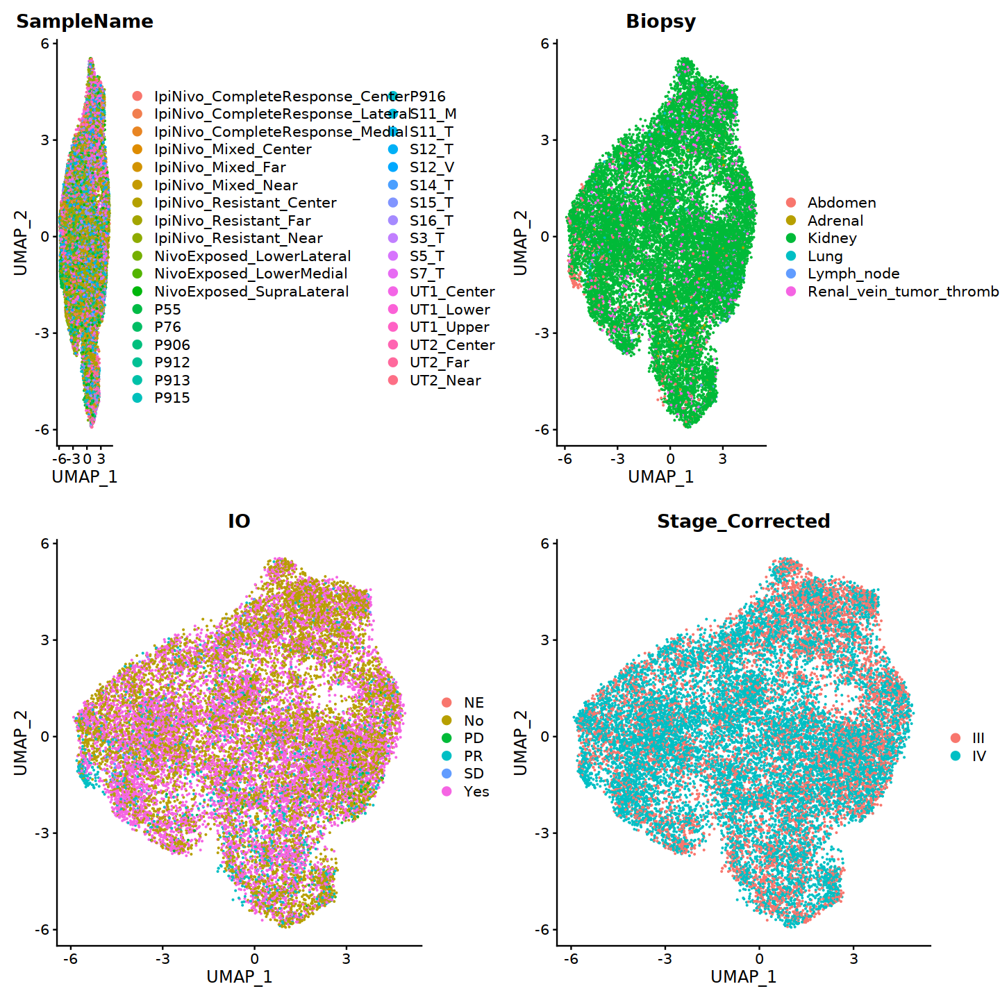

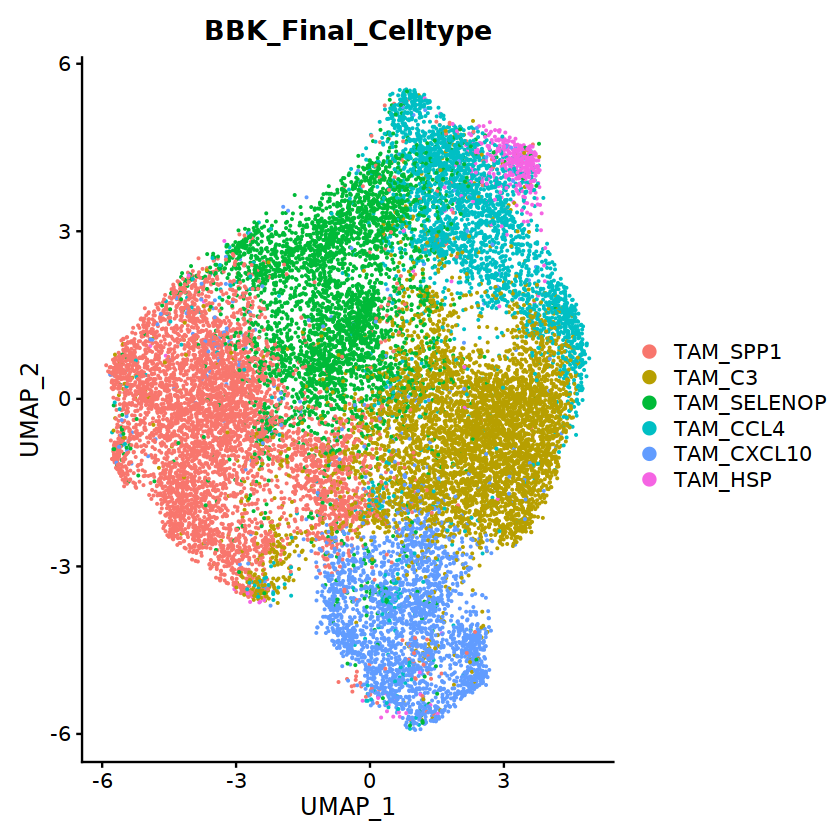

In [103]:
options(repr.plot.width=10, repr.plot.height=8)

seur_monomac = subset(seur_full, subset = BBK_Broad_Celltype %in% c("TAM","Monocyte"))
seur_monomac = subset(seur_monomac, subset = Sample %in% CD8_LAG3_IO_LateStage_Corrected$Sample)

table(seur_monomac$IO_Treated)

#DimPlot(seur_monomac, label = T)

seur_monomac = subset(seur_monomac, subset = BBK_Final_Celltype %in% TAM_Plot)
seur_monomac = NormalizeData(seur_monomac)
seur_monomac = FindVariableFeatures(seur_monomac, selection.method = "vst")
seur_monomac = ScaleData(seur_monomac)
seur_monomac = RunPCA(seur_monomac, npcs = 30,verbose = T)

seur_monomac = RunHarmony(seur_monomac, group.by.vars = c("Cohort","SampleName"))
seur_monomac = RunUMAP(seur_monomac, reduction = "harmony", dims = 1:30)

library(ggpubr)
options(repr.plot.width=12, repr.plot.height=12)
one = DimPlot(seur_monomac, group.by = "SampleName", shuffle = T)
two = DimPlot(seur_monomac, group.by = "Biopsy", shuffle = T)
three = DimPlot(seur_monomac, group.by = "IO", shuffle = T)
four = DimPlot(seur_monomac, group.by = "Stage_Corrected", shuffle = T)
ggarrange(one, two, three, four)

options(repr.plot.width=7, repr.plot.height=7)
DimPlot(seur_monomac, group.by = "BBK_Final_Celltype")

In [104]:
tamcols = piratepal(palette = "appletv")[1:6]
names(tamcols) = c("TAM_SELENOP","TAM_HSP","TAM_C3","TAM_CXCL10","TAM_CCL4","TAM_SPP1")
tamcols

TAM_SELENOP     TAM_HSP      TAM_C3  TAM_CXCL10    TAM_CCL4    TAM_SPP1 
"#5FB233FF" "#6A7F93FF" "#F57206FF" "#EB0F13FF" "#8F2F8BFF" "#1396DBFF"

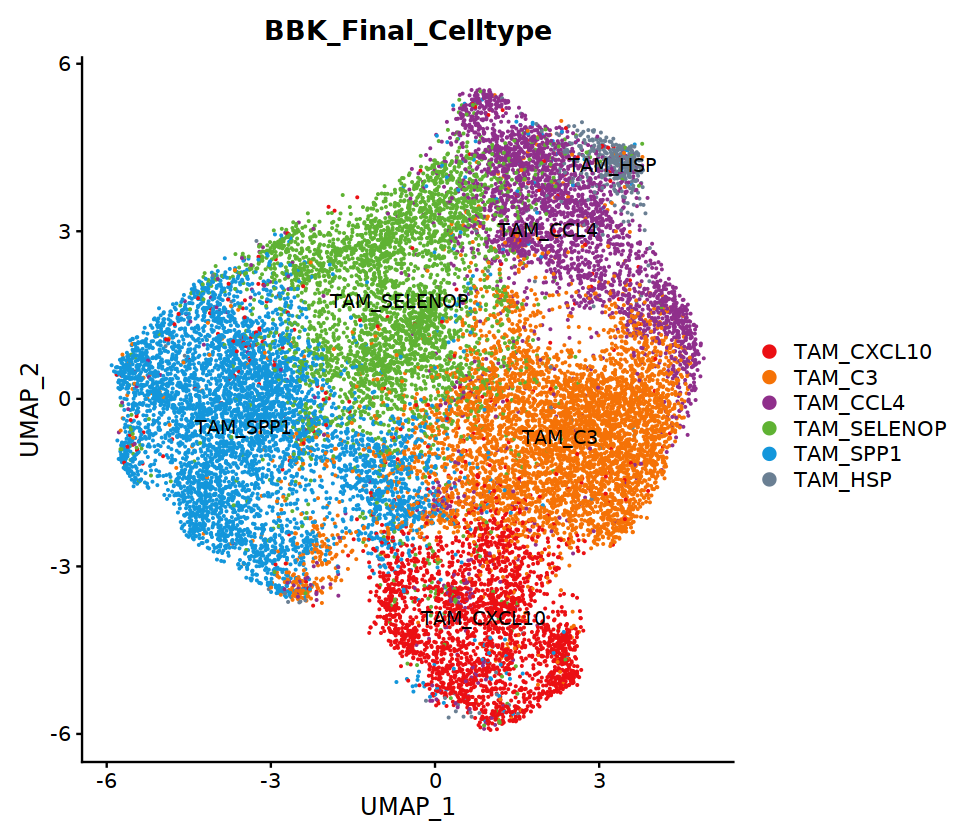

In [105]:
options(repr.plot.width = 8, repr.plot.height=7)

seur_monomac$BBK_Final_Celltype = factor(seur_monomac$BBK_Final_Celltype, levels = c("TAM_CXCL10","TAM_C3","TAM_CCL4","TAM_SELENOP","TAM_SPP1","TAM_HSP"))
Idents(seur_monomac) = "BBK_Final_Celltype"
DimPlot(seur_monomac, group.by = "BBK_Final_Celltype",label = T,cols = tamcols[levels(Idents(seur_monomac))])

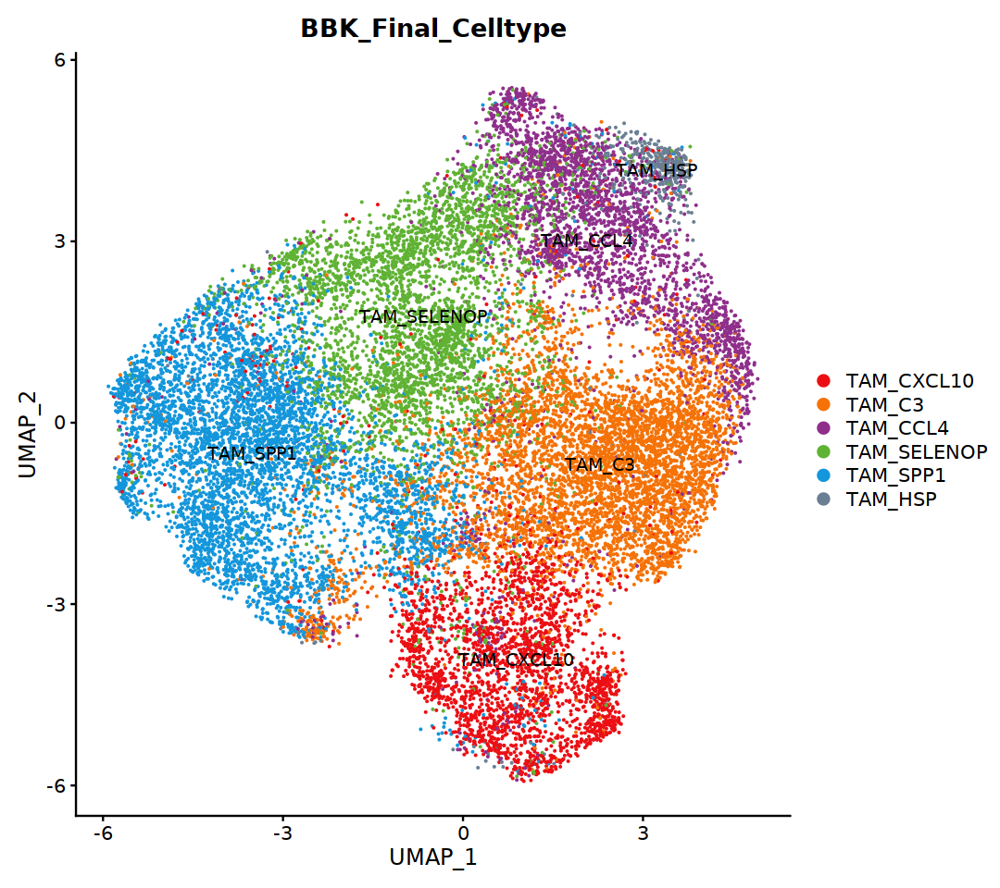

In [115]:
options(repr.plot.width=9, repr.plot.height=8)

DimPlot(seur_monomac, group.by = "BBK_Final_Celltype",label = T,cols = tamcols[levels(Idents(seur_monomac))], raster = F)

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4D_TAM_UMAP.pdf", width = 9, height = 8)

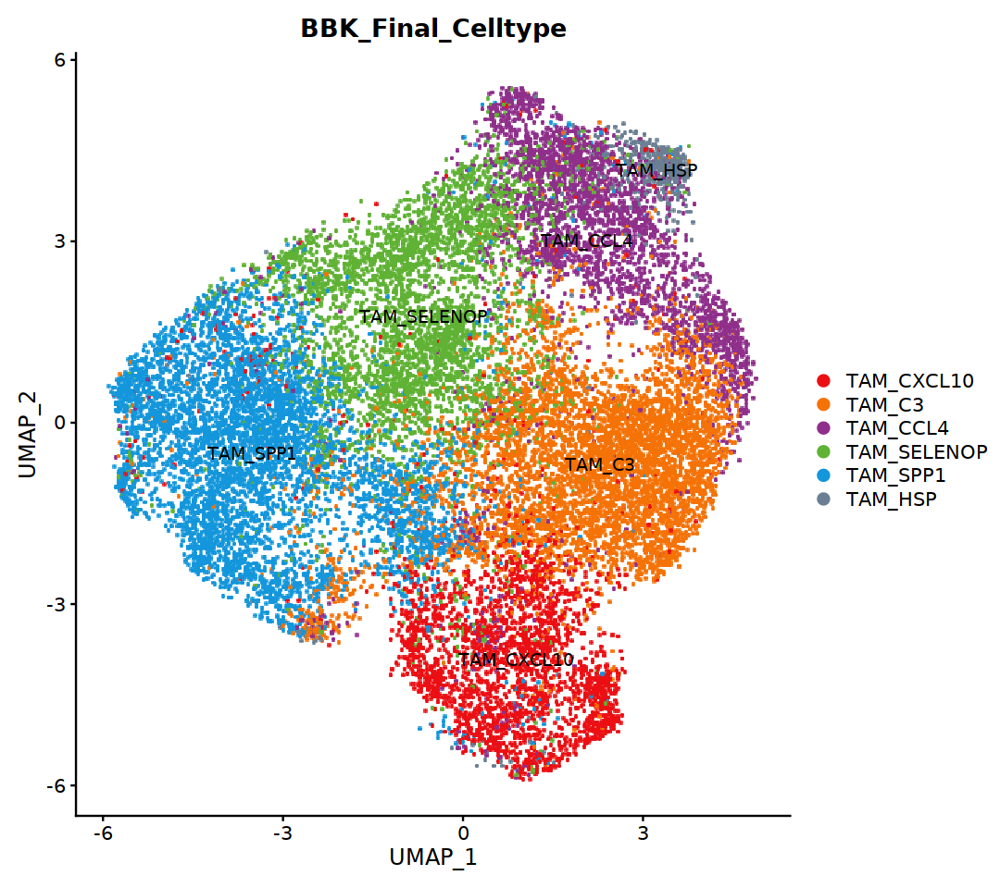

In [116]:
options(repr.plot.width=9, repr.plot.height=8)

DimPlot(seur_monomac, group.by = "BBK_Final_Celltype",label = T,cols = tamcols[levels(Idents(seur_monomac))], raster = T)

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4D_TAM_UMAP_raster.pdf", width = 9, height = 8)

In [117]:
table(seur_monomac$BBK_Final_Celltype)


 TAM_CXCL10      TAM_C3    TAM_CCL4 TAM_SELENOP    TAM_SPP1     TAM_HSP 
       2549        5151        2966        3759        5180         390 

In [118]:
seur_monomac

An object of class Seurat 
39619 features across 19995 samples within 1 assay 
Active assay: RNA (39619 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [119]:
length(unique(seur_monomac$Sample))

[1] 35

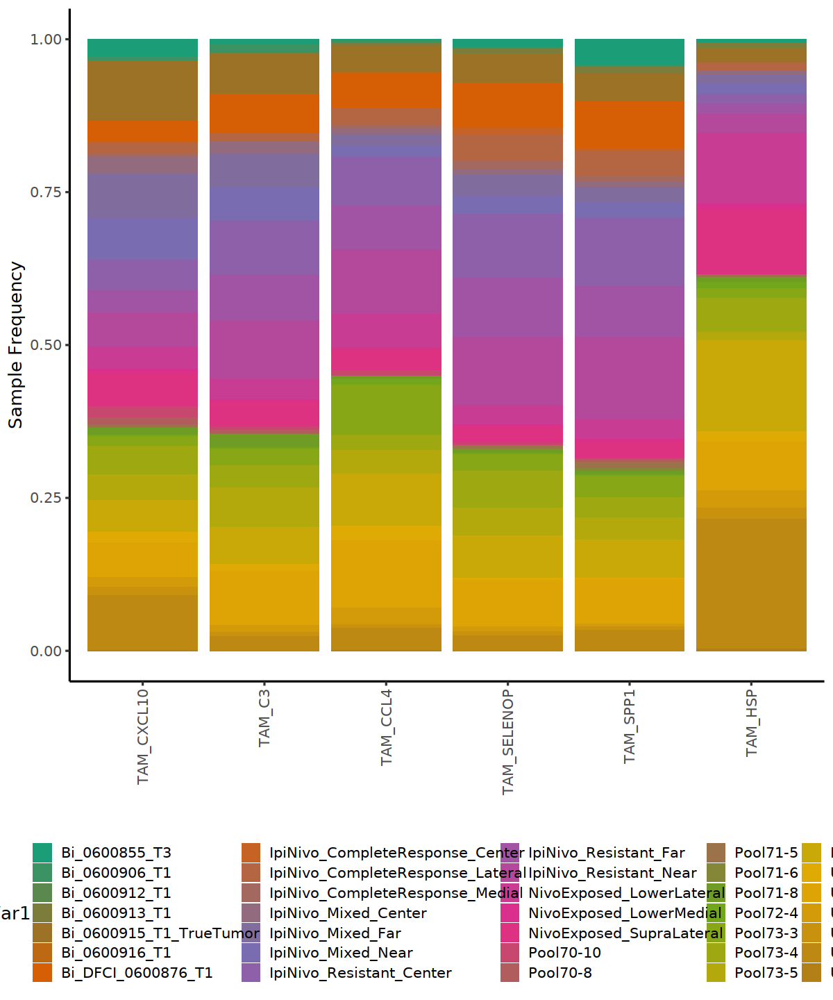

In [120]:
options(repr.plot.width=10, repr.plot.height=12)
props <- prop.table(table(seur_monomac$Sample,Idents(seur_monomac)), margin = 2)
props <- data.frame(props)
ggplot() + geom_bar(aes(y = Freq, x = Var2, fill = Var1), data = props, stat="identity") + 
theme_classic(base_size = 15) + scale_fill_manual(values = colorRampPalette(brewer.pal(8, "Dark2"))(42)) +
xlab(label = "") + ylab(label = "Sample Frequency") + theme(legend.position = "bottom") + theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

ggsave("../../Supp_Figures_Final/Figure_S3_S4/FigureS4D_TAM_SampleProps_Barplot.pdf", width = 8, height = 12)

### Inspect some QC metrics

In [121]:
seur_monomac_meta_df = seur_monomac@meta.data

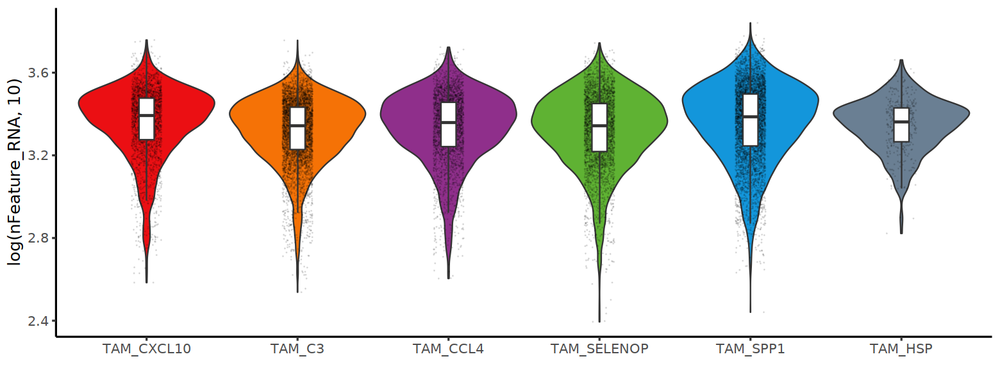

In [122]:
options(repr.plot.width=13, repr.plot.height=5)

nfeat = ggplot(seur_monomac_meta_df, aes(x=BBK_Final_Celltype, y=log(nFeature_RNA,10), fill = BBK_Final_Celltype)) + 
  geom_violin(scale = "width") + geom_jitter_rast(color = "black",alpha = 0.1,width = 0.1,size = 0.01) + 
geom_boxplot(width = 0.1,fill = "white",outlier.shape = NA) + theme_classic(base_size = 15) + 
scale_fill_manual(values = tamcols[levels(seur_monomac_meta_df$BBK_Final_Celltype)]) + theme(legend.position = "none") + xlab(label = "")
nfeat

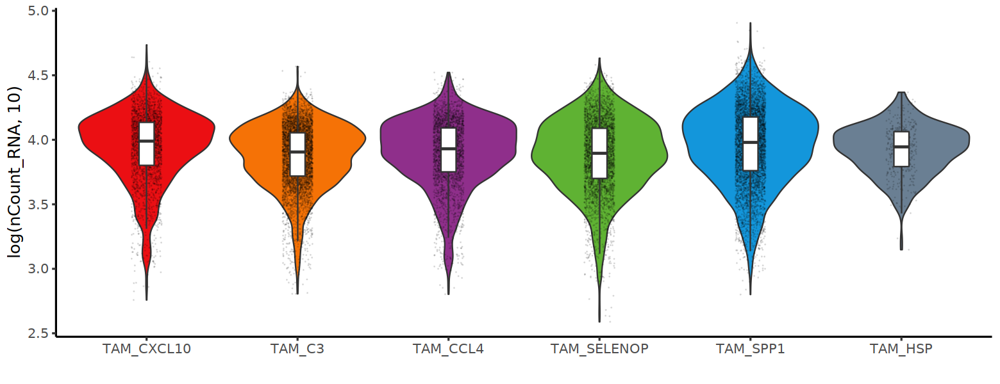

In [123]:
options(repr.plot.width=13, repr.plot.height=5)

ncount = ggplot(seur_monomac_meta_df, aes(x=BBK_Final_Celltype, y=log(nCount_RNA,10), fill = BBK_Final_Celltype)) + 
  geom_violin(scale = "width") + geom_jitter_rast(color = "black",alpha = 0.1,width = 0.1,size = 0.01) + 
geom_boxplot(width = 0.1,fill = "white",outlier.shape = NA) + theme_classic(base_size = 15) + 
scale_fill_manual(values = tamcols[levels(seur_monomac_meta_df$BBK_Final_Celltype)]) + theme(legend.position = "none") + xlab(label = "")
ncount

### Supp Figure 4E. Heatmap of TAM subset markers <a name="11"></a>

In [124]:
markers <- FindAllMarkers(seur_monomac, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA", test.use = "LR",latent.vars = c("Patient"))

Calculating cluster TAM_CXCL10

Calculating cluster TAM_C3

Calculating cluster TAM_CCL4

Calculating cluster TAM_SELENOP

Calculating cluster TAM_SPP1

Calculating cluster TAM_HSP



In [126]:
saveRDS(markers, file = "../../Supp_Figures_Final/Figure_S3_S4/TAM_DE.RDS")

In [127]:
markers_signif = subset(markers, p_val_adj < 0.01)

In [128]:
markers_signif %>%
    group_by(cluster) %>%
    top_n(n = 10, wt = avg_log2FC) -> top10

top10

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,3.7760158,0.623,0.081,0.000000e+00,TAM_CXCL10,CXCL10
0.000000e+00,2.5944689,0.517,0.116,0.000000e+00,TAM_CXCL10,CXCL9
0.000000e+00,2.2859419,0.712,0.374,0.000000e+00,TAM_CXCL10,ISG15
0.000000e+00,1.9863696,0.849,0.329,0.000000e+00,TAM_CXCL10,GBP1
0.000000e+00,1.7917475,0.383,0.083,0.000000e+00,TAM_CXCL10,IFITM1
0.000000e+00,1.6164367,0.305,0.022,0.000000e+00,TAM_CXCL10,CXCL11
0.000000e+00,1.5782714,0.954,0.818,0.000000e+00,TAM_CXCL10,IFITM3
0.000000e+00,1.5572712,0.716,0.256,0.000000e+00,TAM_CXCL10,GBP5
0.000000e+00,1.4778619,0.791,0.379,0.000000e+00,TAM_CXCL10,WARS


### Make cluster averages object

In [129]:
options(repr.plot.width=15, repr.plot.height=9)

seur_monomac$BBK_Final_Celltype_forclustavg = str_replace_all(seur_monomac$BBK_Final_Celltype, "_",".")

cluster.averages <- AverageExpression(seur_monomac, return.seurat = TRUE, group.by = c("BBK_Final_Celltype_forclustavg","Sample"))
Idents(cluster.averages) = factor(Idents(cluster.averages), levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))

Centering and scaling data matrix



In [130]:
head(cluster.averages@meta.data)

celltypes = unique(as.character(cluster.averages@meta.data$orig.ident))

resvec = c()

for (i in 1:length(celltypes)){
    
    sub = row.names(subset(cluster.averages@meta.data, orig.ident == celltypes[i]))
    sub = str_replace_all(sub, paste(celltypes[i],"_",sep = ""),"")
    resvec = c(resvec, sub)

}

resvec

cluster.averages@meta.data$Sample = resvec
head(cluster.averages@meta.data)

metasub = seur_monomac@meta.data[,c("Cohort","Sample","Stage_Corrected","Stage_Corrected_EarlyLate","Biopsy","IO","TKI","Treated","IO_Treated")]
row.names(metasub) = c(1:nrow(metasub))
corner(metasub)

metasub = metasub %>% group_by_at(vars(Cohort:IO_Treated)) %>%
  summarize_all(paste, collapse=",")
corner(metasub)

cluster_meta_df = cluster.averages@meta.data
cluster_meta_df$rownames = row.names(cluster_meta_df)

test = left_join(cluster_meta_df, metasub, by = "Sample")
row.names(test) = test$rownames

dim(test)
head(test)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
TAM.C3_Bi_0600855_T3,TAM.C3,10000,9796
TAM.C3_Bi_0600906_T1,TAM.C3,10000,10543
TAM.C3_Bi_0600913_T1,TAM.C3,10000,2652
TAM.C3_Bi_0600915_T1_TrueTumor,TAM.C3,10000,15917
TAM.C3_Bi_0600916_T1,TAM.C3,10000,2335
TAM.C3_Bi_DFCI_0600876_T1,TAM.C3,10000,17001


[1] "Bi_0600855_T3"                    "Bi_0600906_T1"                   
  [3] "Bi_0600913_T1"                    "Bi_0600915_T1_TrueTumor"         
  [5] "Bi_0600916_T1"                    "Bi_DFCI_0600876_T1"              
  [7] "IpiNivo_CompleteResponse_Lateral" "IpiNivo_CompleteResponse_Medial" 
  [9] "IpiNivo_Mixed_Center"             "IpiNivo_Mixed_Far"               
 [11] "IpiNivo_Mixed_Near"               "IpiNivo_Resistant_Center"        
 [13] "IpiNivo_Resistant_Far"            "IpiNivo_Resistant_Near"          
 [15] "NivoExposed_LowerLateral"         "NivoExposed_LowerMedial"         
 [17] "NivoExposed_SupraLateral"         "Pool70-10"                       
 [19] "Pool70-8"                         "Pool71-5"                        
 [21] "Pool71-8"                         "Pool72-4"                        
 [23] "Pool73-3"                         "Pool73-4"                        
 [25] "Pool73-5"                         "Pool73-6"                        
 [27] "UT1_Center"                       "UT1_Lower"                       
 [29] "UT1_Upper"                        "UT2_Center"                      
 [31] "UT2_Far"                          "Bi_0600855_T3"                   
 [33] "Bi_0600906_T1"                    "Bi_0600912_T1"                   
 [35] "Bi_0600913_T1"                    "Bi_0600915_T1_TrueTumor"         
 [37] "Bi_0600916_T1"                    "Bi_DFCI_0600876_T1"              
 [39] "IpiNivo_CompleteResponse_Center"  "IpiNivo_CompleteResponse_Lateral"
 [41] "IpiNivo_CompleteResponse_Medial"  "IpiNivo_Mixed_Center"            
 [43] "IpiNivo_Mixed_Far"                "IpiNivo_Mixed_Near"              
 [45] "IpiNivo_Resistant_Center"         "IpiNivo_Resistant_Far"           
 [47] "IpiNivo_Resistant_Near"           "NivoExposed_LowerLateral"        
 [49] "NivoExposed_LowerMedial"          "NivoExposed_SupraLateral"        
 [51] "Pool70-10"                        "Pool70-8"                        
 [53] "Pool71-8"                         "Pool72-4"                        
 [55] "Pool73-3"                         "Pool73-4"                        
 [57] "Pool73-5"                         "Pool73-6"                        
 [59] "UT1_Center"                       "UT1_Lower"                       
 [61] "UT1_Upper"                        "UT2_Center"                      
 [63] "UT2_Far"                          "UT2_Near"                        
 [65] "Bi_0600855_T3"                    "Bi_0600906_T1"                   
 [67] "Bi_0600913_T1"                    "Bi_0600915_T1_TrueTumor"         
 [69] "Bi_0600916_T1"                    "Bi_DFCI_0600876_T1"              
 [71] "IpiNivo_CompleteResponse_Center"  "IpiNivo_CompleteResponse_Lateral"
 [73] "IpiNivo_CompleteResponse_Medial"  "IpiNivo_Mixed_Center"            
 [75] "IpiNivo_Mixed_Far"                "IpiNivo_Mixed_Near"              
 [77] "IpiNivo_Resistant_Center"         "IpiNivo_Resistant_Far"           
 [79] "IpiNivo_Resistant_Near"           "NivoExposed_LowerLateral"        
 [81] "NivoExposed_LowerMedial"          "NivoExposed_SupraLateral"        
 [83] "Pool70-10"                        "Pool70-8"                        
 [85] "Pool71-5"                         "Pool71-6"                        
 [87] "Pool71-8"                         "Pool72-4"                        
 [89] "Pool73-3"                         "Pool73-4"                        
 [91] "Pool73-5"                         "Pool73-6"                        
 [93] "UT1_Center"                       "UT1_Lower"                       
 [95] "UT1_Upper"                        "UT2_Center"                      
 [97] "UT2_Far"                          "UT2_Near"                        
 [99] "Bi_0600855_T3"                    "Bi_0600913_T1"                   
[101] "Bi_0600915_T1_TrueTumor"          "IpiNivo_CompleteResponse_Lateral"
[103] "IpiNivo_Mixed_Center"             "IpiNivo_Mixed_Far"               
[105] "IpiNivo_Mixed_Near"               "IpiNivo_

,orig.ident,nCount_RNA,nFeature_RNA,Sample
,<fct>,<dbl>,<int>,<chr>
TAM.C3_Bi_0600855_T3,TAM.C3,10000,9796,Bi_0600855_T3
TAM.C3_Bi_0600906_T1,TAM.C3,10000,10543,Bi_0600906_T1
TAM.C3_Bi_0600913_T1,TAM.C3,10000,2652,Bi_0600913_T1
TAM.C3_Bi_0600915_T1_TrueTumor,TAM.C3,10000,15917,Bi_0600915_T1_TrueTumor
TAM.C3_Bi_0600916_T1,TAM.C3,10000,2335,Bi_0600916_T1
TAM.C3_Bi_DFCI_0600876_T1,TAM.C3,10000,17001,Bi_DFCI_0600876_T1


,Cohort,Sample,Stage_Corrected,Stage_Corrected_EarlyLate,Biopsy
,<chr>,<chr>,<chr>,<chr>,<chr>
1,Bi,Bi_0600855_T3,IV,Late,Abdomen
2,Bi,Bi_0600855_T3,IV,Late,Abdomen
3,Bi,Bi_0600855_T3,IV,Late,Abdomen
4,Bi,Bi_0600855_T3,IV,Late,Abdomen
5,Bi,Bi_0600855_T3,IV,Late,Abdomen


Cohort,Sample,Stage_Corrected,Stage_Corrected_EarlyLate,Biopsy
<chr>,<chr>,<chr>,<chr>,<chr>
Bi,Bi_0600855_T3,IV,Late,Abdomen
Bi,Bi_0600906_T1,IV,Late,Lymph_node
Bi,Bi_0600912_T1,IV,Late,Lymph_node
Bi,Bi_0600913_T1,IV,Late,Lung
Bi,Bi_0600915_T1_TrueTumor,III,Late,Kidney


[1] 191  13

,orig.ident,nCount_RNA,nFeature_RNA,Sample,rownames,Cohort,Stage_Corrected,Stage_Corrected_EarlyLate,Biopsy,IO,TKI,Treated,IO_Treated
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TAM.C3_Bi_0600855_T3,TAM.C3,10000,9796,Bi_0600855_T3,TAM.C3_Bi_0600855_T3,Bi,IV,Late,Abdomen,PR,Yes,Yes,IO Exposed
TAM.C3_Bi_0600906_T1,TAM.C3,10000,10543,Bi_0600906_T1,TAM.C3_Bi_0600906_T1,Bi,IV,Late,Lymph_node,PD,Yes,Yes,IO Exposed
TAM.C3_Bi_0600913_T1,TAM.C3,10000,2652,Bi_0600913_T1,TAM.C3_Bi_0600913_T1,Bi,IV,Late,Lung,SD,Yes,Yes,IO Exposed
TAM.C3_Bi_0600915_T1_TrueTumor,TAM.C3,10000,15917,Bi_0600915_T1_TrueTumor,TAM.C3_Bi_0600915_T1_TrueTumor,Bi,III,Late,Kidney,PR,No,Yes,IO Exposed
TAM.C3_Bi_0600916_T1,TAM.C3,10000,2335,Bi_0600916_T1,TAM.C3_Bi_0600916_T1,Bi,IV,Late,Lymph_node,No,No,No,IO Naive
TAM.C3_Bi_DFCI_0600876_T1,TAM.C3,10000,17001,Bi_DFCI_0600876_T1,TAM.C3_Bi_DFCI_0600876_T1,Bi,IV,Late,Kidney,No,No,No,IO Naive


In [131]:
cluster.averages@meta.data = test
length(unique(cluster.averages$orig.ident))
length(unique(cluster.averages$Cohort))
length(unique(cluster.averages$Biopsy))
length(unique(cluster.averages$Stage_Corrected))
length(unique(cluster.averages$Stage_Corrected_EarlyLate))
length(unique(cluster.averages$Sample))
length(unique(cluster.averages$IO_Treated))

[1] 6

[1] 3

[1] 6

[1] 2

[1] 1

[1] 35

[1] 2

### Heatmap of top 10 DEG for each TAM cluster

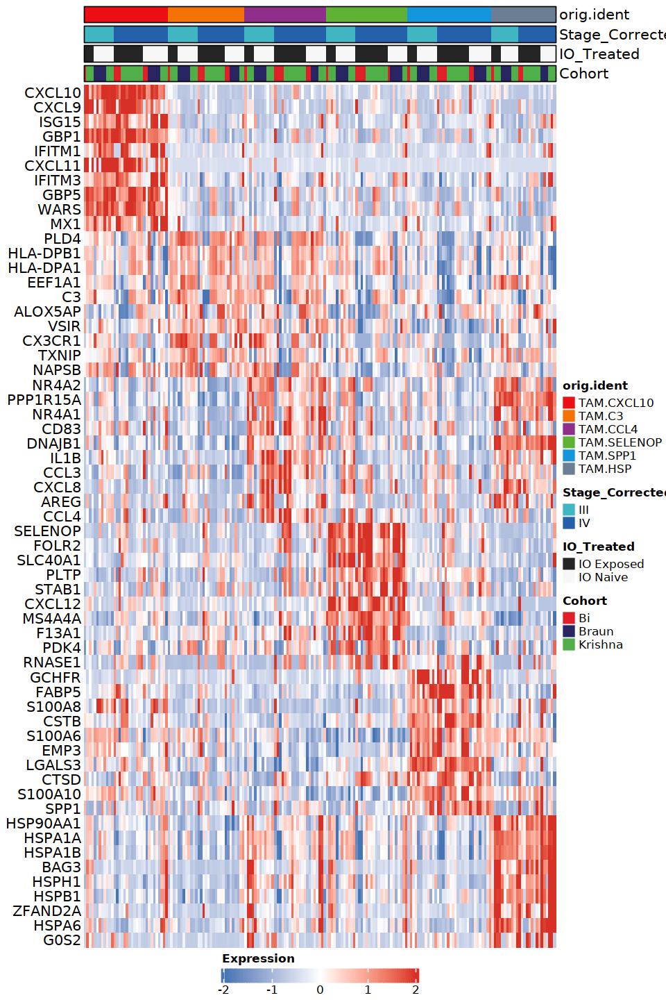

In [132]:
cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))
tamcols_cluster.averages = tamcols
names(tamcols_cluster.averages) = str_replace_all(names(tamcols_cluster.averages), "_",".")

options(repr.plot.width=8, repr.plot.height=12)
colors <- list(tamcols_cluster.averages[levels(cluster.averages$orig.ident)],c("#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = unique(top10$gene),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

### Export

In [133]:
pdf("../../Supp_Figures_Final/Figure_S3_S4/FigureS4E_TAM_DE_Heatmap.pdf", width = 10, height = 12, useDingbats = F)

cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))
tamcols_cluster.averages = tamcols
names(tamcols_cluster.averages) = str_replace_all(names(tamcols_cluster.averages), "_",".")

options(repr.plot.width=10, repr.plot.height=12)
colors <- list(tamcols_cluster.averages[levels(cluster.averages$orig.ident)],c("#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = unique(top10$gene),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

dev.off()

pdf 
  2

### Supp Figure 4F-G. Heatmap of M1 and M2 markers <a name="12"></a>

### Read in M1 and M2 signatures

In [134]:
x <- scan("../../Signatures/bi_he_2021_M1M2_sigs.txt", what="", sep="\n")
# Separate elements by one or more whitepace
y <- strsplit(x, "[[:space:]]+")
# Extract the first vector element and set it as the list element name
names(y) <- sapply(y, `[[`, 1)
#names(y) <- sapply(y, function(x) x[[1]]) # same as above
# Remove the first vector element from each list element
y <- lapply(y, `[`, -1)
y <- lapply(y, `[`, -1)

m1m2 = y
head(m1m2)

$M1_Curated
 [1] "AK3"       "ANGPT2"    "APOL1"     "APOL2"     "APOL3"     "APOL6"    
 [7] "ATF3"      "BCL2A1"    "BIRC3"     "CCL15"     "CCL17"     "CCL19"    
[13] "CCL20"     "CCL22"     "CCL5"      "CCL8"      "CCR7"      "TNFRSF1B" 
[19] "FCGR3A"    "SIGLEC1"   "FCGR2A"    "CD80"      "CD86"      "CH13L2"   
[25] "MT-CO2"    "CSPG2"     "CX3CL1"    "CXCL10"    "CXCL11"    "CXCL13"   
[31] "CXCL9"     "ECGF1"     "EDN1"      "FAS"       "FCGR1A"    "FCGR1B"   
[37] "GADD45G"   "GBP1"      "HESX1"     "HLA-DPB1"  "HSD11B1"   "HSXIAPAF1"
[43] "IGFBP4"    "IL12A"     "IL12B"     "IL15"      "IL15RA"    "IL1B"     
[49] "IL23"      "IL23A"     "IL2RA"     "IL6"       "IL7R"      "INDO"     
[55] "INHBA"     "NOS2"      "IRF1"      "MARCO"     "OAS2"      "OASL"     
[61] "PBEF1"     "PDGFA"     "PFKP"      "PLA1A"     "PSMA2"     "PSMB9"    
[67] "PSME2"     "PTX3"      "SLC21A15"  "SLC2A6"    "SLC31A2"   "SLC7A5"   

$M2_Curated
 [1] "ADK"      "ALOX15"   "ARF7"     "ARG1"     "CA2"      "CCL12"   
 [7] "CCL13"    "CCL14"    "CCL18"    "CCL2"     "CCL23"    "CCL26"   
[13] "CCL3"     "CCL4"     "CCL6"     "CCL7"     "CCL9"     "CD163"   
[19] "CD1A"     "CD1B"     "CD200R"   "CD204"    "MSR1"     "MRC1"    
[25] "CD36"     "CERK"     "CHN2"     "CLEC4A"   "CLECSF13" "CTSC"    
[31] "CTSD"     "CXCR4"    "DCL-1"    "CD209"    "CLEC7A"   "EGR2"    
[37] "F13A1"    "FCER2"    "FGL2"     "FN1"      "GAS7"     "GPR86"   
[43] "HEXB"     "HNMT"     "HMOX1"    "HRH1"     "HS3ST1"   "HS3ST2"  
[49] "IDO1"     "IGF1"     "IL10"     "ILIRN"    "IL27RA"   "LIPA"    
[55] "LTA4H"    "LYVE1"    "MAF"      "MS4A4A"   "MS4A6A"   "P2RY14"  
[61] "P2RY5"    "PPARG"    "SEPP1"    "SLC21A9"  "SLC38A6"  "SLC4A7"

In [135]:
m1 = intersect(m1m2$M1_Curated, row.names(seur_monomac))
m2 = intersect(m1m2$M2_Curated, row.names(seur_monomac))

length(m1)
length(m2)

[1] 64

[1] 53

### M1 genes

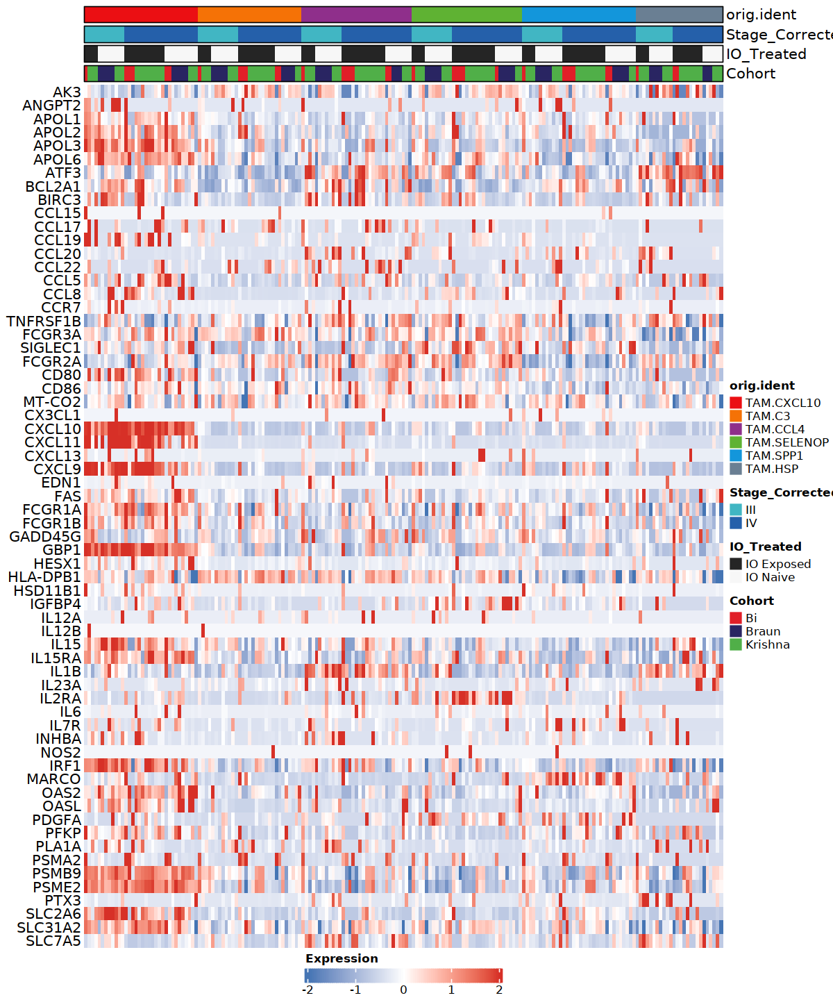

In [136]:
cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))
tamcols_cluster.averages = tamcols
names(tamcols_cluster.averages) = str_replace_all(names(tamcols_cluster.averages), "_",".")

options(repr.plot.width=10, repr.plot.height=12)
colors <- list(tamcols_cluster.averages[levels(cluster.averages$orig.ident)],c("#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = c(m1),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

### Export

In [137]:
pdf("../../Supp_Figures_Final/Figure_S3_S4/FigureS4F_TAM_M1Genes_Heatmap.pdf", width = 10, height = 12, useDingbats = F)

cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))
tamcols_cluster.averages = tamcols
names(tamcols_cluster.averages) = str_replace_all(names(tamcols_cluster.averages), "_",".")

options(repr.plot.width=10, repr.plot.height=12)
colors <- list(tamcols_cluster.averages[levels(cluster.averages$orig.ident)],c("#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = c(m1),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

dev.off()

pdf 
  2

### M2 genes

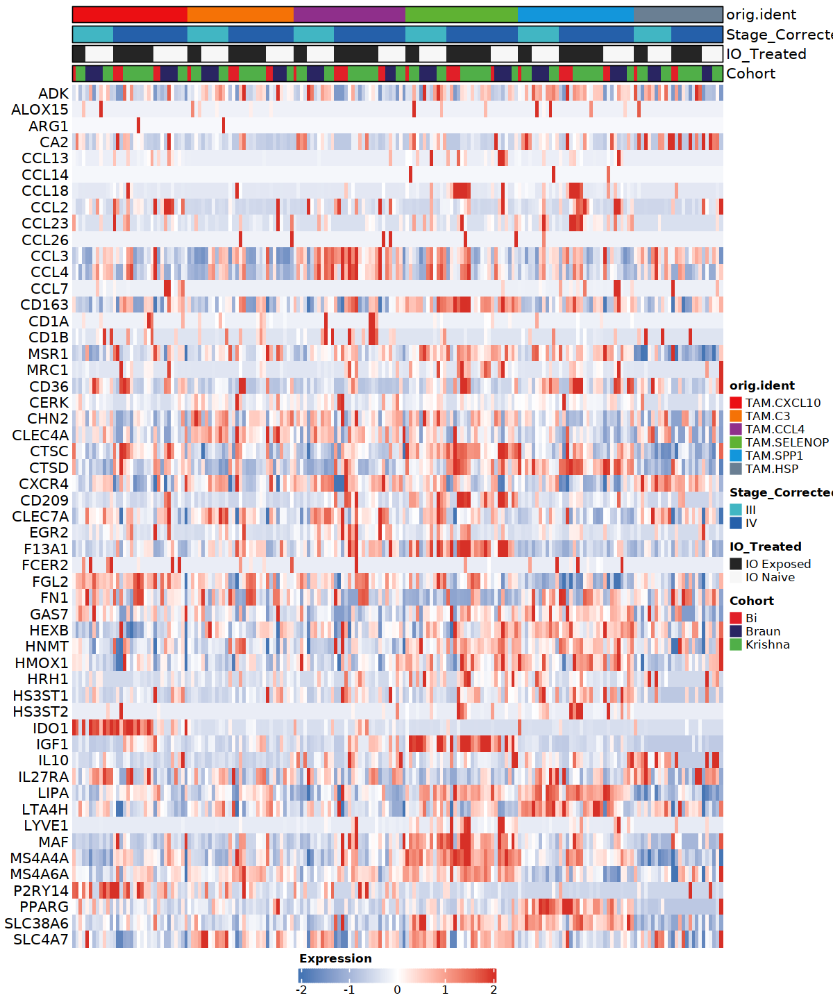

In [138]:
cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))
tamcols_cluster.averages = tamcols
names(tamcols_cluster.averages) = str_replace_all(names(tamcols_cluster.averages), "_",".")

options(repr.plot.width=10, repr.plot.height=12)
colors <- list(tamcols_cluster.averages[levels(cluster.averages$orig.ident)],c("#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = c(m2),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

In [139]:
pdf("../../Supp_Figures_Final/Figure_S3_S4/FigureS4G_TAM_M2Genes_Heatmap.pdf", width = 10, height = 12, useDingbats = F)

cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c("TAM.CXCL10","TAM.C3","TAM.CCL4","TAM.SELENOP","TAM.SPP1","TAM.HSP"))
tamcols_cluster.averages = tamcols
names(tamcols_cluster.averages) = str_replace_all(names(tamcols_cluster.averages), "_",".")

options(repr.plot.width=10, repr.plot.height=12)
colors <- list(tamcols_cluster.averages[levels(cluster.averages$orig.ident)],c("#41B6C3","#2560AA"),c("#252525","#f7f7f7"),c("#E11F28","#292562","#50AF48"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = c(m2),
              sort_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_var = c("orig.ident","Stage_Corrected","IO_Treated","Cohort"),
              anno_colors = colors)

dev.off()

pdf 
  2

In [140]:
print(sessionInfo())
print(version)

R version 4.1.0 (2021-05-18)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Red Hat Enterprise Linux Server 7.9 (Maipo)

Matrix products: default
BLAS:   /usr/lib64/libblas.so.3.4.2
LAPACK: /broad/software/free/Linux/redhat_7_x86_64/pkgs/r_4.1.0/lib64/R/lib/libRlapack.so

locale:
[1] C

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] ggrastr_1.0.2          reshape2_1.4.4         yarrr_0.1.5           
 [4] circlize_0.4.15        BayesFactor_0.9.12-4.2 coda_0.19-4           
 [7] jpeg_0.1-9             viridis_0.6.1          viridisLite_0.4.2     
[10] broom_1.0.1            magrittr_2.0.3         pheatmap_1.0.12       
[13] ggridges_0.5.4         hrbrthemes_0.8.0       cowplot_1.1.1         
[16] Scillus_0.5.0          lmerTest_3.1-3         lme4_1.1-31           
[19] Matrix_1.5-1           RColorBrewer_1.1-3     glue_1.7.0            
[22] ggrepel_0.9.2          ggpubr_0.4.0           dplyr_1.0.10